<a href="https://colab.research.google.com/github/KurusuBlueCat/deep-lob/blob/main/Copy_of_colab_notebook_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/

/content


In [ ]:
!npx degit KurusuBlueCat/deep-lob -f

npx: installed 1 in 2.263s
> destination directory is not empty. Using --force, continuing
> cloned KurusuBlueCat/deep-lob#HEAD


In [ ]:
!pip install tf-nightly

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 491.2/491.2 MB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 83.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 99.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 441.0/441.0 kB 46.9 MB/s eta 0:00:00
  Attempting uninstall: flatbuffers
    Found existing installation: flatbuffers 23.3.3
    Uninstalling flatbuffers-23.3.3:
      Successfully uninstalled flatbuffers-23.3.3


In [ ]:
import keras
import tensorflow as tf
from keras.utils import Sequence
from keras import layers
from keras.callbacks import CSVLogger
from matplotlib import pyplot as plt
from sklearn.model_selection import KFold
import json
from dataclasses import dataclass, asdict
import ast
import os
from typing import Union, List
import datetime
import time
from sklearn.utils.class_weight import compute_class_weight

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
import stride_data
from collections import defaultdict

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
#this path should link to a folder in your drive that contains the data required.
#will also output run report there at output/ folder
gdrive_data_folder = "/content/drive/MyDrive/github_repo/deep-lob"
# gdrive_data_folder = "."

In [ ]:
from collections import namedtuple
Chunk = namedtuple('Chunk', ['lob', 'factor', 'label'])

In [ ]:
def get_factor_itr(factor_file_list=[f'factor_22.csv', 'factor_23.csv'], base_folder=f'{gdrive_data_folder}/factor',
                   chunksize=500000):
    itr_list = []
    for f_name in factor_file_list:
        itr_list.append(pd.read_csv(fr'{base_folder}/{f_name}', chunksize=chunksize))

    for df_tuple in zip(*itr_list):
        df_list = []
        for df in df_tuple:
            df['time'] = pd.to_datetime(df['time'])
            df = df.set_index('time').sort_index()
            # print(df.index.min(), df.index.max())
            df = df[~df.index.duplicated()]
            # print(df.index.min(), df.index.max())
            df_list.append(df)
        yield pd.concat(df_list, axis=1)

In [ ]:
chunksize = 100000

all_feature = ['volume', 'bid_1', 'bid_1', 'bid_size_1', 'ask_1',
       'ask_size_1', 'bid_2', 'bid_size_2', 'ask_2', 'ask_size_2', 'bid_3',
       'bid_size_3', 'ask_3', 'ask_size_3', 'bid_4', 'bid_size_4', 'ask_4',
       'ask_size_4', 'bid_5', 'bid_size_5', 'ask_5', 'ask_size_5', 'vwap']

lob_feature = ['bid_1', 'bid_size_1', 'ask_1',
               'ask_size_1', 'bid_2', 'bid_size_2', 'ask_2', 'ask_size_2', 'bid_3',
               'bid_size_3', 'ask_3', 'ask_size_3', 'bid_4', 'bid_size_4', 'ask_4',
               'ask_size_4', 'bid_5', 'bid_size_5', 'ask_5', 'ask_size_5']

def get_chunk_from_file_gen(label_name='2_min_tp4_sl2_10yuan_1delay_target'):
    data_itr = pd.read_csv(f'{gdrive_data_folder}/data/data_night_shifted_au.csv.gz', chunksize=chunksize)
    label_itr = pd.read_csv(f'{gdrive_data_folder}/label/{label_name}.csv', chunksize=chunksize)
    factor_itr = get_factor_itr(['factor_24.csv', 'factor_23.csv'], chunksize=chunksize)

    for df, fac, label in zip(data_itr, factor_itr, label_itr):
        df['time'] = pd.to_datetime(df['time'])
        df = df.set_index('time').sort_index()

        label['time'] = pd.to_datetime(label['time'])
        label = label.set_index('time').sort_index()

        df = df.loc[~df.index.duplicated()]
        fac = fac.loc[~fac.index.duplicated()]
        label = label.loc[~label.index.duplicated()]
        # print(df.index.max(), label.index.max(), fac.index.max())
        if (fac.index.max() != label.index.max()) or (fac.index.max() != df.index.max()):
            raise RuntimeError("Index do not match!")

        yield Chunk(df, fac, label), label.index.max()

def concat_chunk(*chunk_tuple):
    arg_list = []
    for df_tuple in zip(*chunk_tuple):
        df = pd.concat(df_tuple).sort_index()
        df = df.loc[~df.index.duplicated()]
        arg_list.append(df)
    return Chunk(*arg_list)

def get_weekly_data_gen(skip_to=None, label_path='get_chunk_from_file_gen'):
    print('Data loading started')
    chunk_gen = get_chunk_from_file_gen(label_path)
    while True:
        chunk, latest = next(chunk_gen)
        print(f"                                         ", end='\r')
        time.sleep(0)
        print(f"{latest=}", end='\r')
        time.sleep(0)
        if skip_to is not None:
            if latest < skip_to:
                continue

        if (chunk.label.index.day_of_week == 0).sum() > 0:
            start = chunk.label[chunk.label.index.day_of_week == 0].index.date.min()
            start: pd.Timestamp = pd.Timestamp(start)
            end = start + pd.Timedelta(5,'d') #end on friday midnight
            break

    chunk = Chunk(*[data[data.index >= start] for data in chunk])
    for new_chunk, latest in chunk_gen:
        chunk = concat_chunk(chunk, new_chunk)
        while latest > end:
            print(f"                                                  ", end='\r')
            time.sleep(0)
            print(f"{latest=}", end='\r')
            time.sleep(0)
            to_yield = Chunk(*(df.loc[start:end] for df in chunk))
            chunk = Chunk(*(df.loc[end:] for df in chunk))
            start = start + pd.Timedelta(7,'d')
            end = end + pd.Timedelta(7,'d')
            yield to_yield

def get_chunk_list_gen(list_len=2, skip_to=None, end=None, label_path='get_weekly_data_gen'):
    out_list = []
    weekly_gen = get_weekly_data_gen(skip_to, label_path)
    for week_chunk in weekly_gen:
        if (end is not None) and (week_chunk.label.index.max() > end):
            break
        out_list.append(week_chunk)
        if len(out_list) < list_len:
            continue
        if len(out_list) > list_len:
            out_list = out_list[1:] #basically, pop left
        yield out_list

def split_market(chunk, avoid_market_edge = datetime.timedelta(minutes=5)):
    chunk_arg = []
    for df in chunk:
        night_df = df.loc[(df.index.time >= (datetime.datetime(1970,1,1,21,0,0)+avoid_market_edge).time())
                        | (df.index.time <= (datetime.datetime(1970,1,1,2,30,0)-avoid_market_edge).time())] #night market
        morning_df = df.loc[(df.index.time >= (datetime.datetime(1970,1,1,9,0,0)+avoid_market_edge).time())
                            & (df.index.time <= (datetime.datetime(1970,1,1,11,30,0)-avoid_market_edge).time())] #morning market
        afternoon_df = df.loc[(df.index.time >= (datetime.datetime(1970,1,1,13,30,0)+avoid_market_edge).time())
                            & (df.index.time <= (datetime.datetime(1970,1,1,15,0,0)-avoid_market_edge).time())] #afternoon market
        chunk_arg.append((morning_df, afternoon_df, night_df))

    return tuple(Chunk(*df_list) for df_list in zip(*chunk_arg))

def get_confusion(true, pred):
    pred = pd.DataFrame(pred, columns=['short', 'neutral', 'long'])

    true = pd.DataFrame(true, columns=['true_short', 'true_neutral', 'true_long'])
    result = pred.join(true)
    s_pred = result.loc[result.iloc[:,:3].max(1) == result['short']].iloc[:,3:].sum()
    n_pred = result.loc[result.iloc[:,:3].max(1) == result['neutral']].iloc[:,3:].sum()
    l_pred = result.loc[result.iloc[:,:3].max(1) == result['long']].iloc[:,3:].sum()
    confusion = pd.concat([s_pred, n_pred, l_pred], axis=1)
    confusion.columns = ['short', 'neutral', 'long']
    return confusion

In [ ]:

# training_week = 8
# skip_to = pd.Timestamp('2022-11-01 00:00:00.000') #use this to skip to the period we want
# # skip_to = None
# # end = pd.Timestamp('2022-07-15 23:59:59.500') #use this to fix when to stop training
# end = pd.Timestamp('2023-01-01 00:00:00')

# chunk_list_gen = get_chunk_list_gen(training_week+1, skip_to=skip_to, end=end)
# for i, chunk_list in enumerate(chunk_list_gen):
#     break

# train_chunk = concat_chunk(*chunk_list[:training_week])
# walk_forward_chunk = chunk_list[-1]

# morning_train_chunk, afternoon_train_chunk, night_train_chunk = split_market(train_chunk)
# morning_wf_chunk, afternoon_wf_chunk, night_wf_chunk = split_market(walk_forward_chunk)

In [ ]:


# lookback = 50 #this number of timestep per batch
# batch_size = 1000 #this number of samples in a batch

# chunk = morning_train_chunk

# sp_list_list = []
# for chunk in [morning_train_chunk, afternoon_train_chunk, night_train_chunk]:

#     X = chunk.lob.loc[:, all_feature].join(chunk.factor)
#     y = chunk.label

#     sp_list : List[stride_data.SequencePair] = stride_data.create_train_val_sequence_cv(X, y.iloc[:, 0], cv=4, lookback=lookback,
#                                             batch_size=batch_size, batch_no=None,
#                                             shuffle=False)

#     sp_list_list.append(sp_list)

# sequence_pair_list_per_cv = list(zip(*sp_list_list))
# sequence_list_per_cv = [stride_data.CombinedSequence(*[sequence_pair_list_per_cv[i][j].train_sequence
#                         for j in range(len(sequence_pair_list_per_cv[i]))])
#                         for i in range(len(sequence_pair_list_per_cv))]

In [ ]:
keras.regularizers.L2(l2=0.005)

In [ ]:
def make_model_original(lookback, feature_no, lob_unit, inception_unit, lstm_unit, *args, **kwargs):

    input_layer = layers.Input(shape=(lookback, feature_no))
    lob_layer = layers.Reshape(target_shape=(lookback,feature_no,1))(input_layer)

    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(1,2), strides=(1,2))(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(5,1), padding='same')(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(1,2), strides=(1,2))(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(5,1), padding='same')(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(1,5))(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(5,1), padding='same')(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    inception_act = 'leaky_relu'

    inception_1 = layers.Conv2D(inception_unit, (1,1), padding='same', activation=inception_act)(lob_layer)
    inception_1 = layers.LeakyReLU(alpha=0.01)(inception_1)
    inception_1 = layers.Conv2D(inception_unit, (3,1), padding='same', activation=inception_act)(inception_1)
    inception_1 = layers.LeakyReLU(alpha=0.01)(inception_1)

    inception_2 = layers.Conv2D(inception_unit, (1,1), padding='same', activation=inception_act)(lob_layer)
    inception_2 = layers.LeakyReLU(alpha=0.01)(inception_2)
    inception_2 = layers.Conv2D(inception_unit, (5,1), padding='same', activation=inception_act)(inception_2)
    inception_2 = layers.LeakyReLU(alpha=0.01)(inception_2)

    inception_3 = layers.MaxPooling2D((3,1), strides=(1,1), padding='same')(lob_layer)
    inception_3 = layers.LeakyReLU(alpha=0.01)(inception_3)
    inception_3 = layers.Conv2D(inception_unit, (1,1), padding='same', activation=inception_act)(inception_3)
    inception_3 = layers.LeakyReLU(alpha=0.01)(inception_3)

    inception = tf.keras.layers.concatenate([inception_1, inception_2, inception_3], axis=3)
    inception = layers.Reshape((lookback, inception_unit*3))(inception)

    lstm = layers.LSTM(lstm_unit)(inception)
    output = layers.Dense(3, activation='softmax')(lstm)

    model = keras.Model(input_layer, output)

    return model

def make_model_overfitter(lookback, feature_no, lob_unit, inception_unit, lstm_unit, *args, **kwargs):

    input_layer = layers.Input(shape=(lookback, feature_no))
    lob_layer = layers.Reshape(target_shape=(lookback,feature_no,1))(input_layer)

    inception_act = 'linear'
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(1,2), strides=(1,2), activation=inception_act)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(5,1), padding='same', activation=inception_act)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(1,2), strides=(1,2), activation=inception_act)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(5,1), padding='same', activation=inception_act)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(1,5), activation=inception_act)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(5,1), padding='same', activation=inception_act)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)

    inception_act = 'linear'

    inception_1 = layers.Conv2D(inception_unit, (1,1), padding='same', activation=inception_act)(lob_layer)
    inception_1 = layers.LeakyReLU(alpha=0.01)(inception_1)
    inception_1 = layers.Conv2D(inception_unit, (3,1), padding='same', activation=inception_act)(inception_1)
    inception_1 = layers.LeakyReLU(alpha=0.01)(inception_1)

    inception_2 = layers.Conv2D(inception_unit, (1,1), padding='same', activation=inception_act)(lob_layer)
    inception_2 = layers.LeakyReLU(alpha=0.01)(inception_2)
    inception_2 = layers.Conv2D(inception_unit, (5,1), padding='same', activation=inception_act)(inception_2)
    inception_2 = layers.LeakyReLU(alpha=0.01)(inception_2)

    inception_3 = layers.MaxPooling2D((3,1), strides=(1,1), padding='same')(lob_layer)
    inception_3 = layers.LeakyReLU(alpha=0.01)(inception_3)
    inception_3 = layers.Conv2D(inception_unit, (1,1), padding='same', activation=inception_act)(inception_3)
    inception_3 = layers.LeakyReLU(alpha=0.01)(inception_3)

    inception = tf.keras.layers.concatenate([inception_1, inception_2, inception_3], axis=3)
    inception = layers.Reshape((lookback, inception_unit*3))(inception)

    lstm = layers.Dense(lstm_unit)(inception)
    lstm = layers.LeakyReLU(alpha=0.01)(lstm)
    lstm = layers.LSTM(lstm_unit)(lstm)
    output = layers.Dense(3, activation='softmax')(lstm)

    model = keras.Model(input_layer, output)

    return model

# def make_model_regularized(lookback, feature_no, lob_unit, inception_unit, lstm_unit, dense_unit, *args, **kwargs):
def make_model_regularized(hp):

    reg = keras.regularizers.L2(l2=hp.regularization)

    input_layer = layers.Input(shape=(hp.lookback, len(hp.features)))
    lob_layer = layers.Reshape(target_shape=(hp.lookback,len(hp.features),1))(input_layer)

    lob_act = 'linear'
    lob_layer = layers.Conv2D(filters=hp.lob_unit, kernel_size=(1,2), strides=(1,2), activation=lob_act, kernel_regularizer=reg)(lob_layer)
    lob_layer = layers.GroupNormalization(5, axis=-2)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.SpatialDropout2D(rate=hp.dropout, data_format='channels_last')(lob_layer)

    lob_layer = layers.Conv2D(filters=hp.lob_unit, kernel_size=(5,1), padding='same', activation=lob_act, kernel_regularizer=reg)(lob_layer)
    lob_layer = layers.GroupNormalization(5, axis=-2)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.SpatialDropout2D(rate=hp.dropout, data_format='channels_last')(lob_layer)

    lob_layer = layers.Conv2D(filters=hp.lob_unit, kernel_size=(1,2), strides=(1,2), activation=lob_act, kernel_regularizer=reg)(lob_layer)
    lob_layer = layers.LayerNormalization(axis=-2)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.SpatialDropout2D(rate=hp.dropout, data_format='channels_last')(lob_layer)

    lob_layer = layers.Conv2D(filters=hp.lob_unit, kernel_size=(5,1), padding='same', activation=lob_act, kernel_regularizer=reg)(lob_layer)
    lob_layer = layers.LayerNormalization(axis=-2)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.SpatialDropout2D(rate=hp.dropout, data_format='channels_last')(lob_layer)

    lob_layer = layers.Conv2D(filters=hp.lob_unit, kernel_size=(1,5), activation=lob_act, kernel_regularizer=reg)(lob_layer)
    lob_layer = layers.LayerNormalization(axis=-1)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.SpatialDropout2D(rate=hp.dropout, data_format='channels_last')(lob_layer)

    lob_layer = layers.Conv2D(filters=hp.lob_unit, kernel_size=(5,1), padding='same', activation=lob_act, kernel_regularizer=reg)(lob_layer)
    lob_layer = layers.LayerNormalization(axis=-1)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.SpatialDropout2D(rate=hp.dropout, data_format='channels_last')(lob_layer)


    inception_act = 'linear'

    inception_1 = layers.Conv2D(hp.inception_unit, (1,1), padding='same', activation=inception_act, kernel_regularizer=reg)(lob_layer)
    inception_1 = layers.LeakyReLU(alpha=0.01)(inception_1)
    inception_1 = layers.Conv2D(hp.inception_unit, (3,1), padding='same', activation=inception_act, kernel_regularizer=reg)(inception_1)
    inception_1 = layers.LeakyReLU(alpha=0.01)(inception_1)

    inception_2 = layers.Conv2D(hp.inception_unit, (1,1), padding='same', activation=inception_act, kernel_regularizer=reg)(lob_layer)
    inception_2 = layers.LeakyReLU(alpha=0.01)(inception_2)
    inception_2 = layers.Conv2D(hp.inception_unit, (5,1), padding='same', activation=inception_act, kernel_regularizer=reg)(inception_2)
    inception_2 = layers.LeakyReLU(alpha=0.01)(inception_2)

    inception_3 = layers.MaxPooling2D((3,1), strides=(1,1), padding='same')(lob_layer)
    inception_3 = layers.LeakyReLU(alpha=0.01)(inception_3)
    inception_3 = layers.Conv2D(hp.inception_unit, (1,1), padding='same', activation=inception_act, kernel_regularizer=reg)(inception_3)
    inception_3 = layers.LeakyReLU(alpha=0.01)(inception_3)

    inception = tf.keras.layers.concatenate([inception_1, inception_2, inception_3], axis=3)
    inception = layers.Reshape((hp.lookback, hp.inception_unit*3))(inception)
    inception = layers.SpatialDropout1D(rate=hp.dropout)(inception)

    lstm = layers.LSTM(hp.lstm_unit, kernel_regularizer=reg, recurrent_regularizer=reg)(inception)
    output = layers.Dense(3, activation='softmax')(lstm)

    model = keras.Model(input_layer, output)

    return model


def make_model_no_incept(hp):

    reg = keras.regularizers.L2(l2=hp.regularization)

    input_layer = layers.Input(shape=(hp.lookback, len(hp.features)))
    lob_layer = layers.Reshape(target_shape=(hp.lookback,len(hp.features),1))(input_layer)

    lob_act = 'linear'
    lob_layer = layers.Conv2D(filters=hp.lob_unit, kernel_size=(1,2), strides=(1,2), activation=lob_act, kernel_regularizer=reg)(lob_layer)
    lob_layer = layers.GroupNormalization(5, axis=-2)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.SpatialDropout2D(rate=hp.dropout, data_format='channels_last')(lob_layer)

    lob_layer = layers.Conv2D(filters=hp.lob_unit, kernel_size=(5,1), padding='same', activation=lob_act, kernel_regularizer=reg)(lob_layer)
    lob_layer = layers.GroupNormalization(5, axis=-2)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.SpatialDropout2D(rate=hp.dropout, data_format='channels_last')(lob_layer)

    lob_layer = layers.Conv2D(filters=hp.lob_unit, kernel_size=(1,2), strides=(1,2), activation=lob_act, kernel_regularizer=reg)(lob_layer)
    lob_layer = layers.LayerNormalization(axis=-2)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.SpatialDropout2D(rate=hp.dropout, data_format='channels_last')(lob_layer)

    lob_layer = layers.Conv2D(filters=hp.lob_unit, kernel_size=(5,1), padding='same', activation=lob_act, kernel_regularizer=reg)(lob_layer)
    lob_layer = layers.LayerNormalization(axis=-2)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.SpatialDropout2D(rate=hp.dropout, data_format='channels_last')(lob_layer)

    lob_layer = layers.Conv2D(filters=hp.lob_unit, kernel_size=(1,5), activation=lob_act, kernel_regularizer=reg)(lob_layer)
    lob_layer = layers.LayerNormalization(axis=-1)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.SpatialDropout2D(rate=hp.dropout, data_format='channels_last')(lob_layer)

    lob_layer = layers.Conv2D(filters=hp.lob_unit, kernel_size=(5,1), padding='same', activation=lob_act, kernel_regularizer=reg)(lob_layer)
    lob_layer = layers.LayerNormalization(axis=-1)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.SpatialDropout2D(rate=hp.dropout, data_format='channels_last')(lob_layer)


    inception_act = 'linear'

    # inception_1 = layers.Conv2D(hp.inception_unit, (1,1), padding='same', activation=inception_act, kernel_regularizer=reg)(lob_layer)
    # inception_1 = layers.LeakyReLU(alpha=0.01)(inception_1)
    inception_1 = layers.Conv2D(hp.inception_unit*3, (3,1), padding='same', activation=inception_act, kernel_regularizer=reg)(lob_layer)
    inception_1 = layers.LayerNormalization(axis=-1)(inception_1)
    inception_1 = layers.LeakyReLU(alpha=0.01)(inception_1)

    # inception_2 = layers.Conv2D(hp.inception_unit, (1,1), padding='same', activation=inception_act, kernel_regularizer=reg)(lob_layer)
    # inception_2 = layers.LeakyReLU(alpha=0.01)(inception_2)
    # inception_2 = layers.Conv2D(hp.inception_unit, (5,1), padding='same', activation=inception_act, kernel_regularizer=reg)(inception_2)
    # inception_2 = layers.LeakyReLU(alpha=0.01)(inception_2)

    # inception_3 = layers.MaxPooling2D((3,1), strides=(1,1), padding='same')(lob_layer)
    # inception_3 = layers.LeakyReLU(alpha=0.01)(inception_3)
    # inception_3 = layers.Conv2D(hp.inception_unit, (1,1), padding='same', activation=inception_act, kernel_regularizer=reg)(inception_3)
    # inception_3 = layers.LeakyReLU(alpha=0.01)(inception_3)

    # inception = tf.keras.layers.concatenate([inception_1, inception_2, inception_3], axis=3)
    inception = layers.Reshape((hp.lookback, hp.inception_unit*3))(inception_1)
    inception = layers.SpatialDropout1D(rate=hp.dropout)(inception)

    lstm = layers.LSTM(hp.lstm_unit, kernel_regularizer=reg, recurrent_regularizer=reg)(inception)
    output = layers.Dense(3, activation='softmax')(lstm)

    model = keras.Model(input_layer, output)

    return model

def make_model_bad_idea(hp):

    input_layer = layers.Input(shape=(hp.lookback, len(hp.features)))
    skipper = layers.BatchNormalization()(input_layer)
    lob_layer = layers.Reshape(target_shape=(hp.lookback,len(hp.features),1))(input_layer)

    lob_act = 'linear'
    lob_layer = layers.Conv2D(filters=hp.lob_unit, kernel_size=(1,2), strides=(1,2), activation=lob_act)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_1 = layers.GroupNormalization(5, axis=-2)(lob_layer)
    # lob_layer = layers.SpatialDropout2D(rate=0.1, data_format='channels_last')(lob_layer)
    lob_layer = layers.Conv2D(filters=hp.lob_unit, kernel_size=(5,1), padding='same', activation=lob_act)(lob_1)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.GroupNormalization(5, axis=-2)(lob_layer)
    # lob_layer = layers.SpatialDropout2D(rate=hp.dropout, data_format='channels_last')(lob_layer)
    lob_layer = tf.keras.layers.Add()([lob_layer, lob_1])
    lob_layer = layers.Conv2D(filters=hp.lob_unit, kernel_size=(1,2), strides=(1,2), activation=lob_act)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_2 = layers.LayerNormalization(axis=-2)(lob_layer)
    # lob_layer = layers.SpatialDropout2D(rate=0.1, data_format='channels_last')(lob_layer)
    lob_layer = layers.Conv2D(filters=hp.lob_unit, kernel_size=(5,1), padding='same', activation=lob_act)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.LayerNormalization(axis=-2)(lob_layer)
    # lob_layer = layers.SpatialDropout2D(rate=hp.dropout, data_format='channels_last')(lob_layer)
    lob_layer = tf.keras.layers.Add()([lob_layer, lob_2])
    lob_layer = layers.Conv2D(filters=hp.lob_unit, kernel_size=(1,5), activation=lob_act)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_3 = layers.LayerNormalization(axis=-1)(lob_layer)
    # lob_layer = layers.SpatialDropout2D(rate=0.1, data_format='channels_last')(lob_layer)
    lob_layer = layers.Conv2D(filters=hp.lob_unit, kernel_size=(5,1), padding='same', activation=lob_act)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.LayerNormalization(axis=-1)(lob_layer)
    # lob_layer = layers.SpatialDropout2D(rate=hp.dropout, data_format='channels_last')(lob_layer)

    lob_layer = tf.keras.layers.Add()([lob_layer, lob_3])
    inception_act = 'linear'

    inception_1 = layers.Conv2D(hp.inception_unit, (1,1), padding='same', activation=inception_act)(lob_layer)
    inception_1 = layers.LeakyReLU(alpha=0.01)(inception_1)
    inception_1 = layers.Conv2D(hp.inception_unit, (3,1), padding='same', activation=inception_act)(inception_1)
    inception_1 = layers.LeakyReLU(alpha=0.01)(inception_1)

    inception_2 = layers.Conv2D(hp.inception_unit, (1,1), padding='same', activation=inception_act)(lob_layer)
    inception_2 = layers.LeakyReLU(alpha=0.01)(inception_2)
    inception_2 = layers.Conv2D(hp.inception_unit, (5,1), padding='same', activation=inception_act)(inception_2)
    inception_2 = layers.LeakyReLU(alpha=0.01)(inception_2)

    inception_3 = layers.MaxPooling2D((3,1), strides=(1,1), padding='same')(lob_layer)
    inception_3 = layers.LeakyReLU(alpha=0.01)(inception_3)
    inception_3 = layers.Conv2D(hp.inception_unit, (1,1), padding='same', activation=inception_act)(inception_3)
    inception_3 = layers.LeakyReLU(alpha=0.01)(inception_3)

    inception = tf.keras.layers.concatenate([inception_1, inception_2, inception_3], axis=3)
    inception = layers.Reshape((hp.lookback, hp.inception_unit*3))(inception)
    inception = tf.keras.layers.concatenate([inception, skipper], axis=2)

    lstm = layers.LSTM(hp.lstm_unit)(inception)
    output = layers.Dense(3, activation='softmax')(lstm)

    model = keras.Model(input_layer, output)

    return model

def make_model_adhoc(lookback, feature_no, lob_unit, inception_unit, lstm_unit, *args, **kwargs):

    input_layer = layers.Input(shape=(lookback, feature_no))
    lob_layer = layers.Reshape(target_shape=(lookback,feature_no,1))(input_layer)

    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(1,2), strides=(1,2))(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(5,1), padding='same')(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    # lob_layer = layers.Dropout(0.1)(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(1,2), strides=(1,2))(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(5,1), padding='same')(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    # lob_layer = layers.Dropout(0.1)(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(1,5))(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(5,1), padding='same')(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    # lob_layer = layers.Dropout(0.1)(lob_layer)
    # inception_act = 'linear'

    # inception_1 = layers.Conv2D(inception_unit, (1,1), padding='same', activation=inception_act)(lob_layer)
    # inception_1 = layers.LeakyReLU(alpha=0.01)(inception_1)
    # inception_1 = layers.Conv2D(inception_unit, (3,1), padding='same', activation=inception_act)(inception_1)
    # inception_1 = layers.LeakyReLU(alpha=0.01)(inception_1)

    # inception_2 = layers.Conv2D(inception_unit, (1,1), padding='same', activation=inception_act)(lob_layer)
    # inception_2 = layers.LeakyReLU(alpha=0.01)(inception_2)
    # inception_2 = layers.Conv2D(inception_unit, (5,1), padding='same', activation=inception_act)(inception_2)
    # inception_2 = layers.LeakyReLU(alpha=0.01)(inception_2)

    # inception_3 = layers.MaxPooling2D((3,1), strides=(1,1), padding='same')(lob_layer)
    # inception_3 = layers.LeakyReLU(alpha=0.01)(inception_3)
    # inception_3 = layers.Conv2D(inception_unit, (1,1), padding='same', activation=inception_act)(inception_3)
    # inception_3 = layers.LeakyReLU(alpha=0.01)(inception_3)

    # inception = tf.keras.layers.concatenate([inception_1, inception_2, inception_3], axis=3)
    inception = layers.Reshape((lookback, -1))(lob_layer)
    # inception = layers.Dropout(0.1)(inception)

    lstm = layers.LSTM(lstm_unit)(inception)
    output = layers.Dense(3, activation='softmax')(lstm)

    model = keras.Model(input_layer, output)

    return model

def make_model_dropout_madness(lookback, feature_no, lob_unit, inception_unit, lstm_unit, *args, **kwargs):

    input_layer = layers.Input(shape=(lookback, feature_no))
    lob_layer = layers.Reshape(target_shape=(lookback,feature_no,1))(input_layer)

    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(1,2), strides=(1,2))(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(5,1), padding='same')(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.Dropout(0.2)(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(1,2), strides=(1,2))(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(5,1), padding='same')(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.Dropout(0.2)(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(1,5))(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(5,1), padding='same')(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.Dropout(0.2)(lob_layer)
    inception_act = 'linear'

    inception_1 = layers.Conv2D(inception_unit, (1,1), padding='same', activation=inception_act)(lob_layer)
    inception_1 = layers.LeakyReLU(alpha=0.01)(inception_1)
    inception_1 = layers.Conv2D(inception_unit, (3,1), padding='same', activation=inception_act)(inception_1)
    inception_1 = layers.LeakyReLU(alpha=0.01)(inception_1)

    inception_2 = layers.Conv2D(inception_unit, (1,1), padding='same', activation=inception_act)(lob_layer)
    inception_2 = layers.LeakyReLU(alpha=0.01)(inception_2)
    inception_2 = layers.Conv2D(inception_unit, (5,1), padding='same', activation=inception_act)(inception_2)
    inception_2 = layers.LeakyReLU(alpha=0.01)(inception_2)

    inception_3 = layers.MaxPooling2D((3,1), strides=(1,1), padding='same')(lob_layer)
    inception_3 = layers.LeakyReLU(alpha=0.01)(inception_3)
    inception_3 = layers.Conv2D(inception_unit, (1,1), padding='same', activation=inception_act)(inception_3)
    inception_3 = layers.LeakyReLU(alpha=0.01)(inception_3)

    inception = tf.keras.layers.concatenate([inception_1, inception_2, inception_3], axis=3)
    inception = layers.Reshape((lookback, inception_unit*3))(inception)
    inception = layers.Dropout(0.2)(inception)

    lstm = layers.LSTM(lstm_unit, kernel_regularizer='l2', recurrent_regularizer='l2')(inception)
    output = layers.Dense(3, activation='softmax')(lstm)

    model = keras.Model(input_layer, output)

    return model

def make_model_batchnorm(lookback, feature_no, lob_unit, inception_unit, lstm_unit, dense_unit, *args, **kwargs):

    input_layer = layers.Input(shape=(lookback, feature_no))
    lob_layer = layers.Reshape(target_shape=(lookback,feature_no,1))(input_layer)

    kernel_reg = keras.regularizers.L2(l2=0.00075)

    inception_act = 'linear'
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(1,2), strides=(1,2), activation=inception_act)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    # lob_layer = layers.SpatialDropout2D(rate=0.1, data_format='channels_last')(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(5,1), padding='same', activation=inception_act, kernel_regularizer=kernel_reg)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.BatchNormalization(axis=-2)(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(1,2), strides=(1,2), activation=inception_act)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    # lob_layer = layers.SpatialDropout2D(rate=0.1, data_format='channels_last')(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(5,1), padding='same', activation=inception_act, kernel_regularizer=kernel_reg)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.BatchNormalization(axis=-2)(lob_layer)

    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(1,5), activation=inception_act)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    # lob_layer = layers.SpatialDropout2D(rate=0.1, data_format='channels_last')(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(5,1), padding='same', activation=inception_act, kernel_regularizer=kernel_reg)(lob_layer)
    lob_layer = layers.LeakyReLU(alpha=0.01)(lob_layer)
    lob_layer = layers.BatchNormalization(axis=-2)(lob_layer)

    inception_act = 'linear'

    inception_1 = layers.Conv2D(inception_unit, (1,1), padding='same', activation=inception_act)(lob_layer)
    inception_1 = layers.LeakyReLU(alpha=0.01)(inception_1)
    inception_1 = layers.Conv2D(inception_unit, (3,1), padding='same', activation=inception_act)(inception_1)
    inception_1 = layers.LeakyReLU(alpha=0.01)(inception_1)

    inception_2 = layers.Conv2D(inception_unit, (1,1), padding='same', activation=inception_act)(lob_layer)
    inception_2 = layers.LeakyReLU(alpha=0.01)(inception_2)
    inception_2 = layers.Conv2D(inception_unit, (5,1), padding='same', activation=inception_act)(inception_2)
    inception_2 = layers.LeakyReLU(alpha=0.01)(inception_2)

    inception_3 = layers.MaxPooling2D((3,1), strides=(1,1), padding='same')(lob_layer)
    inception_3 = layers.LeakyReLU(alpha=0.01)(inception_3)
    inception_3 = layers.Conv2D(inception_unit, (1,1), padding='same', activation=inception_act)(inception_3)
    inception_3 = layers.LeakyReLU(alpha=0.01)(inception_3)

    inception = tf.keras.layers.concatenate([inception_1, inception_2, inception_3], axis=3)
    inception = layers.BatchNormalization(axis=-2)(inception)
    inception = layers.SpatialDropout2D(rate=0.1, data_format='channels_last')(inception)
    inception = layers.Reshape((lookback, inception_unit*3))(inception)

    # lstm = layers.LSTM(lstm_unit, kernel_regularizer='l2', recurrent_regularizer='l2')(inception)
    lstm = layers.LSTM(lstm_unit)(inception)
    lstm = layers.Dense(dense_unit)(lstm)
    lstm = layers.LeakyReLU(alpha=0.01)(lstm)
    lstm = layers.Dropout(rate=0.1)(lstm)
    output = layers.Dense(3, activation='softmax')(lstm)

    model = keras.Model(input_layer, output)

    return model

def make_model_mz_prelu(lookback, feature_no, lob_unit, inception_unit, lstm_unit, *args, **kwargs):

    input_layer = layers.Input(shape=(lookback, feature_no))
    lob_layer = layers.Reshape(target_shape=(lookback,feature_no,1))(input_layer)

    cnn_act = 'linear'

    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(1,2), strides=(1,2), activation=cnn_act)(lob_layer)
    lob_layer = layers.PReLU()(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(5,1), padding='same', activation=cnn_act)(lob_layer)
    lob_layer = layers.PReLU()(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(1,2), strides=(1,2), activation=cnn_act)(lob_layer)
    lob_layer = layers.PReLU()(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(5,1), padding='same', activation=cnn_act)(lob_layer)
    lob_layer = layers.PReLU()(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(1,5), activation=cnn_act)(lob_layer)
    lob_layer = layers.PReLU()(lob_layer)
    lob_layer = layers.Conv2D(filters=lob_unit, kernel_size=(5,1), padding='same', activation=cnn_act)(lob_layer)
    lob_layer = layers.PReLU()(lob_layer)

    inception_act = 'linear'

    inception_1 = layers.Conv2D(inception_unit, (1,1), padding='same', activation=inception_act)(lob_layer)
    inception_1 = layers.PReLU()(inception_1)
    inception_1 = layers.Conv2D(inception_unit, (3,1), padding='same', activation=inception_act)(inception_1)
    inception_1 = layers.PReLU()(inception_1)

    inception_2 = layers.Conv2D(inception_unit, (1,1), padding='same', activation=inception_act)(lob_layer)
    inception_2 = layers.PReLU()(inception_2)
    inception_2 = layers.Conv2D(inception_unit, (5,1), padding='same', activation=inception_act)(inception_2)
    inception_2 = layers.PReLU()(inception_2)

    inception_3 = layers.MaxPooling2D((3,1), strides=(1,1), padding='same')(lob_layer)
    inception_3 = layers.PReLU()(inception_3)
    inception_3 = layers.Conv2D(inception_unit, (1,1), padding='same', activation=inception_act)(inception_3)
    inception_3 = layers.PReLU()(inception_3)

    inception = tf.keras.layers.concatenate([inception_1, inception_2, inception_3], axis=3)
    inception = layers.Reshape((lookback, inception_unit*3))(inception)

    lstm = layers.LSTM(lstm_unit)(inception)
    output = layers.Dense(3, activation='softmax')(lstm)

    model = keras.Model(input_layer, output)

    return model

model_maker_dict = {
    'original' : make_model_original,
    'overfitter': make_model_overfitter,
    'regularized': make_model_regularized,
    'no_incept': make_model_no_incept,
    'adhoc' : make_model_adhoc,
    'mz_prelu' : make_model_mz_prelu,
    'dropout' : make_model_dropout_madness,
    'batchnorm': make_model_batchnorm,
}

In [ ]:
opt_dict = {
    'Adam': tf.keras.optimizers.Adam,
    'Nadam': tf.keras.optimizers.Nadam,
}

# try

In [ ]:
from sklearn.model_selection import ParameterGrid

metric_dict = {
    # 'mse': tf.keras.metrics.MeanSquaredError(name='mean_squared_error', dtype=None),
    # 'mae': tf.keras.metrics.MeanAbsoluteError(name='mean_absolute_error', dtype=None),
    'coss': tf.keras.metrics.CosineSimilarity(name='cosine_similarity', dtype=None),
    'ce': tf.keras.metrics.CategoricalCrossentropy(name='categorical_ce', dtype=None)
}

cosine = tf.keras.losses.CosineSimilarity(name='cosine_similarity')
mse = tf.keras.losses.MeanSquaredError(name='mean_squared_error')
mae = tf.keras.losses.MeanAbsoluteError(name='mean_absolute_error')

ce = tf.keras.losses.CategoricalCrossentropy(name='categorical_ce')
fc = tf.keras.losses.CategoricalFocalCrossentropy()

loss_dict = {
    # 'mse': tf.keras.losses.MeanSquaredError(name='mean_squared_error', reduction="auto"),
    # 'mae': tf.keras.losses.MeanAbsoluteError(name='mean_absolute_error', reduction="auto"),
    'coss': tf.keras.losses.CosineSimilarity,
    'ce': tf.keras.losses.CategoricalCrossentropy,
    'fc': tf.keras.losses.CategoricalFocalCrossentropy,
    # 'ce': tf.keras.losses.BinaryFocalCrossentropy(name='categorical_ce', reduction='auto'),
    # 'coss-mse': lambda y, yhat: mse(y, yhat) + cosine(y, yhat),
    # 'coss-mae': lambda y, yhat: mae(y, yhat) + cosine(y, yhat),
}

#           'features' :  [['High', 'Low', 'Open', 'Close',
#                          'vix_forward_5_historical', 'vix_forward_10_historical', 'vix_forward_15_historical']],

# p_grid = {'batch_size' : [128],
#           'features' :  [lob_feature],
#           'init_learning_rate' : [0.0005, 0.001],
#           'lr_decay' : [1.0],
#           'loss': ['fc'],
#           'lob_unit': [16],
#           'inception_unit' : [16],
#           'lstm_unit': [32],
#           'trend_proportion': [(1/6, 1/6, 1/6),(1/4, 1/4, 1/4)],
#           'schematic' : ['adhoc',]}

# p_grid = {}

p_grid2 = {'batch_size' : [128],
          'features' :  [lob_feature],
          'init_learning_rate' : [0.00005],
          'lr_decay' : [0.99],
          'loss': ['fc'],
          'lookback': [50],
          'lookback_step': [3, 4, 5, 6], #4
          'lob_unit': [5, 8, 10],
          'inception_unit' : [5, 8, 10],
          'lstm_unit': [10],
          'dense_unit': [0],
          'dropout': [0.0],
          'regularization': [0.0000],
          'trend_proportion': [(1,1,1)],
          'class_weight': ['balanced', (1,1,1)],
          'class_w_multiplier': [(1,1,1)],
          'training_week': [8],
          'up_trend_day' : [10],
          'down_trend_day' : [10],
          'schematic' : ['regularized']}

p_grid = list(ParameterGrid(p_grid2))
len(p_grid)

72

In [ ]:
lob_feature

['bid_1',
 'bid_size_1',
 'ask_1',
 'ask_size_1',
 'bid_2',
 'bid_size_2',
 'ask_2',
 'ask_size_2',
 'bid_3',
 'bid_size_3',
 'ask_3',
 'ask_size_3',
 'bid_4',
 'bid_size_4',
 'ask_4',
 'ask_size_4',
 'bid_5',
 'bid_size_5',
 'ask_5',
 'ask_size_5']

In [ ]:
import shutil

def merge_overwrite_Tree(sourceRoot, destRoot):
    #https://stackoverflow.com/questions/22588225/how-do-you-merge-two-directories-or-move-with-replace-from-the-windows-command
    '''
    Updates destenation root, overwrites existing files.
    :param sourceRoot: Root folder from wehere to copy the files
    :param destRoot: Destination folder where new folders and files are created and new files are added
    :return: !=0 in case of errors
    '''
    if not os.path.exists(destRoot):
        return 1
    ok = 0
    for path, dirs, files in os.walk(sourceRoot):
        relPath = os.path.relpath(path, sourceRoot)
        destPath = os.path.join(destRoot, relPath)
        if not os.path.exists(destPath):
            print("create: %s"%destPath)
            os.makedirs(destPath)
        for file in files:
            destFile = os.path.join(destPath, file)
            if os.path.isfile(destFile):
                print("\n...Will overwrite existing file: " + os.path.join(relPath, file))
                #ok = False
                #continue
            srcFile = os.path.join(path, file)
            # print "rename", srcFile, destFile
            # os.rename(srcFile, destFile) # performs move
            print("copy %s to %s"%(srcFile, destFile))
            shutil.copy(srcFile, destFile) # performs copy&overwrite
    return ok

def make_if_not_exist(folder_name, base_folder=f'{gdrive_data_folder}/output'):
    try:
        os.makedirs(fr'{base_folder}/{folder_name}')
    except:
        pass



In [ ]:
from dataclasses import field, dataclass

@dataclass
class HyperParameters:
    features: list = field(default_factory=lambda: list(all_feature))
    lookback: int = 50
    lookback_step: int = 3
    epochs: int = 300
    cv: int = 5
    batch_size: int = 1024
    batch_no: tuple = (None, None, None) #per market period. Mornin afternoon night.
    shuffle: bool = True
    init_learning_rate: float = 2.5e-1
    seed: int = 420
    lr_decay: float = 0.95
    trim: str = 'both'
    decay_steps: int = 512
    schematic: str = 'midnight_1'
    opt: str = 'Adam'
    replace: bool = False
    loss: str = 'ce'
    training_week: int = 2
    lob_unit : int = 16
    inception_unit : int = 16
    lstm_unit: int = 32
    dense_unit: int = 32
    dropout: float = 0.05
    regularization: float = 0.0001
    trend_proportion: tuple = (0, 1/8, 1/8)
    up_trend_day: int = 2
    down_trend_day: int = 2
    class_weight: tuple = field(default_factory=lambda : (1,1,1))
    class_w_multiplier: tuple = (1,1,1)
    min_proportion: bool = False
    randomize_neutral: bool = True
    randomize_short: bool = True
    randomize_long: bool = True
    epsilon: float = 1.00000
    # skip_to = pd.Timestamp('2022-07-02 11:24:58.000') #use this to skip to the period we want
    skip_to: str = '2022-11-01 00:00:00.000'
    # end = pd.Timestamp('2022-07-15 23:59:59.500') #use this to fix when to stop training
    end: str = '2023-02-01 00:00:00'
    tp: int = 4
    sl: int = 2
    holding_period: int = 2 #in minutes
    label_path: str = '2_min_tp4_sl2_10yuan_1delay_target'

hp_list = [HyperParameters(**p) for p in p_grid]
base_output_folder = f'{gdrive_data_folder}/output'

run_prefix = '2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob'

model_dict = {}

make_if_not_exist(fr"plots/{run_prefix}", base_output_folder)
make_if_not_exist(fr"output/{run_prefix}", base_output_folder)
make_if_not_exist(fr"callback_logs/{run_prefix}", base_output_folder)
make_if_not_exist(fr"callback_logs/{run_prefix}", "output")
make_if_not_exist(fr"callback_logs/{run_prefix}/_temp", base_output_folder)
make_if_not_exist(fr"run_summary/{run_prefix}", base_output_folder)

# if run_prefix not in [d for d in os.listdir('output\\') if os.path.isdir('output\\' + d)]:
#     os.makedirs('output\\' + run_prefix)

In [ ]:
class TimeSeriesBT:
    def __init__(self, bid_ask_df, pred_series):
        self.bid_ask_df = bid_ask_df.copy()
        self.pred_series = pred_series.sort_index().copy()

        assert all(pred_series.index.isin(bid_ask_df.index)), "Not all timestamp are available!"

    @staticmethod
    def close_long(base, exit_level):
        return exit_level/base

    @staticmethod
    def close_short(base, exit_level):
        return 2 - exit_level/base

    @staticmethod
    def get_side_and_exit(bid, ask, current, pred):
        side = 'long' if current == 1 else 'short'
        exit_level = bid if current == 1 else ask

        return side, exit_level

    @classmethod
    def close(cls, base, exit_level, from_side):
        if from_side == 'long':
            return cls.close_long(base, exit_level)
        else:
            return cls.close_short(base, exit_level)

    @classmethod
    def close_if_triggered(cls, base, bid, ask, tp, sl, current, pred):
        side, exit_level = cls.get_side_and_exit(bid, ask, current, pred)
        unrealized = 1 - (exit_level/base)
        spread = 1 - (ask/bid)

        if (unrealized < -(sl*spread)) or (unrealized > (tp*spread)):
            return cls.close(base, exit_level, side)
        else:
            return None

    def backtest(self, tp, sl, holding_period, use_mid=False):
        base = None
        current = 0
        pnl_dict = {}
        position_time = None
        for row, (timestamp, pred) in enumerate(self.pred_series.items()):
            if row < self.pred_series.shape[0] - 1:
                next_timestamp = self.pred_series.index[row+1]
            else:
                next_timestamp = timestamp

            bid = self.bid_ask_df.loc[timestamp, 'bid']
            ask = self.bid_ask_df.loc[timestamp, 'ask']
            if use_mid:
                bid = ask = (bid+ask)/2
            if current == pred:
                if current == 0:
                    continue
                #hold
                position_time = timestamp
                result = self.close_if_triggered(base, bid, ask, tp, sl, current, pred)

                if result is not None:
                    pnl_dict[timestamp] = result
                    base = None
                    current = 0

                continue

            if current == 0 and pred == 1:
                #buy
                base = ask
                position_time = timestamp
                current = 1
                continue

            if current == 0 and pred == -1:
                #sell
                base = bid
                position_time = timestamp
                current = -1
                continue

            if pred == 0: #current must be other than 0 here
                #check for tp/sl/expire
                if (next_timestamp - position_time) > holding_period:
                    side, exit_level = self.get_side_and_exit(bid, ask, current, pred)
                    pnl_dict[timestamp] = self.close(base, exit_level, side)

                    current = 0
                    base = None
                    continue

                result = self.close_if_triggered(base, bid, ask, tp, sl, current, pred)
                if result is not None:
                    pnl_dict[timestamp] = result
                    current = 0
                    base = None
                continue

            if current == 1 and pred == -1:
                pnl_dict[timestamp] = self.close_long(base, bid)
                current = -1
                base = bid
                position_time = timestamp

            if current == -1 and pred == 1:
                pnl_dict[timestamp] = self.close_short(base, ask)
                current = 1
                base = ask
                position_time = timestamp

        out_series = pd.Series(pnl_dict).cumprod()
        bm_series = self.bid_ask_df.loc[out_series.index, 'bid']
        bm_series = bm_series/bm_series.iloc[0]

        return pd.Series(pnl_dict).cumprod(), bm_series

In [ ]:
import sys
import os

def get_count(folder_path):
    try:
        with open(f'{folder_path}/counter.txt', 'r') as f:
            no = f.read()
            try:
                no = int(no)
            except ValueError:
                no = -1
    except FileNotFoundError:
        no = -1

    with open(f'{folder_path}/counter.txt', 'w+') as f:
        f.write(str(no+1))

    return no+1

def make_class(label, epsilon=1.0001):
    long_wins = label['long_wealth'] > label['short_wealth']

    class_label = pd.Series(np.nan, index=label.index)
    class_label[label.notna().all(1)] = 0
    class_label[long_wins & (label['long_wealth'] > epsilon)] = 1
    class_label[~long_wins & (label['short_wealth'] > epsilon)] = -1
    class_label = class_label.dropna().astype(int)
    output = pd.get_dummies(class_label, columns=[-1, 0, 1]).astype(int)
    return output

def proportion_by_date(chunk):
    proportion_per_day = chunk.label.join(chunk.lob['date']).groupby('date')[['long_wealth', 'short_wealth']].apply(lambda x: (x>1).mean())
    return proportion_per_day

def index_from_date(chunk, date):
    return chunk.lob.index[chunk.lob['date'].isin(date)]

def get_sub_chunk(chunk, idx):
    return Chunk(chunk.lob.reindex(idx), chunk.factor.reindex(idx), chunk.label.reindex(idx))

def get_up_trend(chunk_list, day):
    out_chunk_list = []
    for chunk in chunk_list:
        date = proportion_by_date(chunk).sort_values('long_wealth', ascending=False).index[:day]
        date = index_from_date(chunk, date).sort_values()
        out_chunk_list.append(get_sub_chunk(chunk, date))

    return out_chunk_list

def get_down_trend(chunk_list, day):
    out_chunk_list = []
    for chunk in chunk_list:
        date = proportion_by_date(chunk).sort_values('short_wealth', ascending=False).index[:day]
        date = index_from_date(chunk, date).sort_values()
        out_chunk_list.append(get_sub_chunk(chunk, date))

    return out_chunk_list

def fit_to_chunk_list(chunk_list, features, transformer):
    X_list = []
    for chunk in chunk_list:
        X = chunk.lob.loc[:, features]
        y = chunk.label
        X = X.reindex(y.index)
        X_list.append(X)

    transformer.fit(pd.concat(X_list))
    return transformer

def get_sp_generator_list(chunk_list, features, transformer, epsilon, cv, lookback, batch_size, shuffle, trim, replace):
    sp_generator_list = []

    for chunk in chunk_list:
        X = chunk.lob.loc[:, features]
        X = pd.DataFrame(transformer.transform(X), index=X.index, columns=X.columns)
        y = make_class(chunk.label, epsilon)
        X = X.reindex(y.index)
        y = y.reindex(X.index)
        #transform y here

        sp_generator : List[stride_data.SequencePair] = stride_data.create_train_val_sequence_cv(
            X, y, cv=cv, lookback=lookback,
            batch_size=batch_size,
            shuffle=shuffle, trim=trim, replace=replace)

        sp_generator_list.append(sp_generator)

    return sp_generator_list

def get_sequence_list(chunk_list, features, transformer, epsilon, lookback, shuffle=False, replace=False, batch_size=128,
                      lookback_step=1, seed=420):
    sequence_list = []

    for chunk in chunk_list:
        X = chunk.lob.loc[:, features]
        X = pd.DataFrame(transformer.transform(X), index=X.index, columns=X.columns)
        y = make_class(chunk.label, epsilon)
        X = X.reindex(y.index)
        y = y.reindex(X.index)

        bs = min(batch_size, y.shape[0] - lookback*lookback_step)
        sequence : stride_data.StrideData = stride_data.StrideData(X, y, lookback=lookback*lookback_step,
                                                lookback_step=lookback_step,
                                                batch_size=bs,
                                                shuffle=shuffle, replace=replace)

        sequence_list.append(sequence)

    return sequence_list

def setup_model(hp, callback_output_path):
    early_stopper = tf.keras.callbacks.EarlyStopping(
        monitor="val_loss",
        min_delta=0,
        patience=5,
        verbose=1,
        mode="auto",
        baseline=None,
        restore_best_weights=True,
        start_from_epoch=5,
    )

    # csv_logger = CSVLogger(fr'{base_output_folder}/callback_logs/{run_prefix}.csv')
    csv_logger = CSVLogger(f'{callback_output_path}')
    lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=hp.init_learning_rate,
        decay_steps=hp.decay_steps,
        decay_rate=hp.lr_decay)
    try:
        opt = opt_dict[hp.opt](learning_rate=lr_schedule)
    except Exception:
        print(f"{hp.opt} does not work with scheduler")
        opt = opt_dict[hp.opt](learning_rate=hp.init_learning_rate)

    model_maker = model_maker_dict[hp.schematic]

    model = model_maker(hp)

    model.compile(loss=loss_dict[hp.loss](alpha=hp.class_weight), optimizer=opt, metrics=[], weighted_metrics=[])

    callback_list = [early_stopper, csv_logger]

    return model, callback_list

def plot_pnl(output_list, sequence_list, chunk_list):
    wealth_factor_list = []

    for i, (sq, chunk) in enumerate(zip(sequence_list, chunk_list)):
        idx = []
        for i in range(len(sq)):
            idx.extend(list(sq.get_target_indices(i)))
        wealth_factor = chunk.label.reindex(idx)
        wealth_factor_list.append(wealth_factor)

    wealth_df = pd.concat(wealth_factor_list)
    wealth_df[['pred_short', 'pred_neutral', 'pred_long']] = np.vstack(output_list)
    wealth_df = wealth_df.sort_index()
    pred_df = wealth_df[['pred_short', 'pred_neutral', 'pred_long']]

    wealth_df['trade_returns'] = 1
    wealth_df.loc[pred_df['pred_short'] == pred_df.max(1), 'trade_returns'] = wealth_df.loc[pred_df['pred_short'] == pred_df.max(1), 'short_wealth']
    wealth_df.loc[pred_df['pred_long'] == pred_df.max(1), 'trade_returns'] = wealth_df.loc[pred_df['pred_long'] == pred_df.max(1), 'long_wealth']
    wealth_df['trade_returns'] = wealth_df['trade_returns'] - 1

    to_plot = wealth_df['trade_returns'].cumsum()
    to_plot.index = to_plot.index.astype(str)
    return wealth_df, to_plot.plot()

def backtest_manual(model, sd_list, chunk_list, tp, sl, holding_period):
    confusion = pd.DataFrame(0,
                        index=['true_short', 'true_neutral', 'true_long'],
                        columns=['short', 'neutral', 'long'])

    out_series_list = []
    for sd in sd_list:
        for i in range(len(sd)):
            pred = model.predict(sd[i][0], verbose=0)
            confusion += get_confusion(sd[i][1], pred)
            pred = pred.argmax(1) - 1
            out_series = pd.Series(pred, index=sd.get_target_indices(i))
            out_series_list.append(out_series)

            pred_series = pd.concat(out_series_list)

    print(confusion)
    print(confusion/confusion.sum(0))

    pred_series = pd.concat(out_series_list).sort_index()

    time_diff = pred_series.index.to_series().diff()

    market_closes = (time_diff.shift(-1) > pd.Timedelta(20, 'm')) | (time_diff.shift(-2) > pd.Timedelta(20, 'm')) | (time_diff.shift(1) > pd.Timedelta(20, 'm'))
    pred_series[market_closes] = 0

    bid_ask_list = []
    for chunk in chunk_list:
        bid_ask = chunk.lob.reindex(pred_series.index).loc[:, ['bid_1', 'ask_1']].dropna()
        bid_ask_list.append(bid_ask)

    bid_ask_df = pd.concat(bid_ask_list)
    bid_ask_df = bid_ask_df[~bid_ask_df.index.duplicated()]
    bid_ask_df.columns = ['bid', 'ask']

    tbt = TimeSeriesBT(bid_ask_df, pred_series.shift(1)) #delay by at least 0.5 seconds
    pnl_cheat, bm = tbt.backtest(tp, sl, holding_period, use_mid=True)
    pnl, bm, = tbt.backtest(tp, sl, holding_period, use_mid=False)

    return pnl, pnl_cheat, bm, confusion, bid_ask_df, pred_series

def plot_save_pnl2(hp, model, sd_list, chunk_list, count_str, prefix, save=True):
    pnl, pnl_cheat, bm, confusion, bid_ask_df, pred_series = backtest_manual(model, sd_list, chunk_list, hp.tp, hp.sl, pd.Timedelta(hp.holding_period, 'm'))

    ax = pnl.to_frame().join(bm).reset_index(drop=True).plot()

    if save:
        pd.concat([confusion, confusion/confusion.sum()]).to_csv(f'{base_output_folder}/run_summary/{run_prefix}/{prefix}_confusion_{count_str}.csv')
        pnl.to_frame().join(bm).to_csv(f'{base_output_folder}/output/{run_prefix}/{prefix}_pnl_series_{count_str}.csv')
        ax.get_figure().savefig(f'{base_output_folder}/plots/{run_prefix}/{prefix}_pnl_{count_str}.png')

    plt.show()

    ax_cheat = pnl_cheat.to_frame().join(bm).reset_index(drop=True).plot()
    if save:
        pnl_cheat.to_frame().join(bm).to_csv(f'{base_output_folder}/output/{run_prefix}/{prefix}_pnl_cheat_series_{count_str}.csv')
        ax_cheat.get_figure().savefig(f'{base_output_folder}/plots/{run_prefix}/{prefix}_pnl_cheat_{count_str}.png')
    plt.show()

def plot_save_pnl(sequence_list, chunk_list, count_str, prefix, save=True):
    confusion = pd.DataFrame(0,
                            index=['true_short', 'true_neutral', 'true_long'],
                            columns=['short', 'neutral', 'long'])
    output_list = []
    for sq in sequence_list:
        for X, y in sq:
            output = model.predict(X, verbose=0)
            confusion += get_confusion(y, output)
            output_list.append(output)
    print(confusion)
    print(confusion/confusion.sum(0))
    if save:
        pd.concat([confusion, confusion/confusion.sum()]).to_csv(f'{base_output_folder}/run_summary/{run_prefix}/{prefix}_confusion_{count_str}.csv')

    wealth_df, ax = plot_pnl(output_list, sequence_list, chunk_list)

    if save:
        wealth_df.to_csv(f'{base_output_folder}/output/{run_prefix}/{prefix}_pnl_df_{count_str}.csv')
        ax.get_figure().savefig(f'{base_output_folder}/plots/{run_prefix}/{prefix}_pnl_{count_str}.png')
    plt.show()

    return wealth_df

def model_writer(input_str, file_handler):
    input_lines = input_str.split('\n')
    for l in input_lines:
        file_handler.writelines(l)
        file_handler.write('\n')

def trend_index(short, neutral, long, chunk, random_short=True, random_neutral=True, random_long=True):
    is_up = chunk.label['long_wealth'].sort_values().dropna() > 1
    is_down = chunk.label['short_wealth'].sort_values().dropna() > 1
    sideways = chunk.label.dropna().sum(1).sort_values().loc[~(is_up | is_down)]

    if random_neutral:
        selected_side = np.random.choice(sideways.index, neutral, replace=False)
    else:
        selected_side = sideways.iloc[:neutral].index

    if random_short:
        selected_down = np.random.choice(is_down[is_down].index, short, replace=False)
    else:
        selected_down = is_down[is_down].iloc[is_down.sum()-short:].index

    if random_short:
        selected_up = np.random.choice(is_up[is_up].index, long, replace=False)
    else:
        selected_up = is_up[is_up].iloc[is_up.sum()-long:].index

    return pd.Index(np.hstack([selected_side, selected_up, selected_down])).sort_values()

def sub_slice_chunk(chunk, step):
    return Chunk(chunk.lob.iloc[::step], chunk.factor.iloc[::step], chunk.label.iloc[::step])

run_count=1
HyperParameters(features=['bid_1', 'bid_size_1', 'ask_1', 'ask_size_1', 'bid_2', 'bid_size_2', 'ask_2', 'ask_size_2', 'bid_3', 'bid_size_3', 'ask_3', 'ask_size_3', 'bid_4', 'bid_size_4', 'ask_4', 'ask_size_4', 'bid_5', 'bid_size_5', 'ask_5', 'ask_size_5'], lookback=50, lookback_step=4, epochs=300, cv=5, batch_size=128, batch_no=(None, None, None), shuffle=True, init_learning_rate=5e-05, seed=420, lr_decay=0.99, trim='both', decay_steps=512, schematic='regularized', opt='Adam', replace=False, loss='fc', training_week=8, lob_unit=5, inception_unit=5, lstm_unit=10, dense_unit=0, dropout=0.0, regularization=0.0, trend_proportion=(1, 1, 1), up_trend_day=10, down_trend_day=10, class_weight='balanced', class_w_multiplier=(1, 1, 1), min_proportion=False, randomize_neutral=True, randomize_short=True, randomize_long=True, epsilon=1.0, skip_to='2022-11-01 00:00:00.000', end='2023-02-01 00:00:00', tp=4, sl=2, holding_period=2, label_path='2_min_tp4_sl2_10yuan_1delay_target')
count_str=

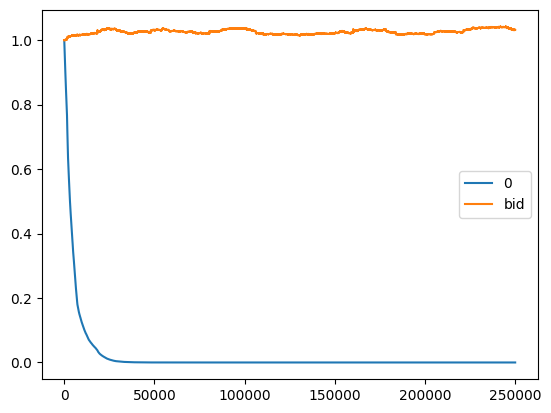

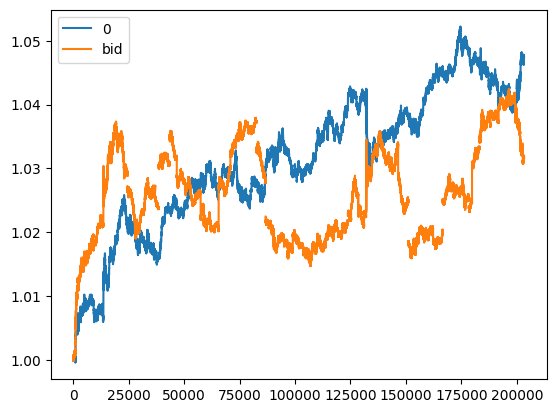

              short  neutral   long
true_short     6270     6560   8115
true_neutral  17983    17460  21887
true_long      7067     6612   8046
                 short   neutral      long
true_short    0.200192  0.214155  0.213283
true_neutral  0.574170  0.569992  0.575247
true_long     0.225639  0.215853  0.211470


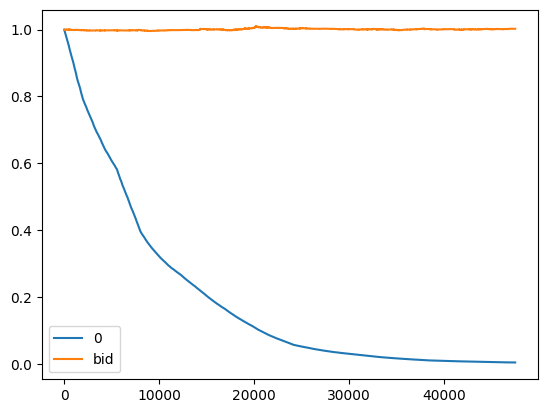

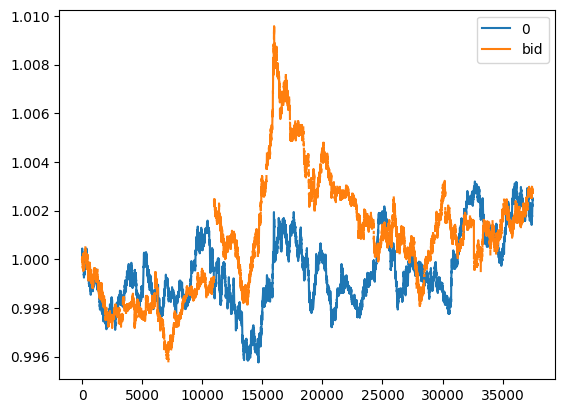

              short  neutral   long
true_short     7216     7435  10733
true_neutral  16773    17405  23029
true_long      8012     8369  11028
                 short   neutral      long
true_short    0.225493  0.223885  0.239629
true_neutral  0.524140  0.524105  0.514155
true_long     0.250367  0.252010  0.246216


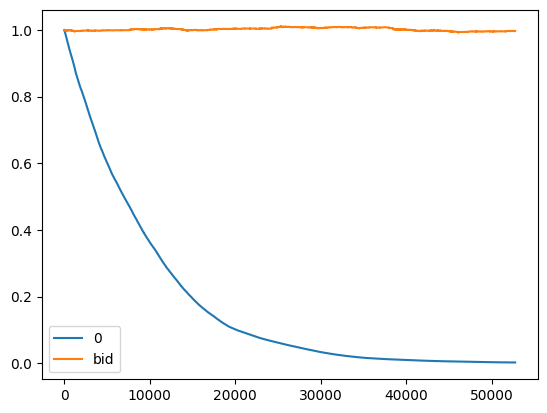

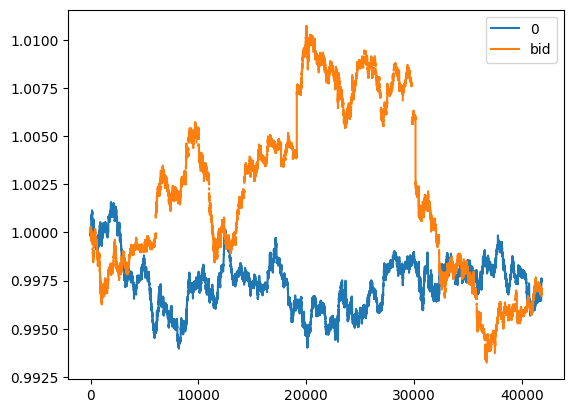


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00362_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regula

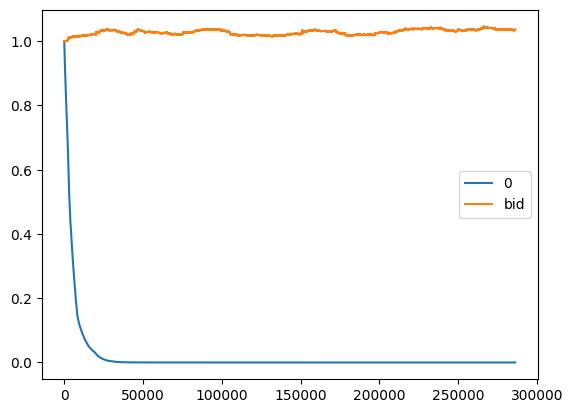

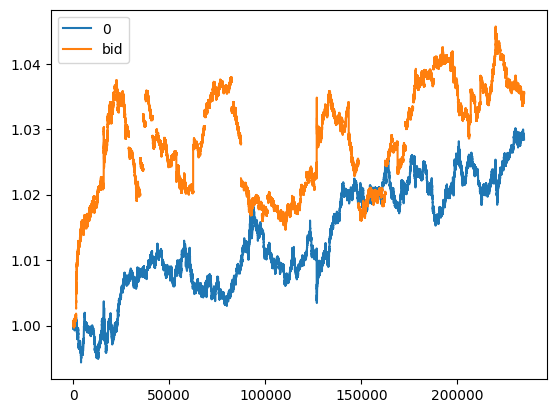

              short  neutral   long
true_short    12843     3149   9392
true_neutral  29074     7643  20490
true_long     14338     3387   9684
                 short   neutral      long
true_short    0.228300  0.222089  0.237376
true_neutral  0.516825  0.539037  0.517869
true_long     0.254875  0.238874  0.244756


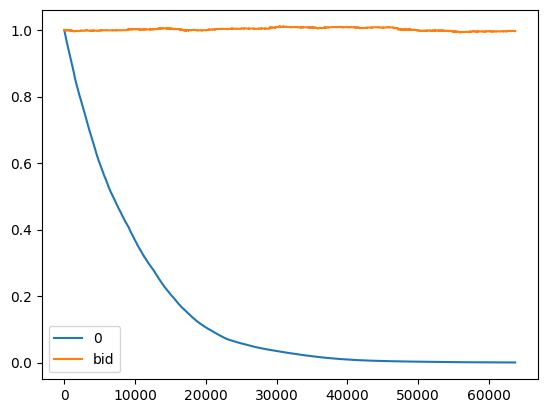

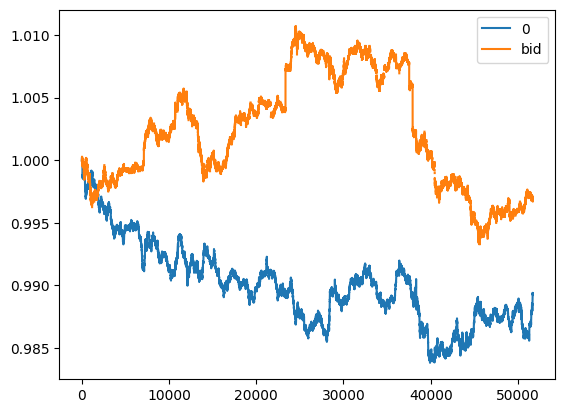

              short  neutral   long
true_short    15653     5021  11322
true_neutral  36470    11804  27940
true_long     15876     4531  11384
                 short   neutral      long
true_short    0.230195  0.235110  0.223552
true_neutral  0.536331  0.552725  0.551672
true_long     0.233474  0.212165  0.224776


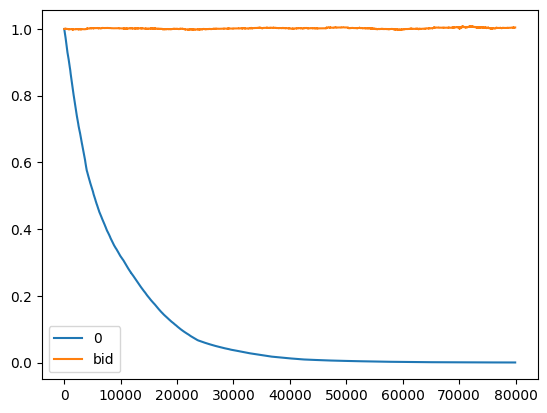

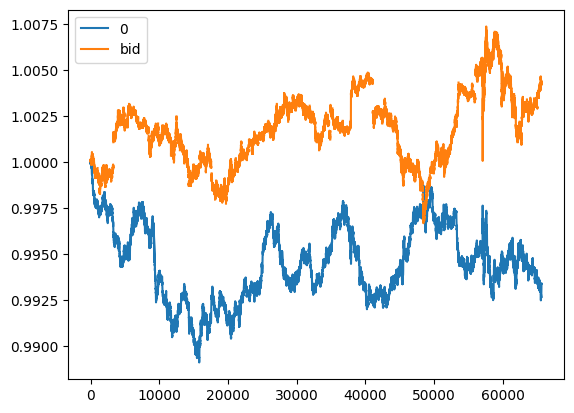


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00362_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

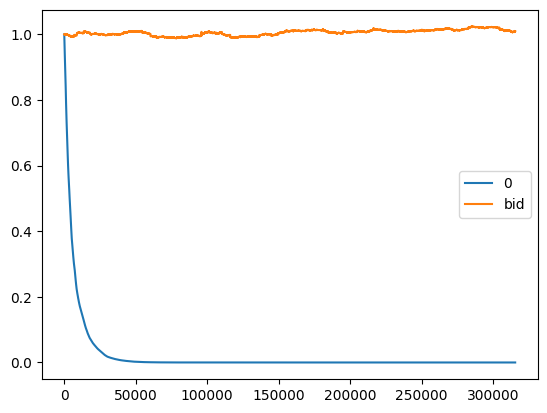

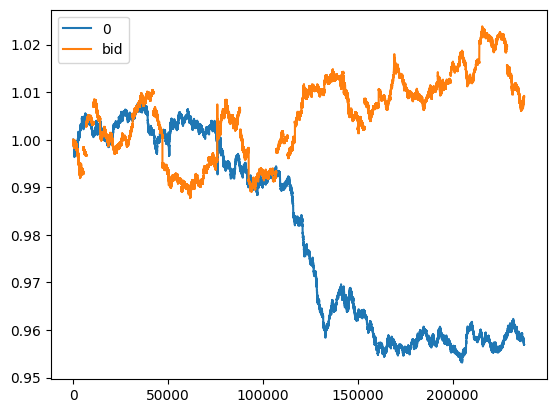

              short  neutral   long
true_short    24368     1082   6546
true_neutral  56622     2728  16863
true_long     24242     1012   6537
                 short   neutral      long
true_short    0.231565  0.224388  0.218593
true_neutral  0.538068  0.565740  0.563114
true_long     0.230367  0.209871  0.218293


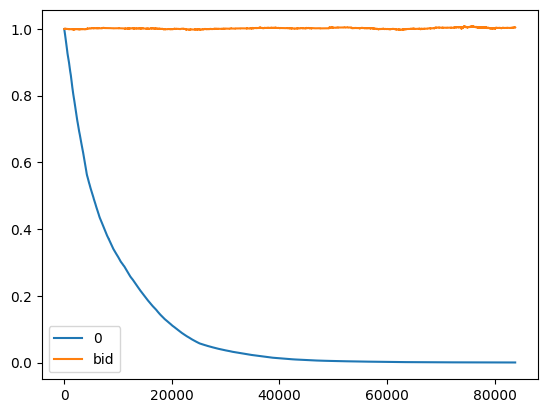

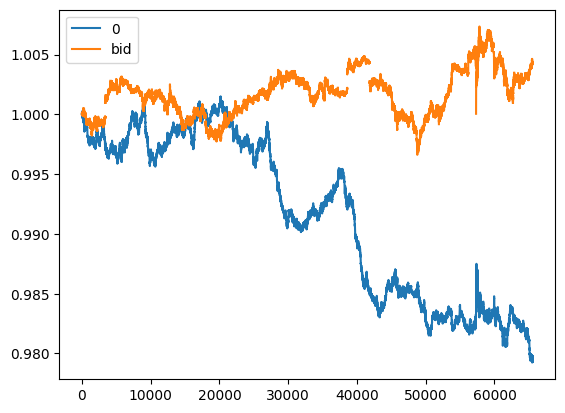

              short  neutral   long
true_short    22956      886   6941
true_neutral  55748     3030  17562
true_long     23975      951   7951
                 short   neutral      long
true_short    0.223571  0.182042  0.213872
true_neutral  0.542935  0.622560  0.541135
true_long     0.233495  0.195398  0.244993


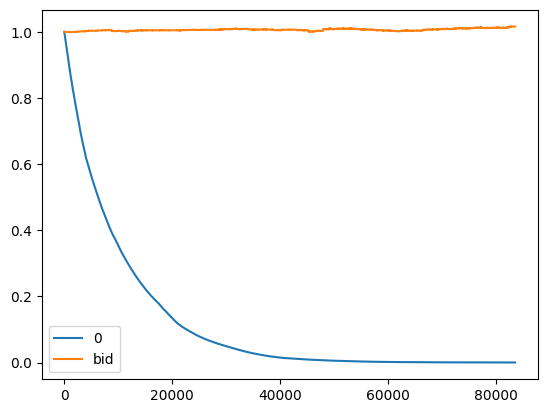

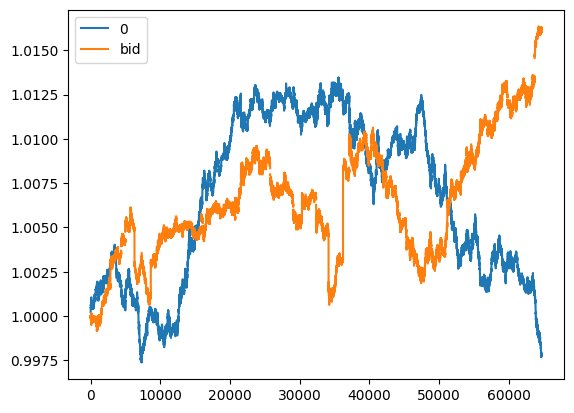


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00362_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

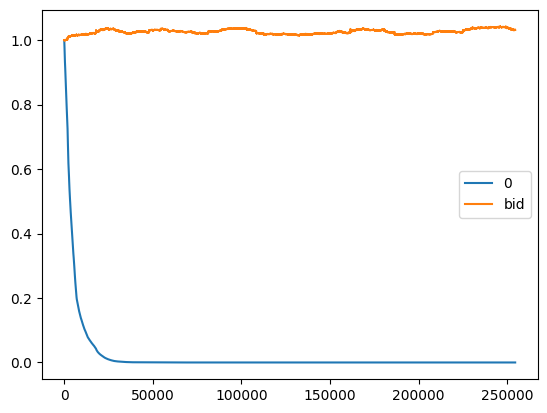

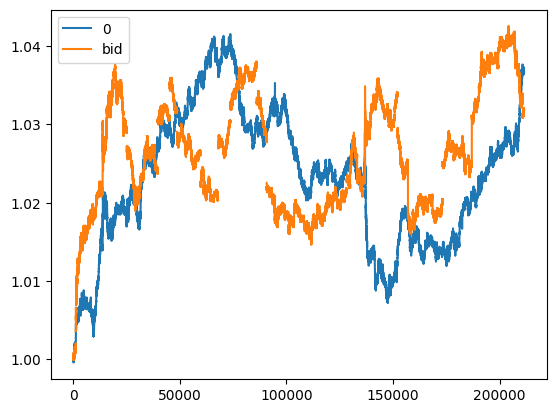

              short  neutral   long
true_short     8669     4219   8107
true_neutral  24878    11316  21116
true_long      9671     4264   7761
                 short   neutral      long
true_short    0.200588  0.213092  0.219203
true_neutral  0.575640  0.571544  0.570950
true_long     0.223773  0.215364  0.209848


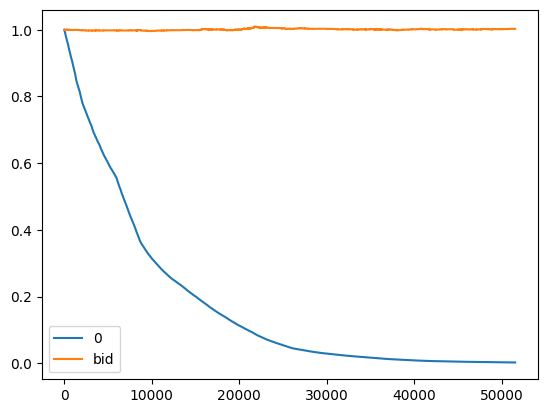

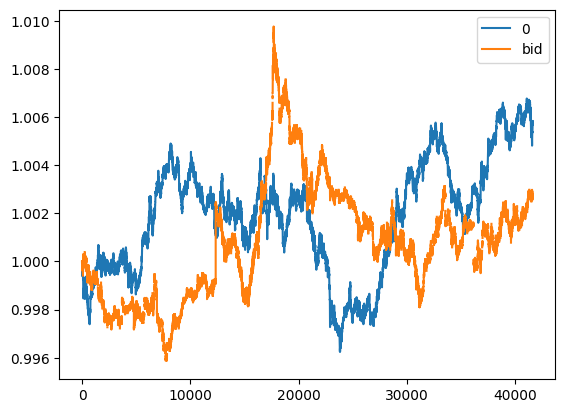

              short  neutral   long
true_short     9846     5168  10344
true_neutral  22697    12337  22212
true_long     10801     5802  10793
                 short   neutral      long
true_short    0.227159  0.221736  0.238621
true_neutral  0.523648  0.529326  0.512399
true_long     0.249193  0.248938  0.248979


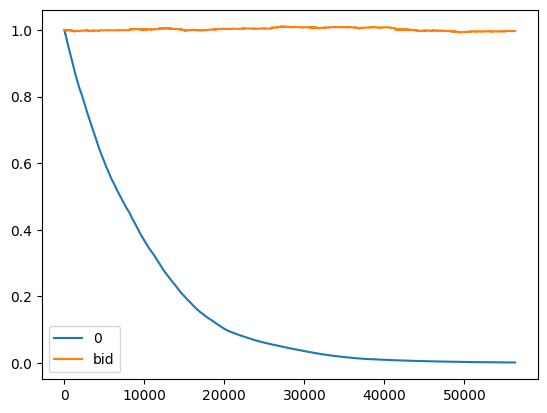

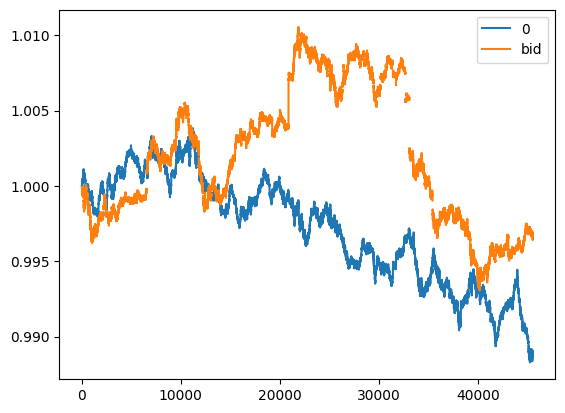


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regula

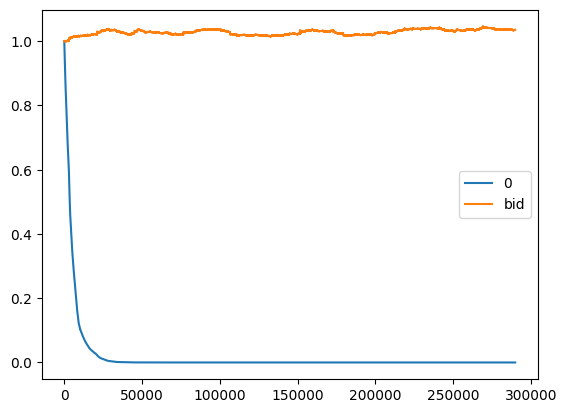

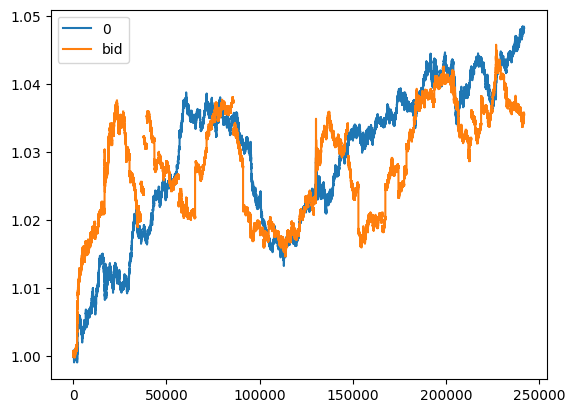

              short  neutral   long
true_short     9709     1872  13777
true_neutral  22254     4338  30654
true_long     11037     2007  14352
                 short  neutral      long
true_short    0.225791  0.22782  0.234370
true_neutral  0.517535  0.52793  0.521477
true_long     0.256674  0.24425  0.244152


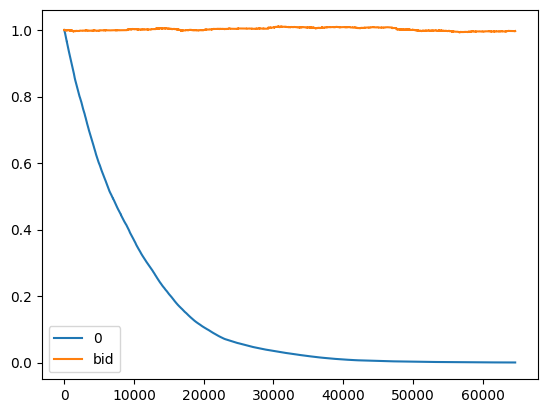

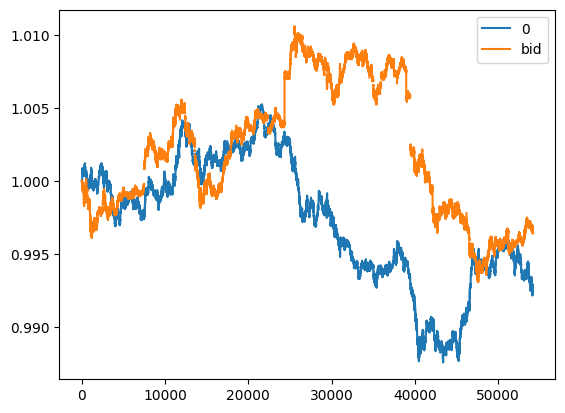

              short  neutral   long
true_short    11755     2612  17610
true_neutral  27554     6564  42097
true_long     12250     2511  17047
                 short   neutral      long
true_short    0.227991  0.223496  0.229434
true_neutral  0.534417  0.561650  0.548467
true_long     0.237592  0.214854  0.222099


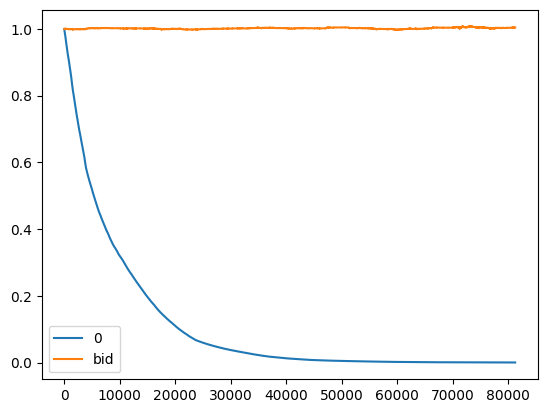

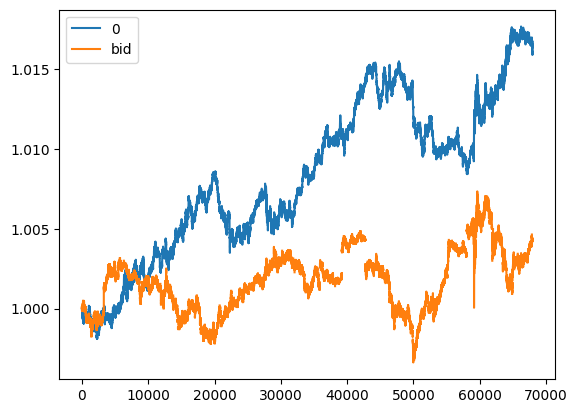

copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regula

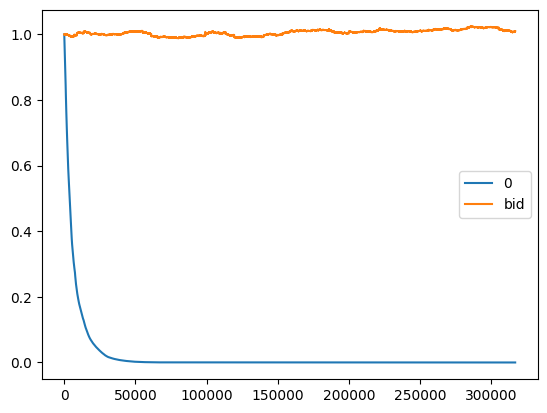

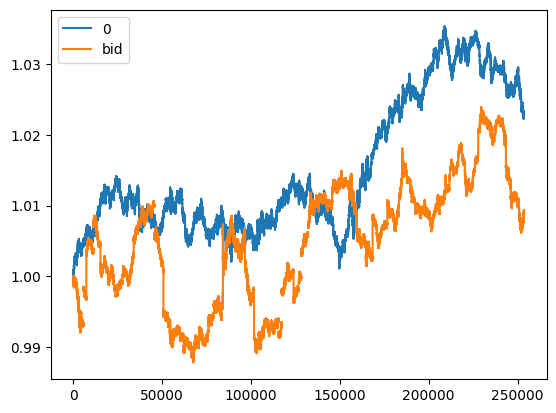

              short  neutral   long
true_short    19627      162  12188
true_neutral  46122      383  29710
true_long     19875      149  11784
                 short   neutral      long
true_short    0.229223  0.233429  0.227041
true_neutral  0.538657  0.551873  0.553444
true_long     0.232119  0.214697  0.219515


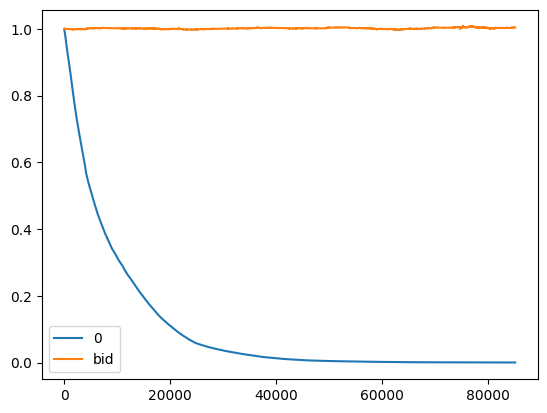

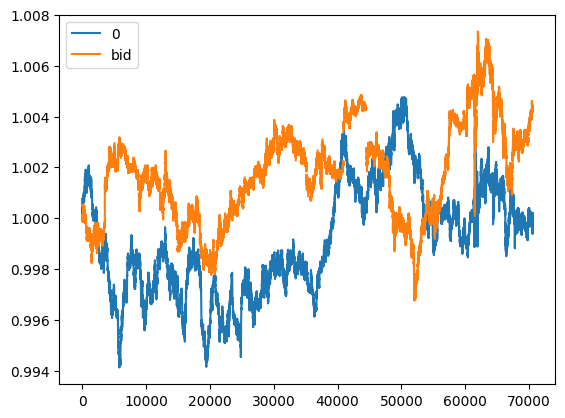

              short  neutral   long
true_short    18172      144  12485
true_neutral  43699      353  32279
true_long     18385      144  14339
                 short   neutral      long
true_short    0.226425  0.224649  0.211241
true_neutral  0.544495  0.550702  0.546148
true_long     0.229079  0.224649  0.242610


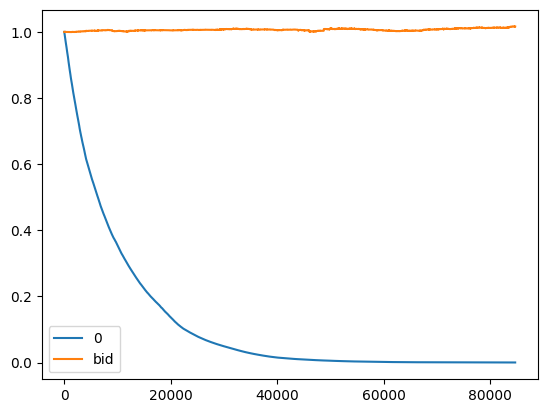

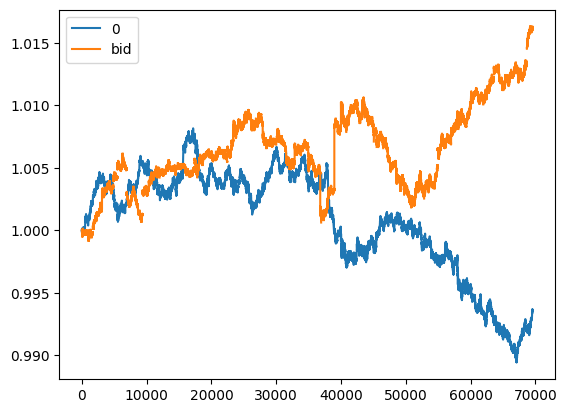


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

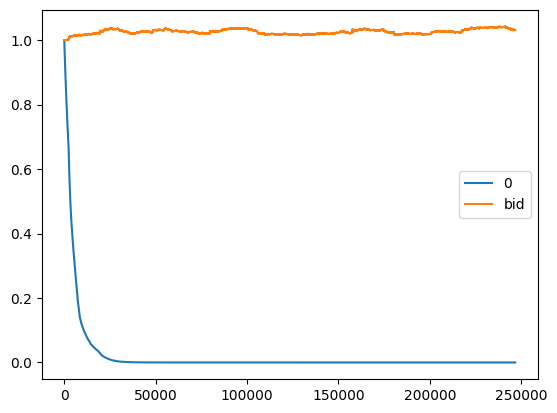

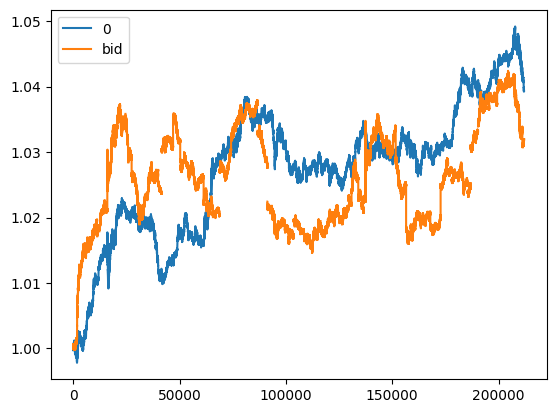

              short  neutral   long
true_short     7284     5597   8045
true_neutral  20028    17067  20283
true_long      7569     6278   7849
                 short   neutral      long
true_short    0.208824  0.193387  0.222379
true_neutral  0.574181  0.589697  0.560660
true_long     0.216995  0.216917  0.216961


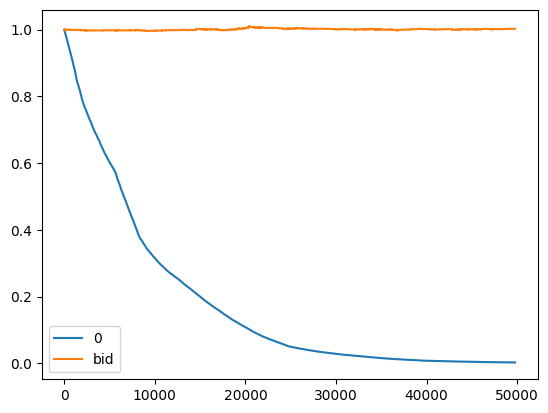

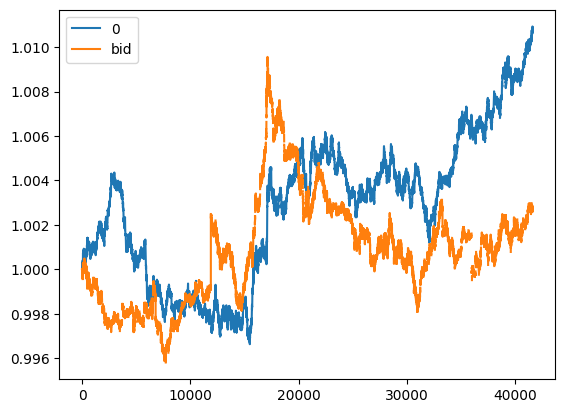

              short  neutral   long
true_short     8670     7022   9606
true_neutral  19721    16286  21303
true_long      9519     7477  10396
                 short   neutral      long
true_short    0.228700  0.228098  0.232563
true_neutral  0.520206  0.529024  0.515749
true_long     0.251095  0.242878  0.251689


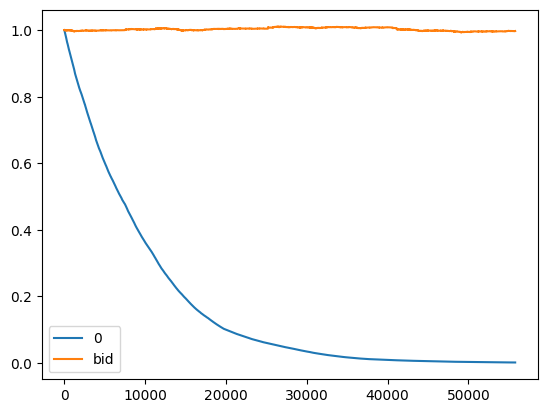

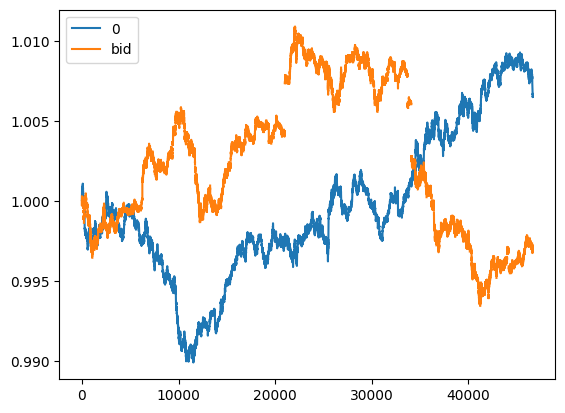

copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regula

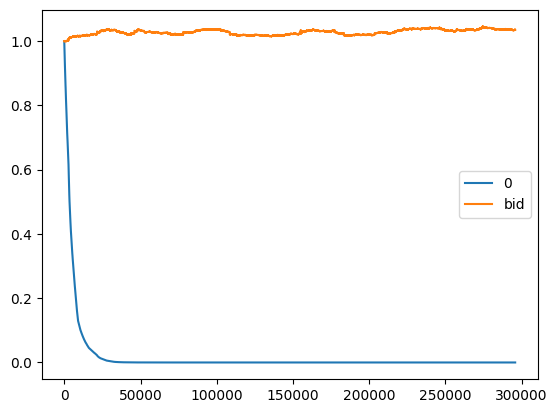

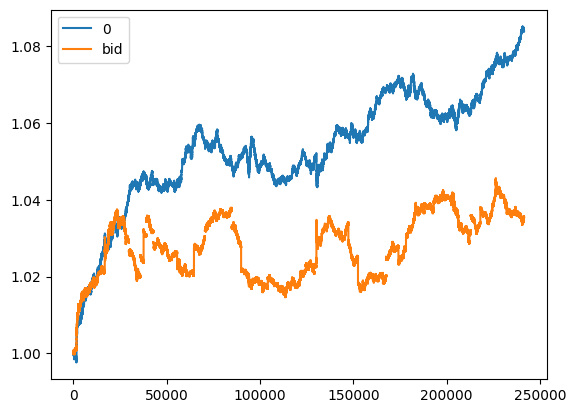

              short  neutral   long
true_short    15187     1575   8536
true_neutral  34971     3584  18755
true_long     16694     1723   8975
                 short   neutral      long
true_short    0.227173  0.228858  0.235372
true_neutral  0.523111  0.520779  0.517151
true_long     0.249716  0.250363  0.247477


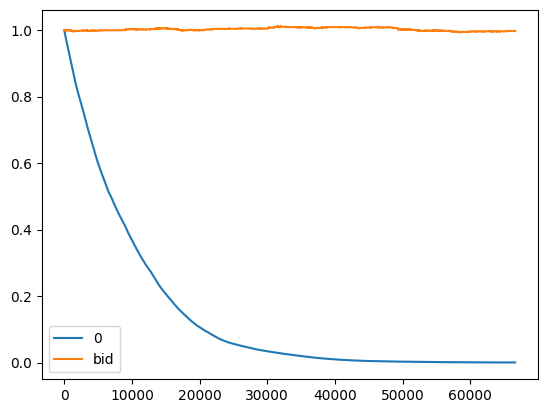

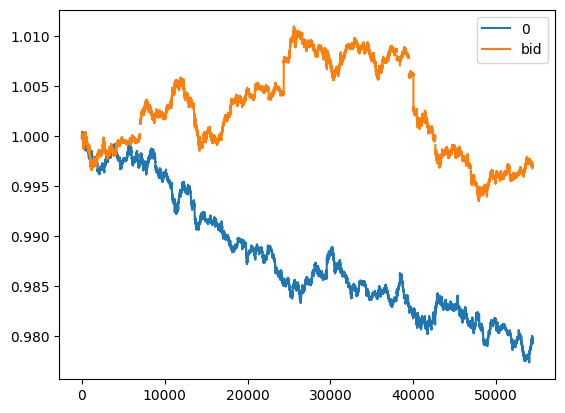

              short  neutral   long
true_short    18569     2608  10804
true_neutral  43853     6070  26292
true_long     19002     2329  10473
                 short   neutral      long
true_short    0.228053  0.236940  0.227123
true_neutral  0.538576  0.551467  0.552713
true_long     0.233371  0.211593  0.220164


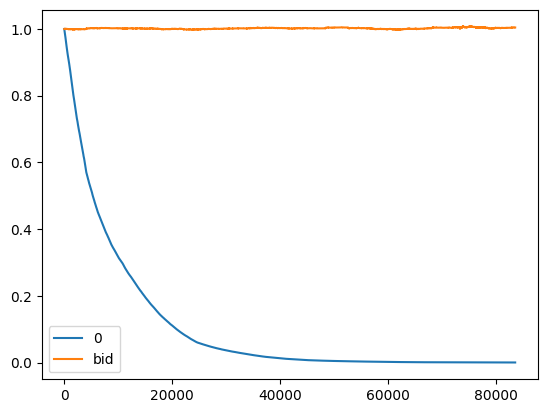

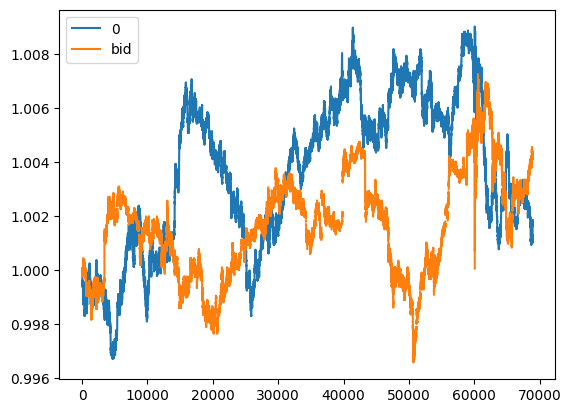


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

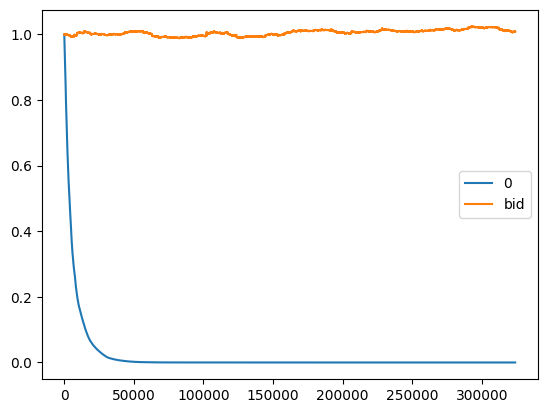

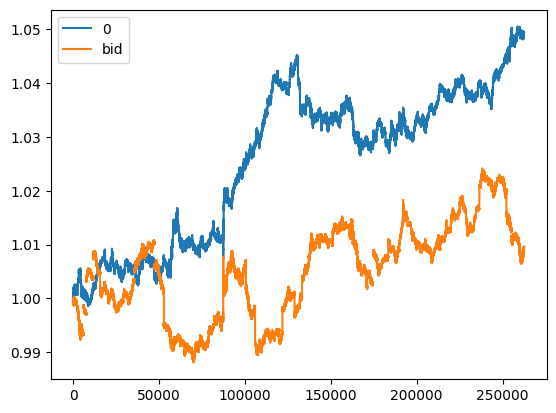

              short  neutral   long
true_short    19266      596  12119
true_neutral  45620     1073  29522
true_long     19275      450  12079
                 short   neutral      long
true_short    0.228918  0.281265  0.225596
true_neutral  0.542056  0.506371  0.549553
true_long     0.229025  0.212364  0.224851


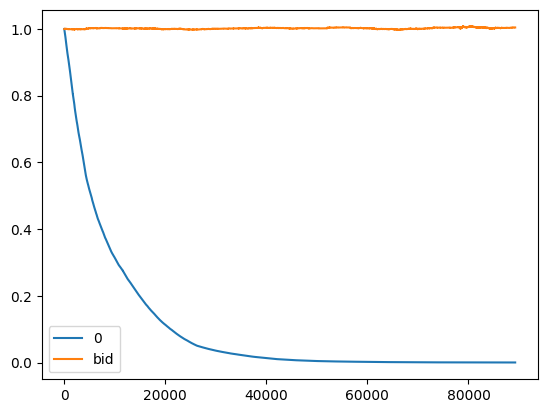

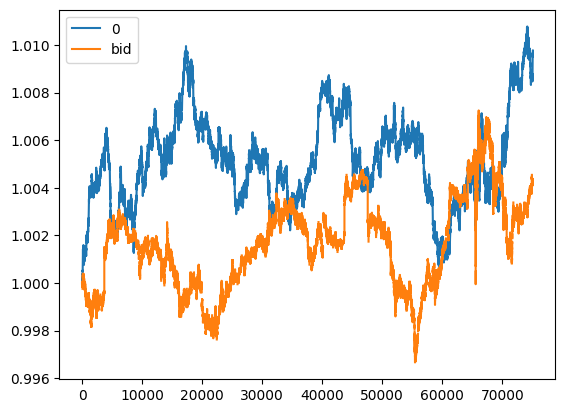

              short  neutral   long
true_short    18679      540  11569
true_neutral  46377     1388  28560
true_long     20138      549  12200
                 short   neutral      long
true_short    0.219253  0.218006  0.221082
true_neutral  0.544369  0.560355  0.545778
true_long     0.236378  0.221639  0.233140


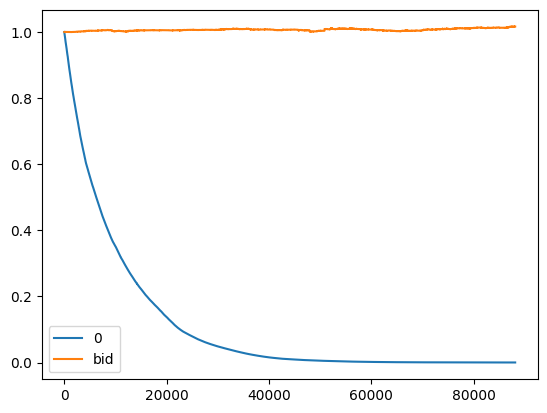

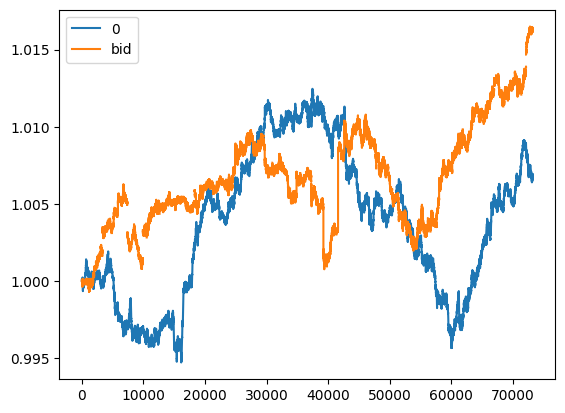


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

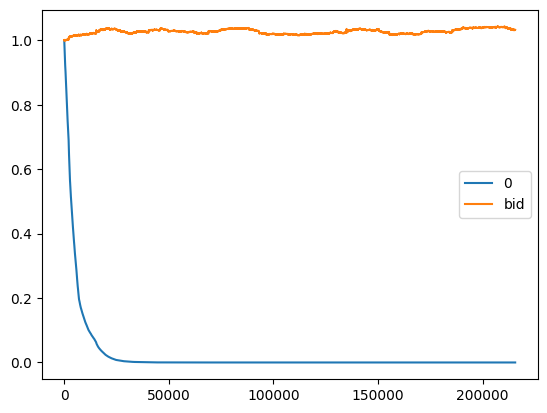

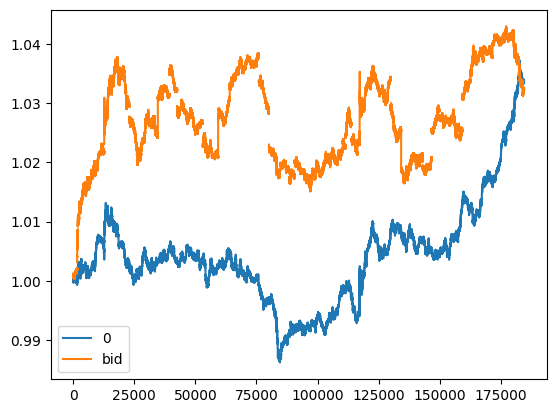

              short  neutral   long
true_short     6692     5360   8828
true_neutral  18509    14817  24035
true_long      7144     5567   9049
                 short   neutral      long
true_short    0.206894  0.208204  0.210632
true_neutral  0.572237  0.575552  0.573463
true_long     0.220869  0.216245  0.215905


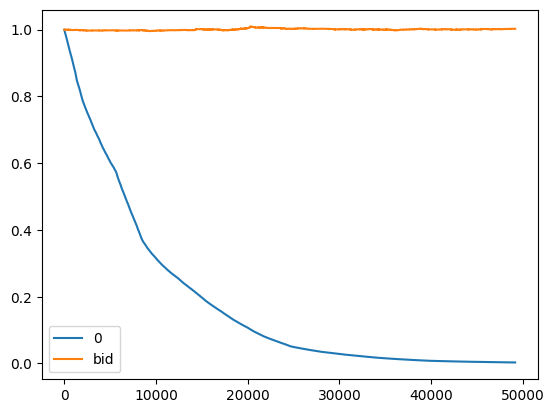

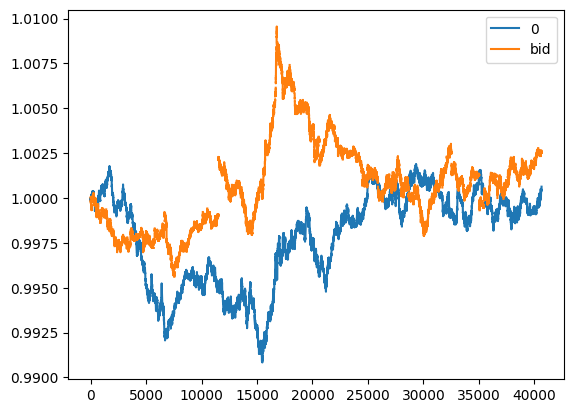

              short  neutral   long
true_short     8877     6334  10164
true_neutral  19874    14511  22790
true_long      9665     7223  10562
                 short   neutral      long
true_short    0.231076  0.225666  0.233569
true_neutral  0.517337  0.516994  0.523715
true_long     0.251588  0.257339  0.242715


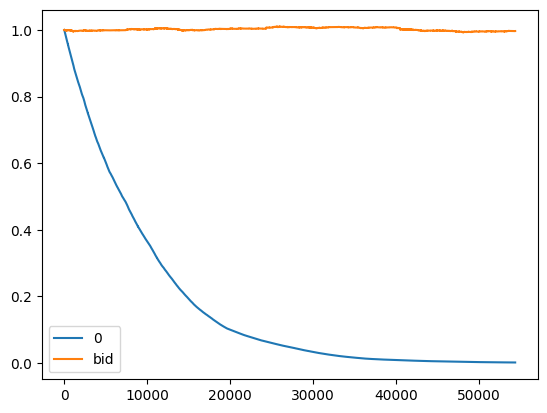

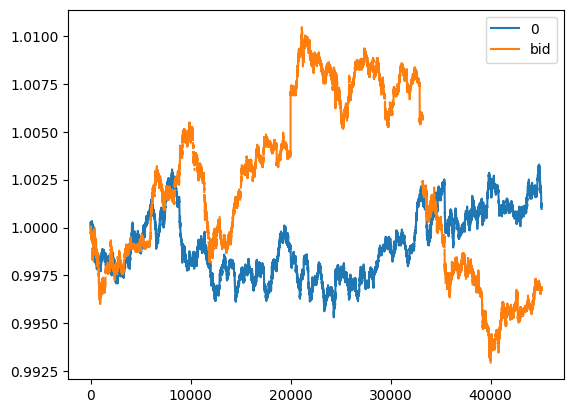


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

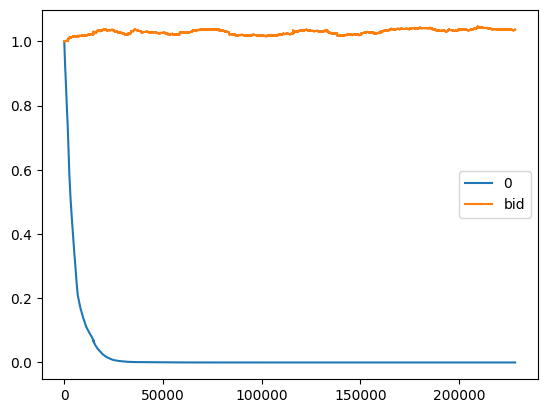

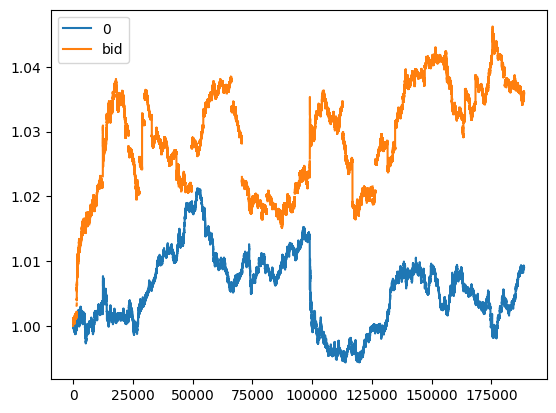

              short  neutral   long
true_short    14894     4738   5743
true_neutral  33317    10896  12962
true_long     15956     5159   6335
                 short   neutral      long
true_short    0.232113  0.227865  0.229353
true_neutral  0.519223  0.524023  0.517652
true_long     0.248664  0.248112  0.252995


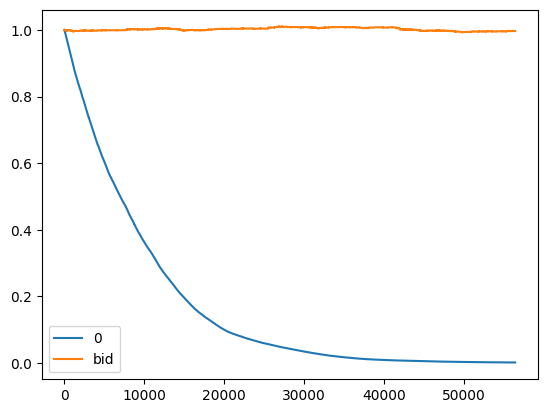

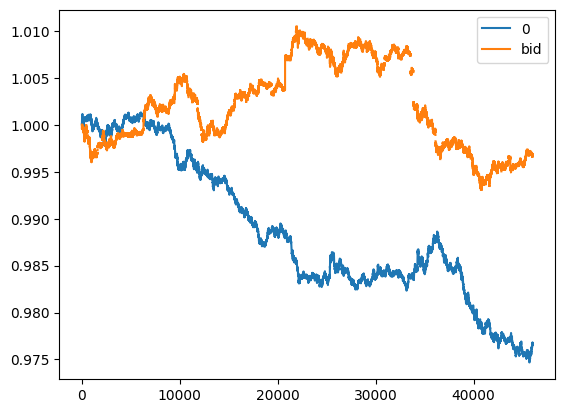

              short  neutral   long
true_short    20274     4923   6801
true_neutral  46850    11750  17626
true_long     20011     4636   7129
                 short   neutral      long
true_short    0.232673  0.231029  0.215522
true_neutral  0.537671  0.551410  0.558563
true_long     0.229655  0.217561  0.225916


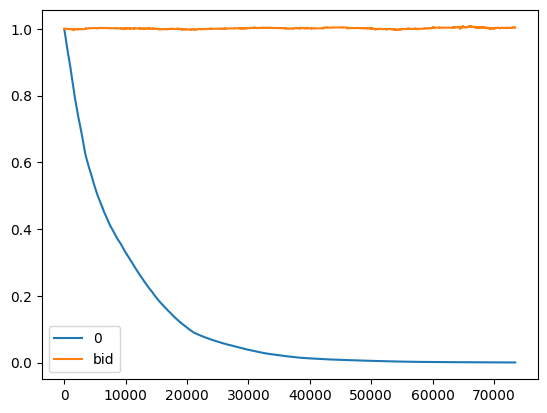

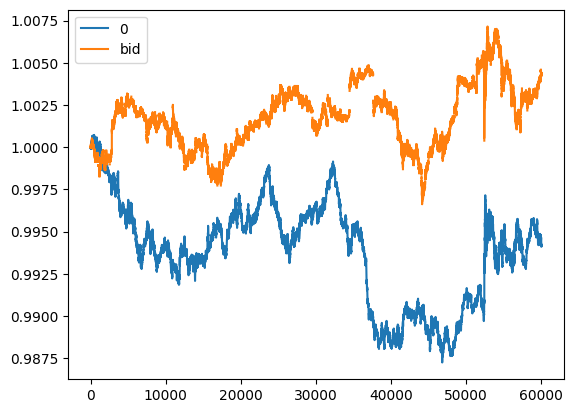


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

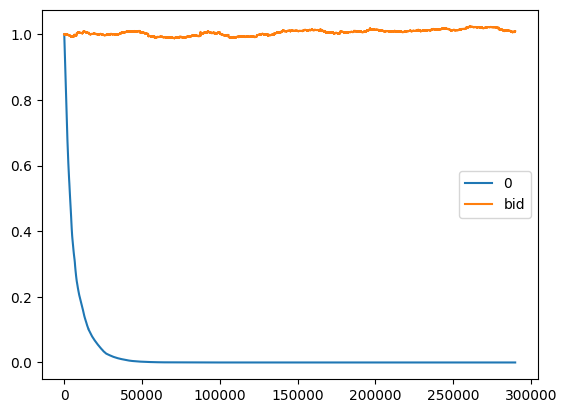

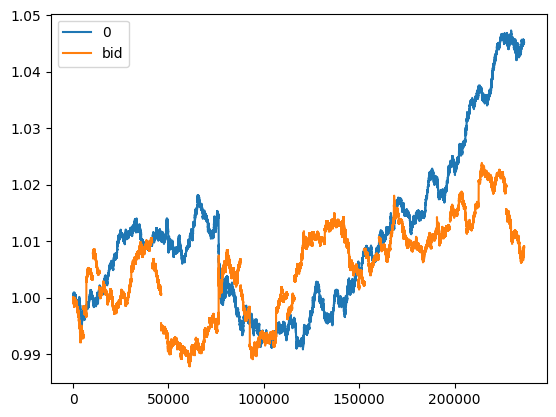

              short  neutral   long
true_short    17558     1985  12455
true_neutral  38138     4584  33504
true_long     16077     1729  13970
                 short   neutral      long
true_short    0.244632  0.239214  0.207829
true_neutral  0.531370  0.552422  0.559062
true_long     0.223998  0.208363  0.233109


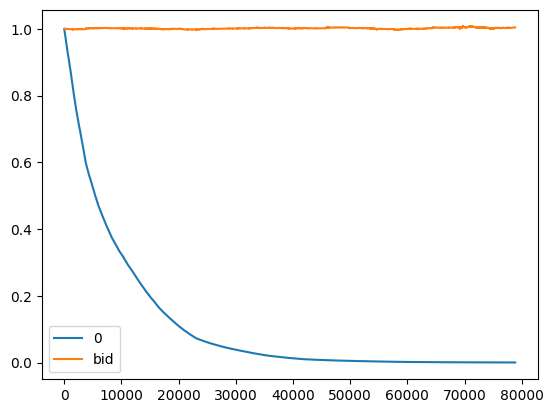

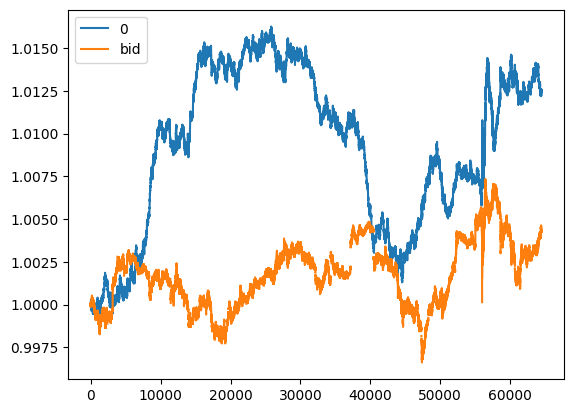

              short  neutral   long
true_short    17081     1606  12177
true_neutral  42995     4274  29016
true_long     18336     1698  12817
                 short   neutral      long
true_short    0.217837  0.211929  0.225458
true_neutral  0.548322  0.564001  0.537234
true_long     0.233842  0.224070  0.237308


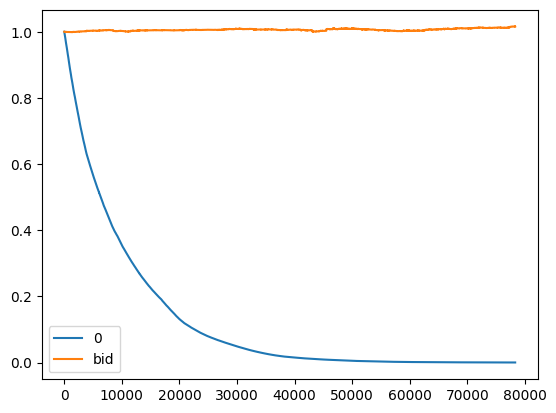

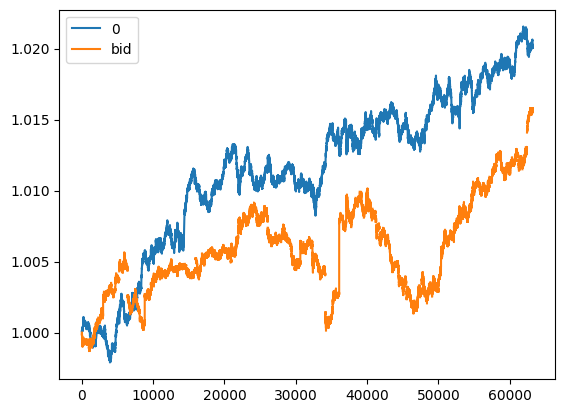


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

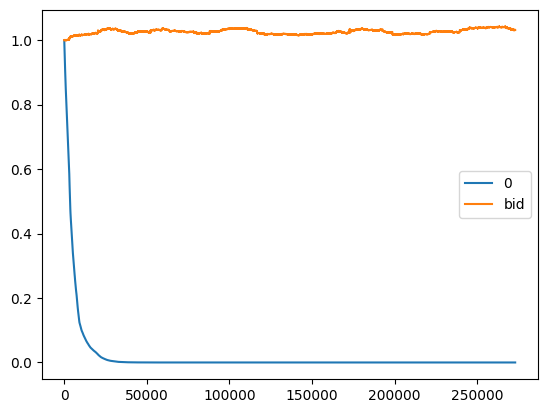

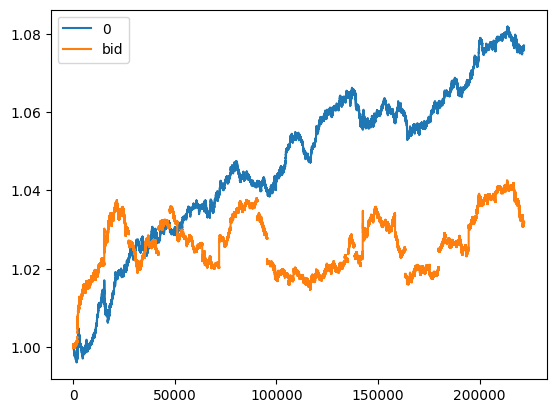

              short  neutral   long
true_short     8838     2780   9327
true_neutral  26571     6990  23769
true_long     10295     2515   8915
                 short   neutral      long
true_short    0.193375  0.226292  0.222013
true_neutral  0.581371  0.568987  0.565780
true_long     0.225254  0.204721  0.212206


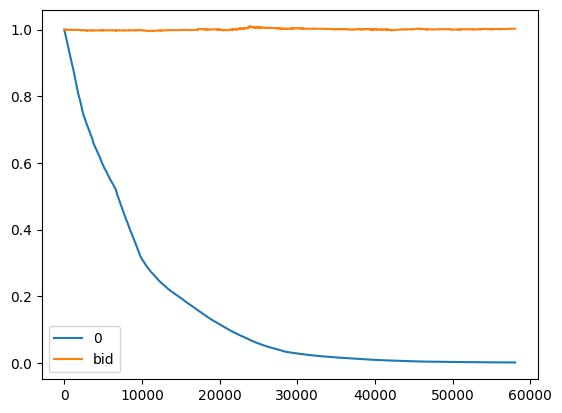

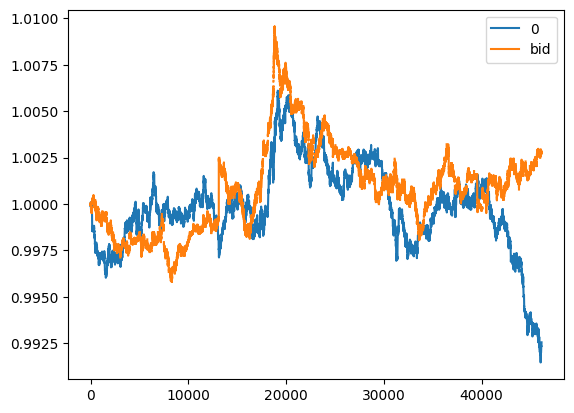

              short  neutral   long
true_short    10520     3318  11546
true_neutral  24520     7407  25280
true_long     10895     3596  12918
                 short   neutral      long
true_short    0.229019  0.231688  0.232108
true_neutral  0.533798  0.517212  0.508202
true_long     0.237183  0.251100  0.259690


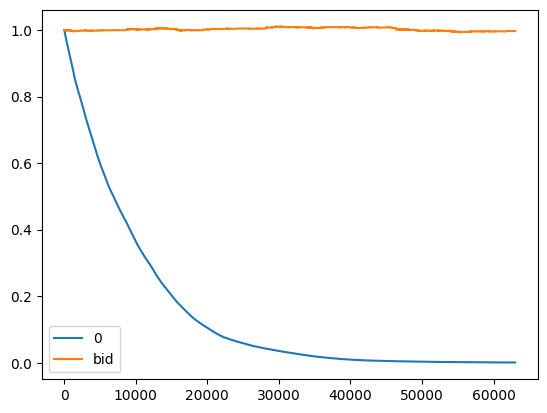

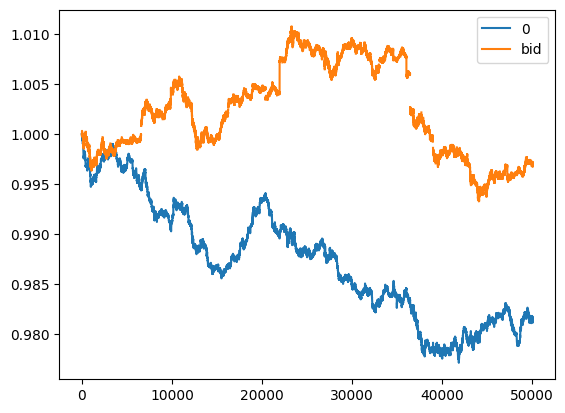


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00361_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

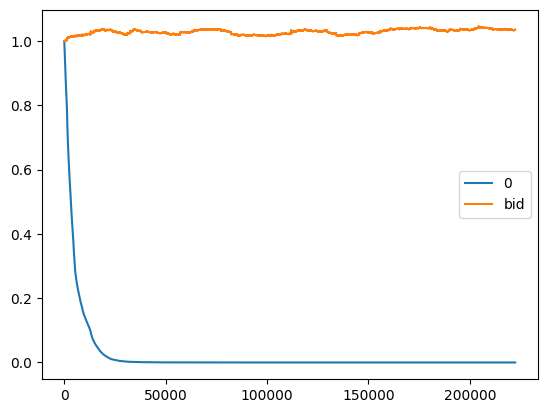

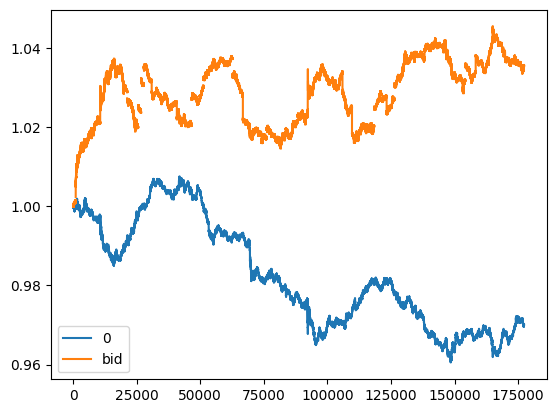

              short  neutral  long
true_short    15627     5653  4104
true_neutral  34891    13215  9101
true_long     16785     6342  4282
                 short   neutral      long
true_short    0.232189  0.224236  0.234689
true_neutral  0.518417  0.524197  0.520444
true_long     0.249395  0.251567  0.244868


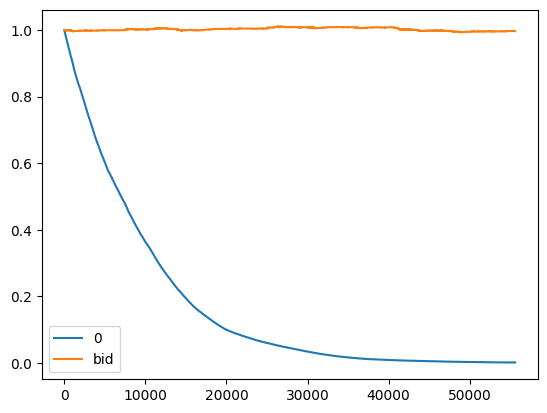

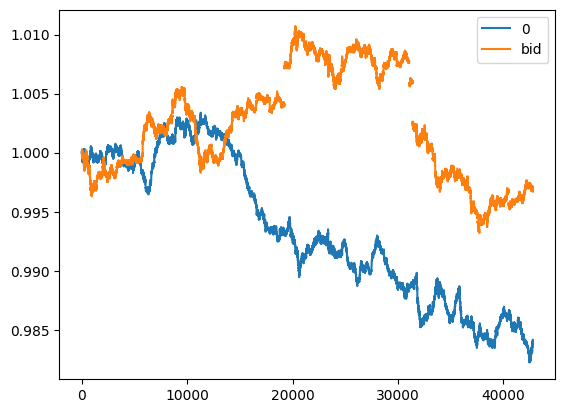

              short  neutral   long
true_short    20472     6841   4683
true_neutral  48058    16863  11292
true_long     20387     6847   4557
                 short   neutral      long
true_short    0.230237  0.223921  0.228083
true_neutral  0.540482  0.551962  0.549971
true_long     0.229281  0.224117  0.221946


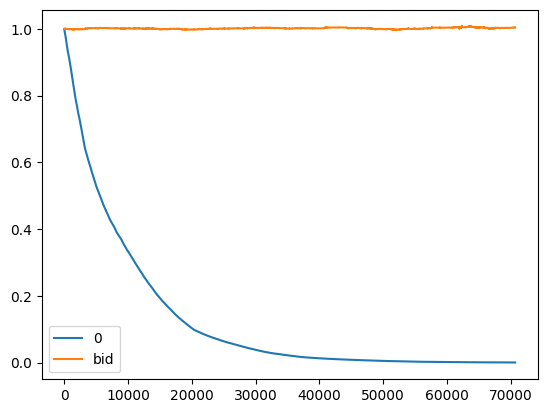

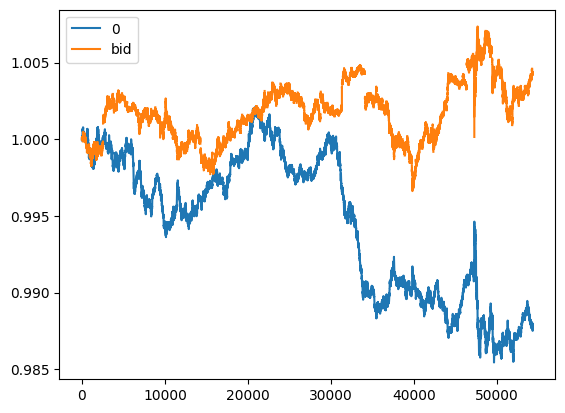


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regula

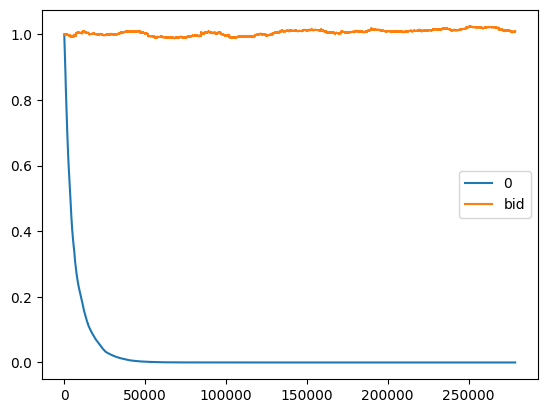

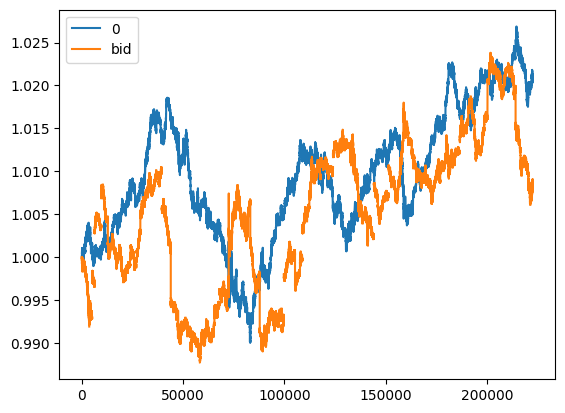

              short  neutral   long
true_short    20075     4320   7601
true_neutral  47275    10321  18617
true_long     20115     3962   7714
                 short   neutral      long
true_short    0.229520  0.232221  0.224007
true_neutral  0.540502  0.554803  0.548656
true_long     0.229978  0.212976  0.227337


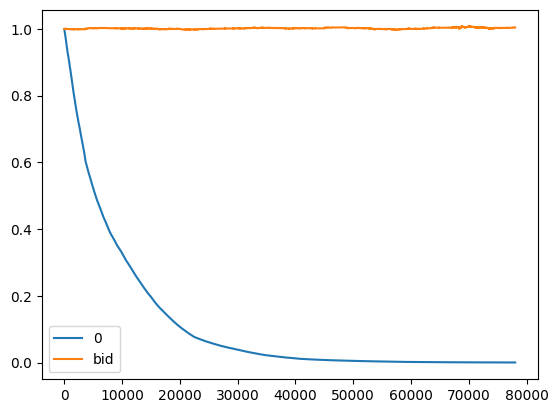

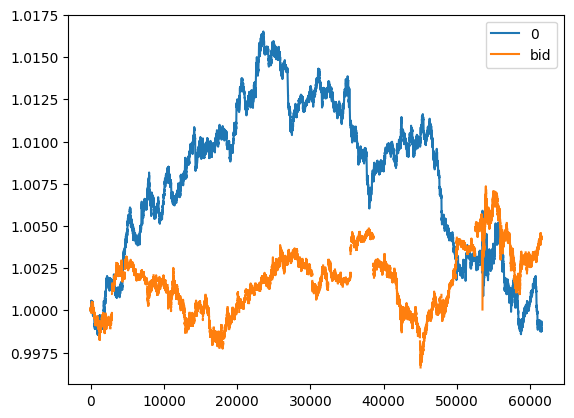

              short  neutral   long
true_short    19426     3402   7955
true_neutral  49395     8543  18402
true_long     21826     3571   7480
                 short   neutral      long
true_short    0.214304  0.219258  0.235098
true_neutral  0.544916  0.550593  0.543843
true_long     0.240780  0.230150  0.221060


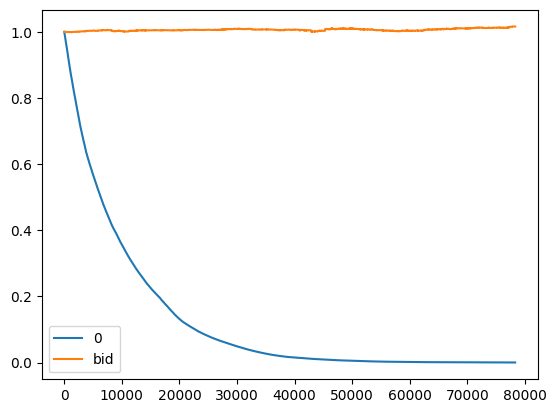

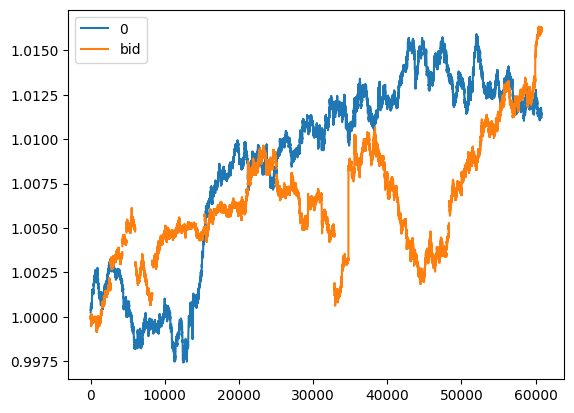


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

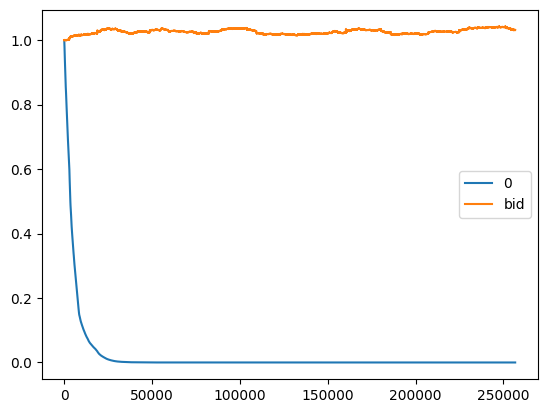

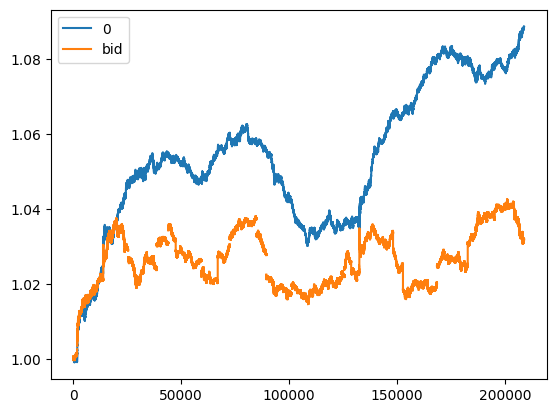

              short  neutral   long
true_short     9278     2718   8998
true_neutral  27649     6866  22795
true_long     10301     2767   8628
                 short   neutral      long
true_short    0.196451  0.220063  0.222607
true_neutral  0.585437  0.555906  0.563940
true_long     0.218112  0.224030  0.213453


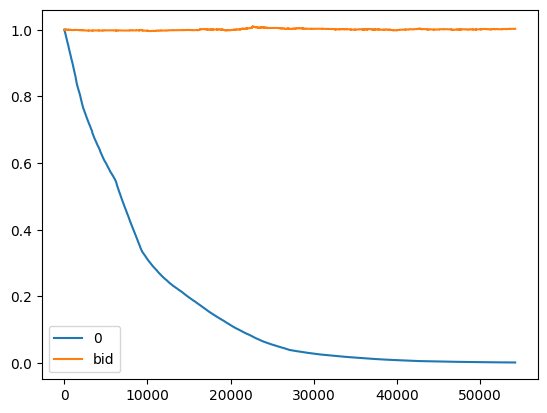

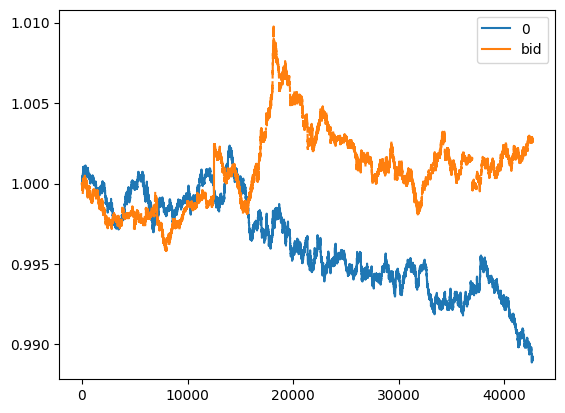

              short  neutral   long
true_short    11019     3376  10963
true_neutral  25113     7480  24653
true_long     11124     3545  12727
                 short   neutral      long
true_short    0.233177  0.234428  0.226775
true_neutral  0.531425  0.519408  0.509960
true_long     0.235399  0.246163  0.263265


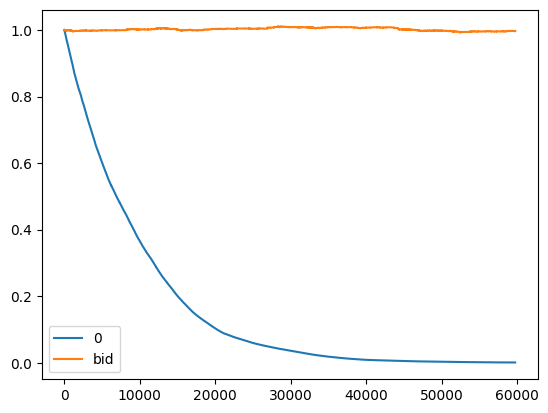

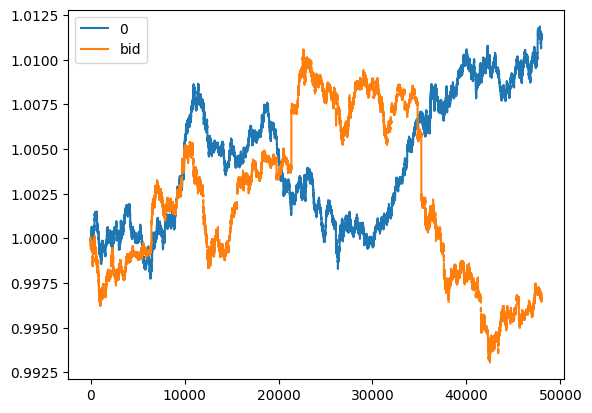


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

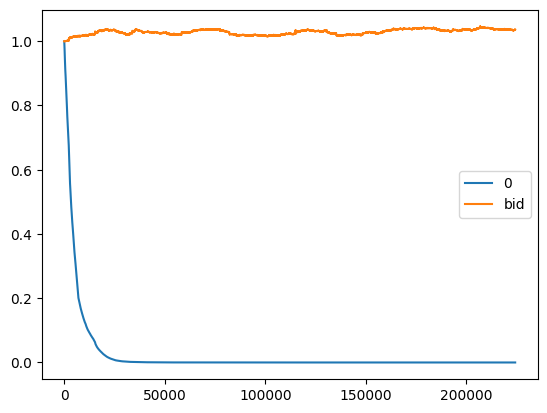

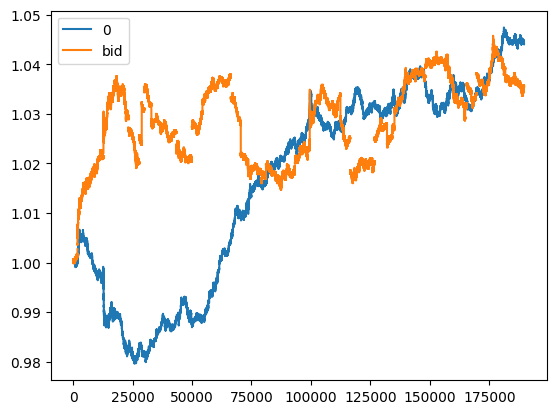

              short  neutral   long
true_short    10018     6157   9183
true_neutral  22377    14030  20839
true_long     11035     6775   9586
                 short   neutral      long
true_short    0.230670  0.228358  0.231847
true_neutral  0.515243  0.520362  0.526131
true_long     0.254087  0.251280  0.242022


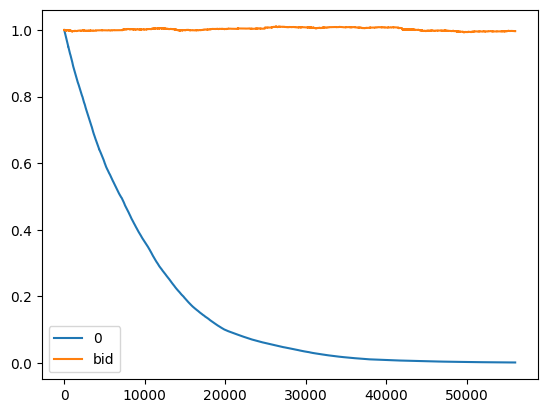

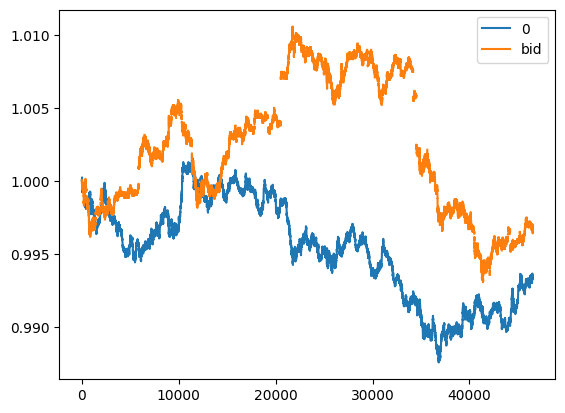

              short  neutral   long
true_short    13643     6726  11608
true_neutral  33386    15657  27172
true_long     14206     6628  10974
                 short   neutral      long
true_short    0.222797  0.231843  0.233308
true_neutral  0.545211  0.539692  0.546127
true_long     0.231992  0.228465  0.220565


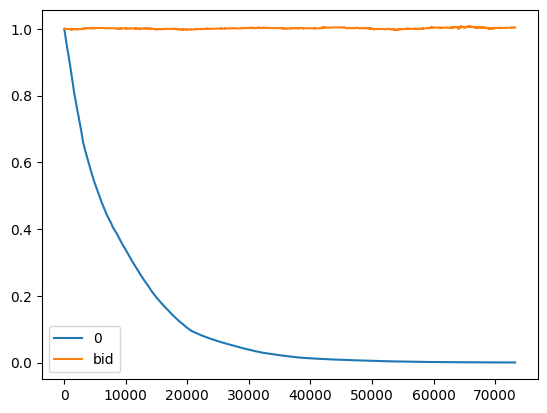

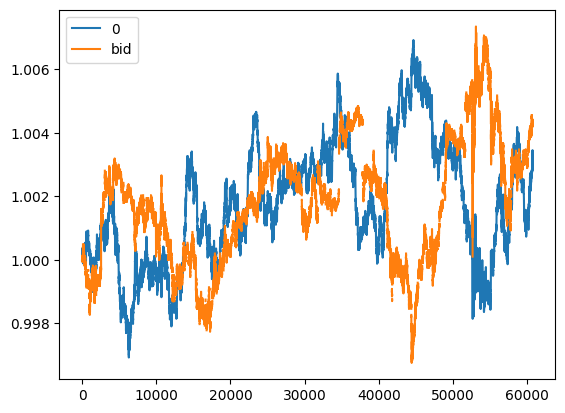


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

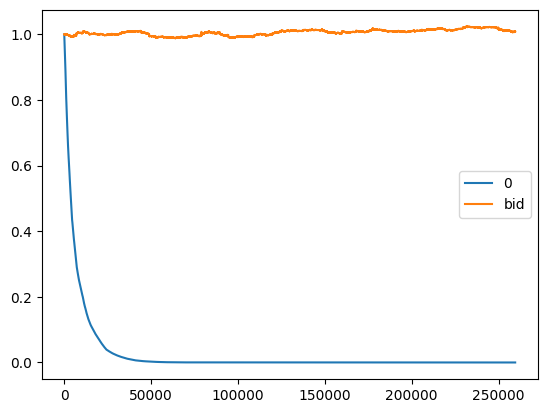

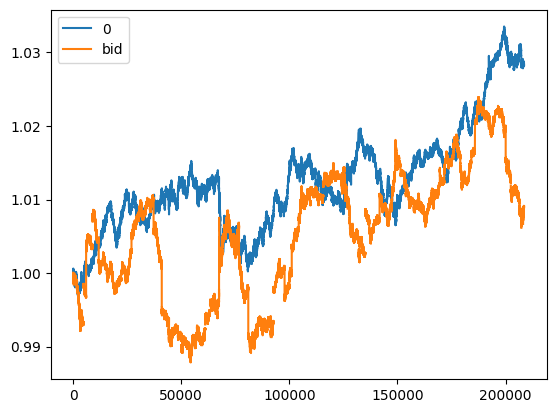

              short  neutral   long
true_short    18567     3493   9917
true_neutral  43562     8070  24583
true_long     18013     3354  10442
                 short   neutral      long
true_short    0.231676  0.234162  0.220662
true_neutral  0.543560  0.540993  0.546994
true_long     0.224764  0.224844  0.232344


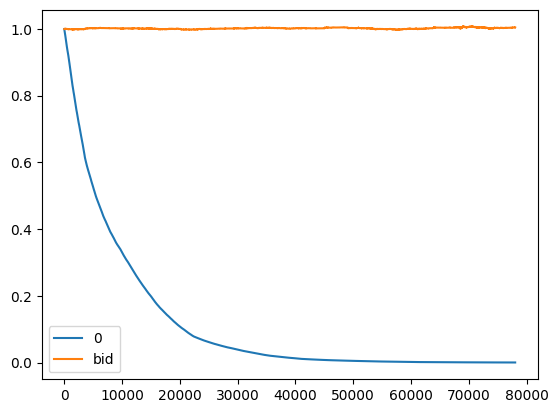

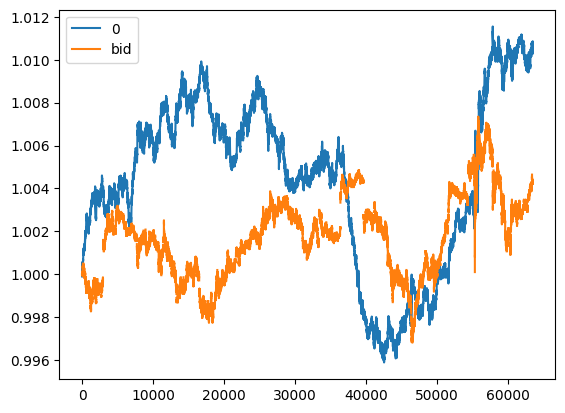

              short  neutral   long
true_short    17833     2388  10580
true_neutral  44776     6216  25339
true_long     19067     2642  11159
                 short   neutral      long
true_short    0.218338  0.212342  0.224733
true_neutral  0.548215  0.552730  0.538234
true_long     0.233447  0.234928  0.237032


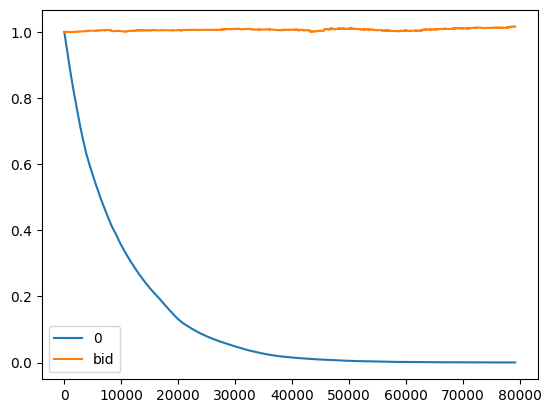

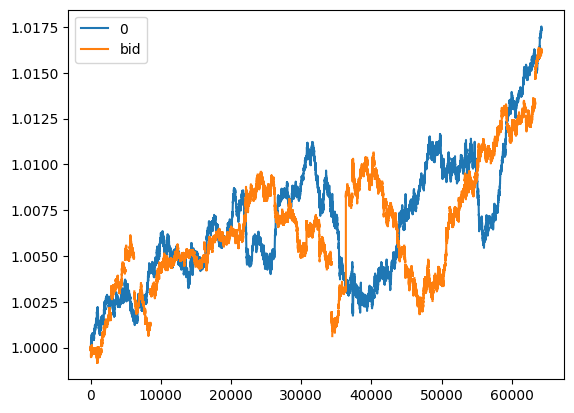


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

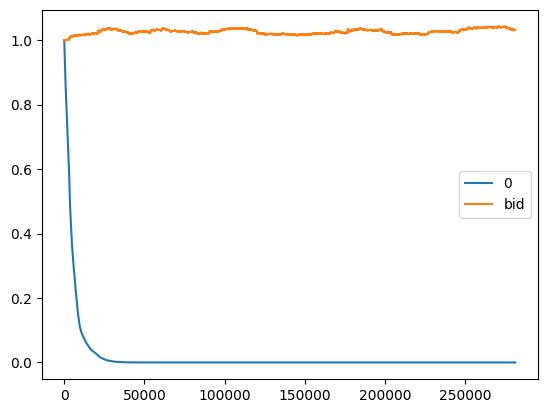

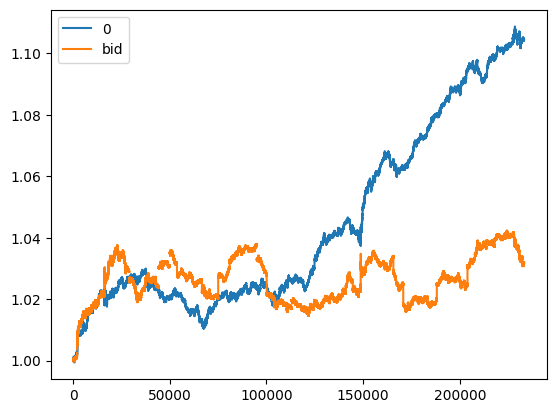

              short  neutral   long
true_short    10247     1487   9192
true_neutral  30195     4297  22886
true_long     11378     1645   8673
                 short   neutral      long
true_short    0.197742  0.200162  0.225565
true_neutral  0.582690  0.578409  0.561606
true_long     0.219568  0.221430  0.212829


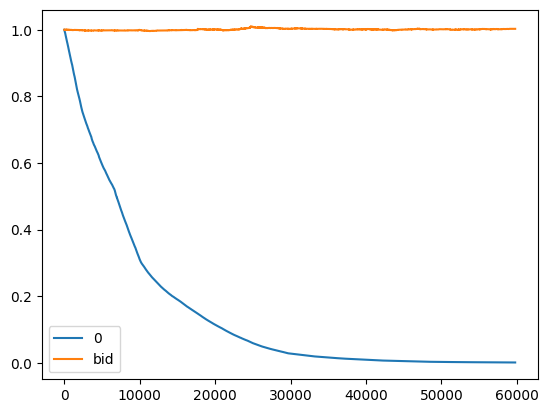

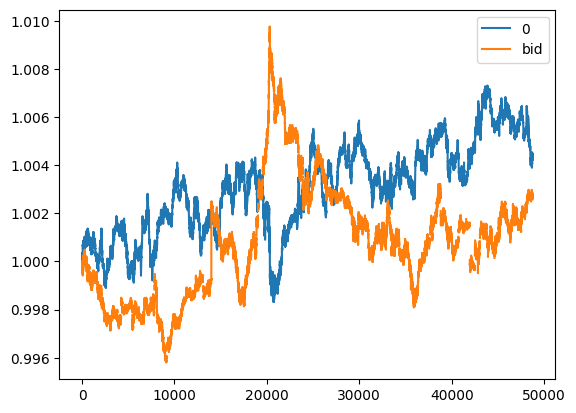

              short  neutral   long
true_short    12790     1913  10595
true_neutral  29168     4115  24027
true_long     12942     2066  12384
                 short   neutral      long
true_short    0.232969  0.236348  0.225397
true_neutral  0.531293  0.508401  0.511148
true_long     0.235738  0.255251  0.263456


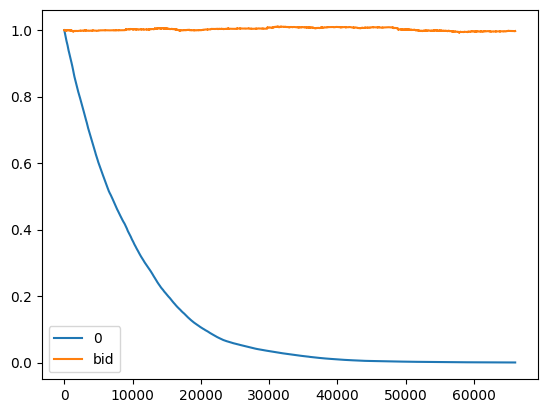

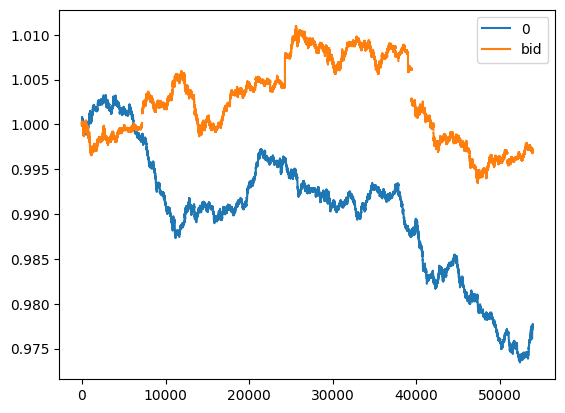


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

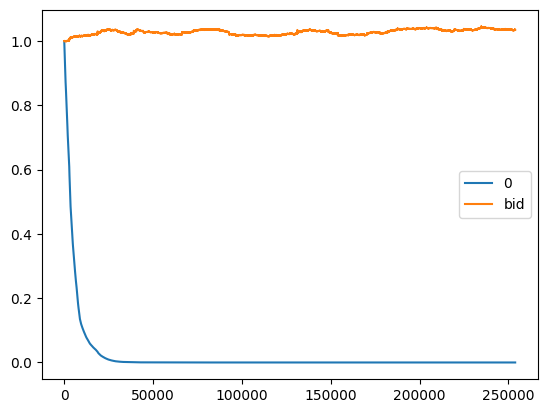

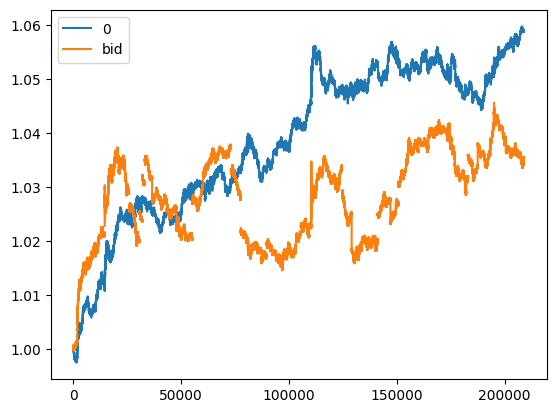

              short  neutral   long
true_short    10734     3837  10727
true_neutral  23757     8961  24592
true_long     11391     4378  11623
                 short   neutral      long
true_short    0.233948  0.223393  0.228516
true_neutral  0.517785  0.521716  0.523881
true_long     0.248267  0.254891  0.247603


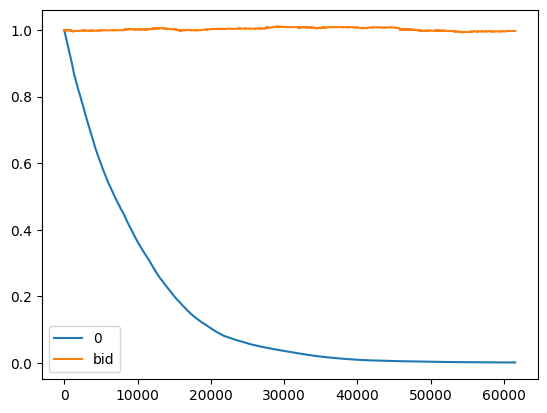

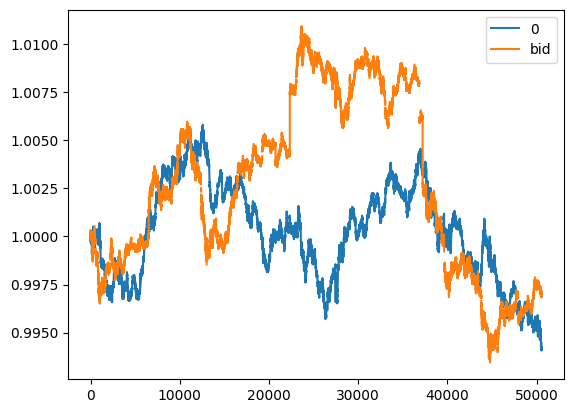

              short  neutral   long
true_short    12605     3986  15390
true_neutral  29534     9873  36808
true_long     12720     4073  15011
                 short   neutral      long
true_short    0.229771  0.222284  0.228987
true_neutral  0.538362  0.550580  0.547665
true_long     0.231867  0.227136  0.223348


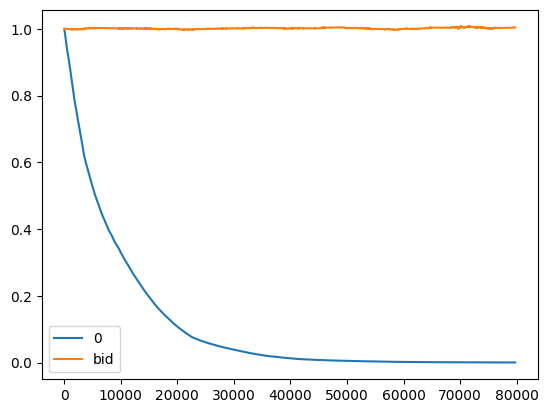

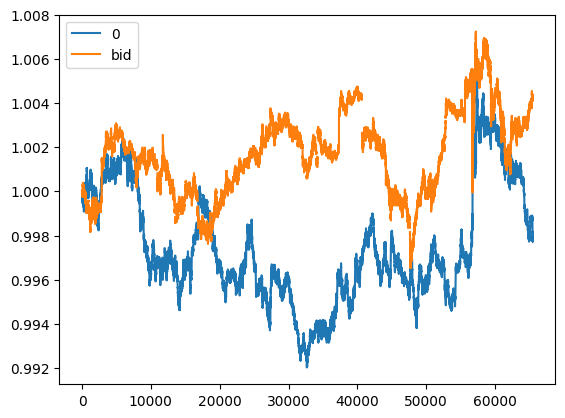


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00363_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

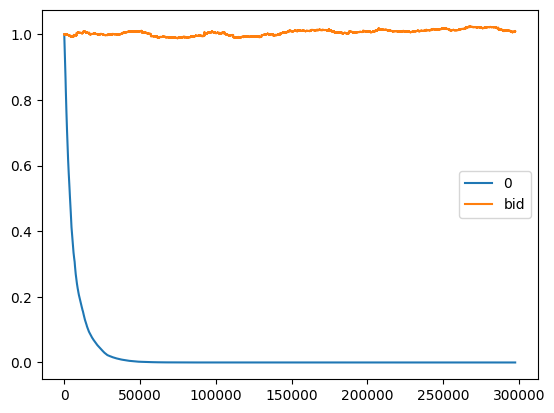

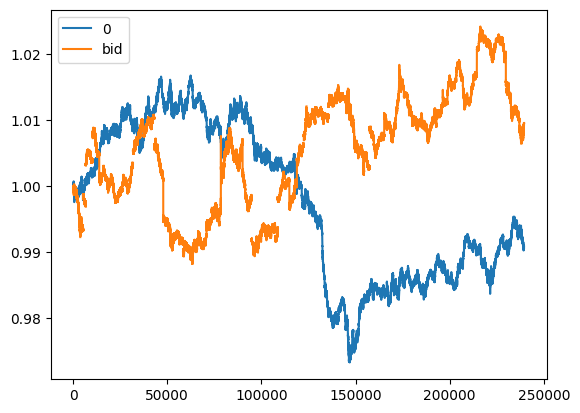

              short  neutral   long
true_short    17259     1285  13437
true_neutral  38717     2924  34574
true_long     15994     1107  14703
                 short   neutral      long
true_short    0.239808  0.241723  0.214258
true_neutral  0.537960  0.550038  0.551296
true_long     0.222231  0.208239  0.234445


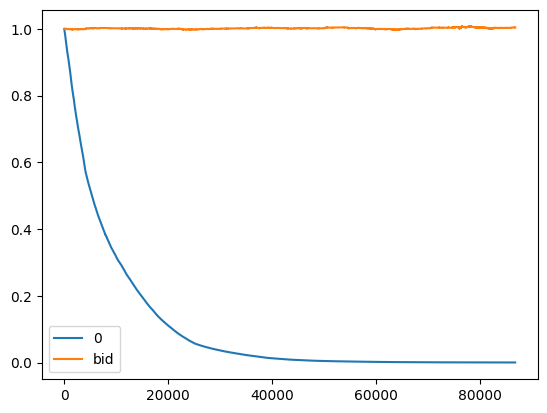

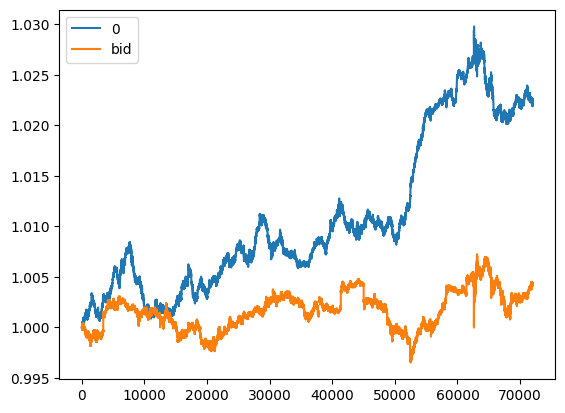

              short  neutral   long
true_short    15636     1068  14084
true_neutral  37739     2729  35857
true_long     16850     1105  14932
                 short   neutral      long
true_short    0.222656  0.217870  0.217101
true_neutral  0.537401  0.556712  0.552726
true_long     0.239943  0.225418  0.230173


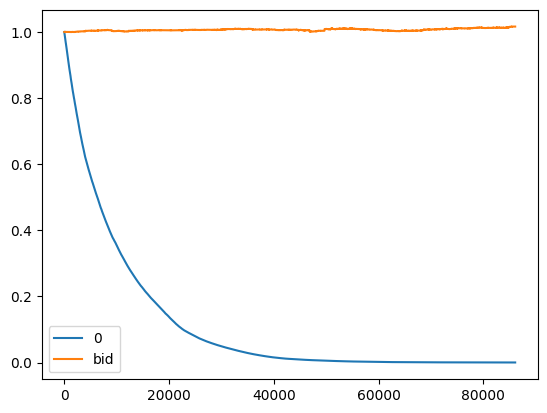

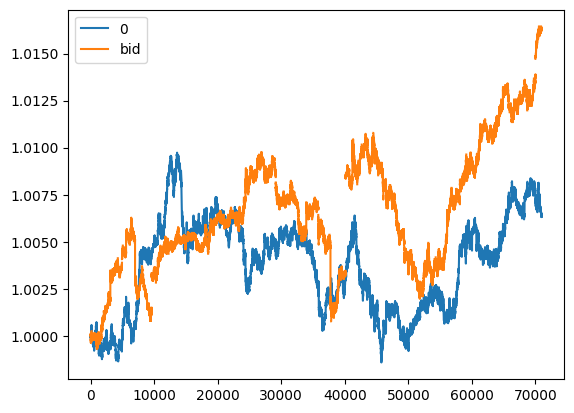


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00368_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regula

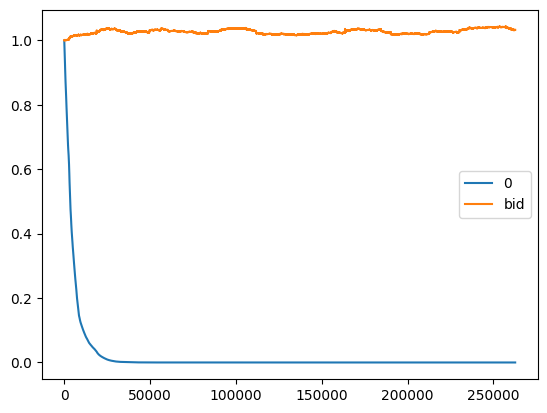

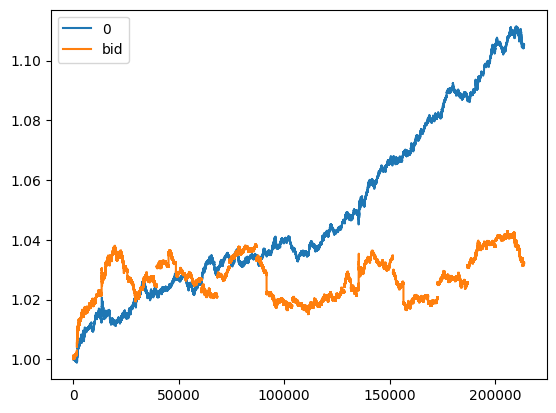

              short  neutral   long
true_short     9244     2145   9490
true_neutral  25928     5420  26013
true_long     10307     1981   9472
                 short   neutral      long
true_short    0.203259  0.224701  0.211006
true_neutral  0.570109  0.567777  0.578388
true_long     0.226632  0.207521  0.210606


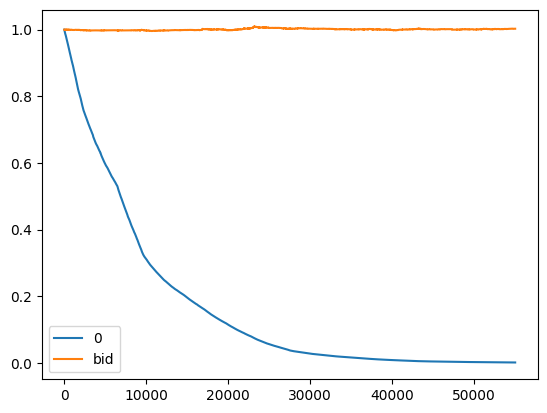

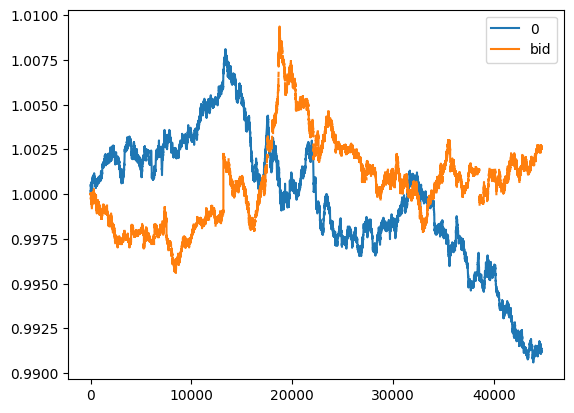

              short  neutral   long
true_short    11635     2631  11109
true_neutral  25445     5780  25950
true_long     11949     2718  12783
                 short   neutral      long
true_short    0.237309  0.236409  0.222884
true_neutral  0.518979  0.519364  0.520645
true_long     0.243713  0.244227  0.256470


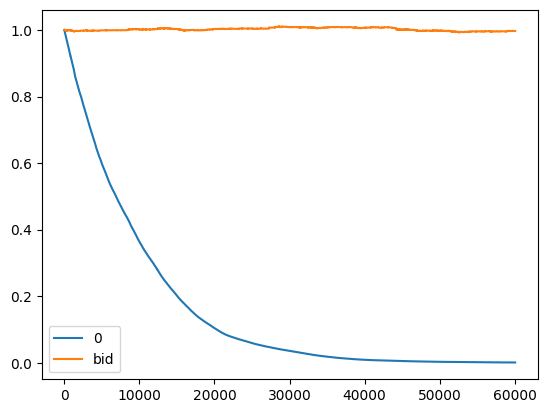

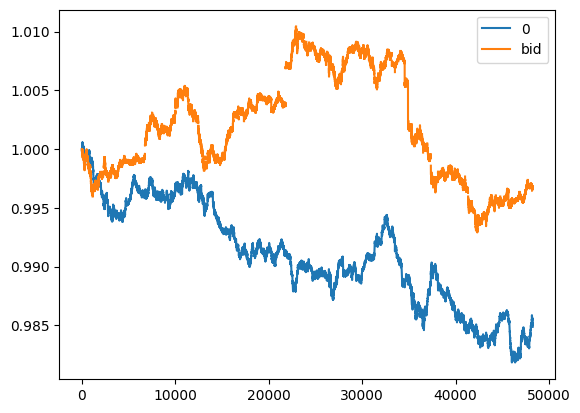


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00368_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

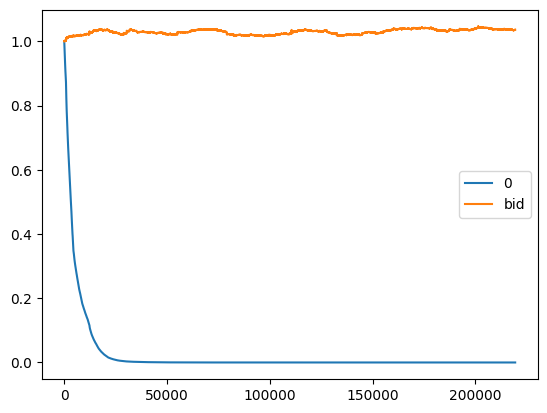

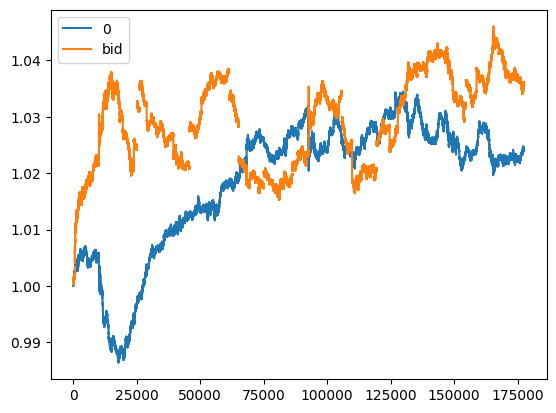

              short  neutral   long
true_short    14794     5261   5320
true_neutral  31892    12619  12664
true_long     15396     5426   6628
                 short   neutral      long
true_short    0.238298  0.225736  0.216155
true_neutral  0.513708  0.541449  0.514546
true_long     0.247995  0.232816  0.269300


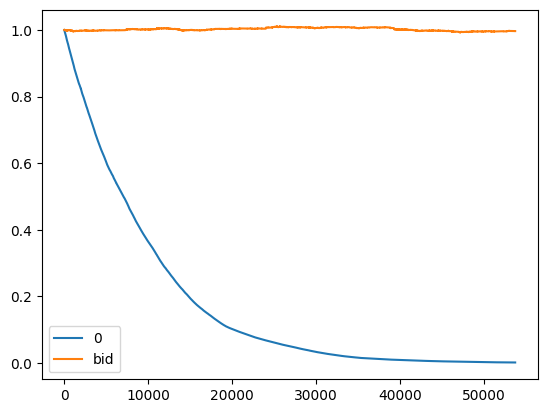

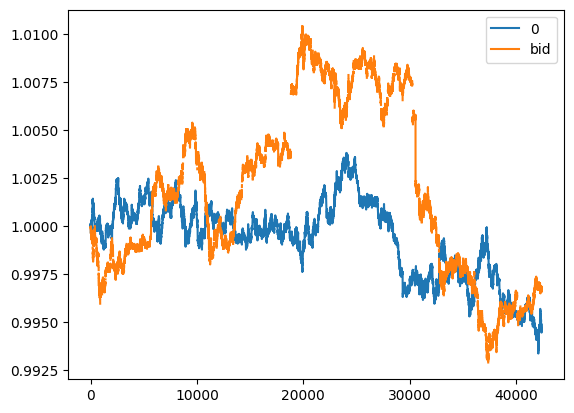

              short  neutral   long
true_short    18543     6180   7275
true_neutral  44271    14562  17393
true_long     19126     5682   6968
                 short   neutral      long
true_short    0.226300  0.233878  0.229960
true_neutral  0.540286  0.551090  0.549785
true_long     0.233415  0.215032  0.220255


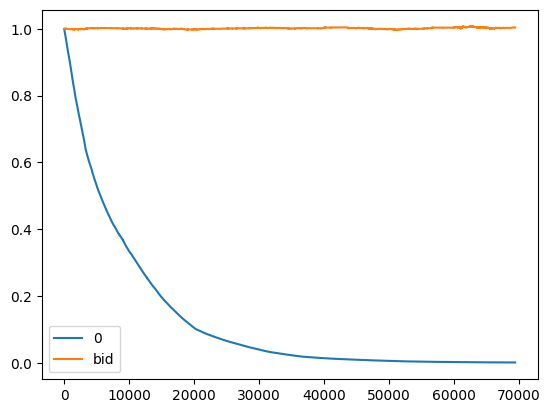

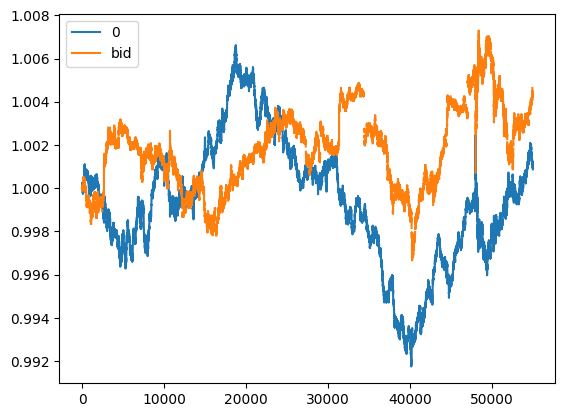


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00368_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

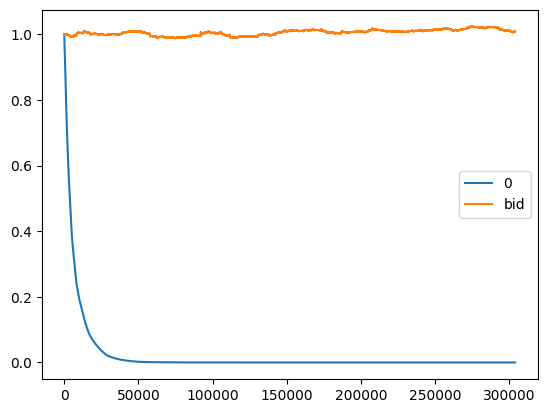

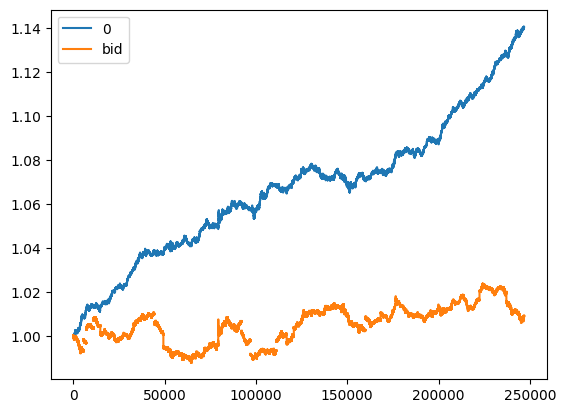

              short  neutral   long
true_short    17537     1208  13253
true_neutral  42925     2479  30822
true_long     17503     1017  13256
                 short   neutral      long
true_short    0.224934  0.256803  0.231166
true_neutral  0.550568  0.526998  0.537615
true_long     0.224498  0.216199  0.231219


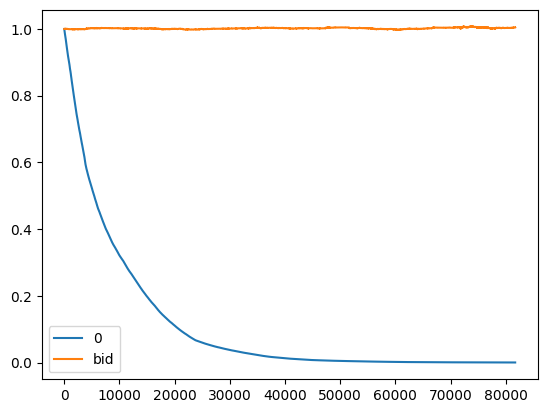

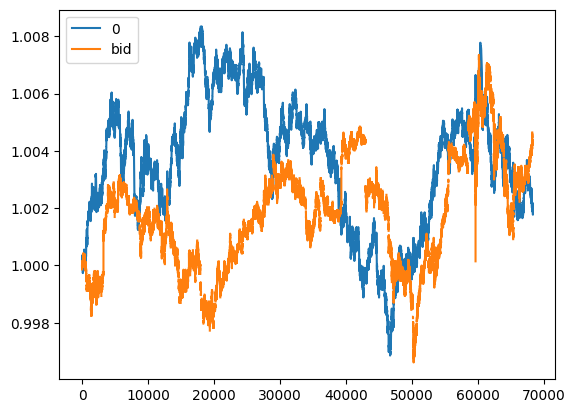

              short  neutral   long
true_short    17292      756  12816
true_neutral  42585     2120  31580
true_long     18648      758  13445
                 short   neutral      long
true_short    0.220210  0.208035  0.221573
true_neutral  0.542311  0.583379  0.545979
true_long     0.237479  0.208586  0.232448


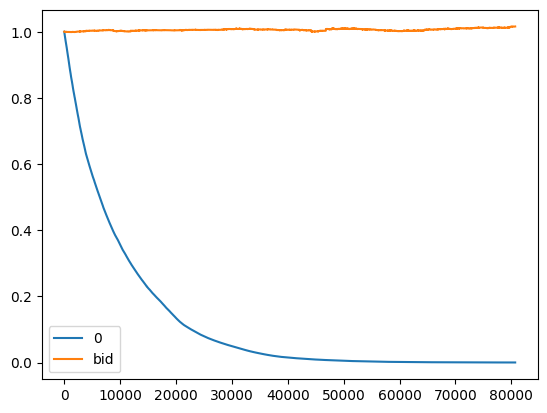

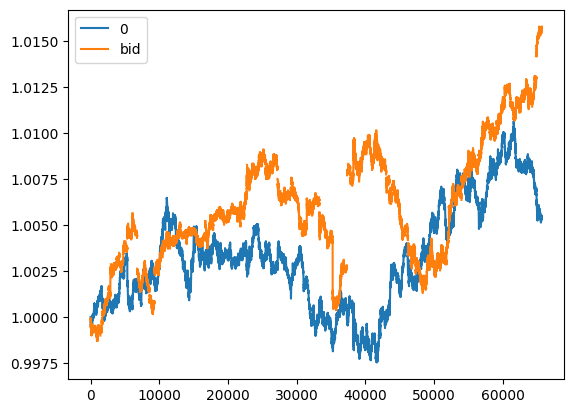


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00368_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

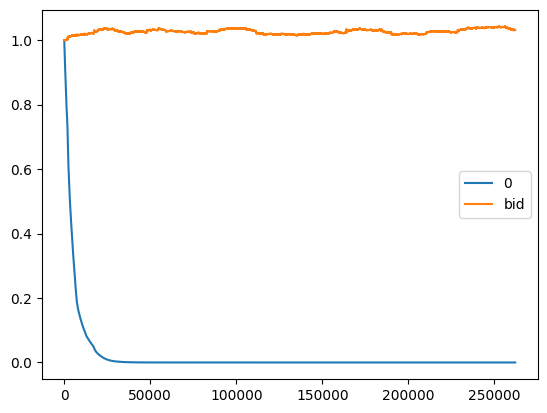

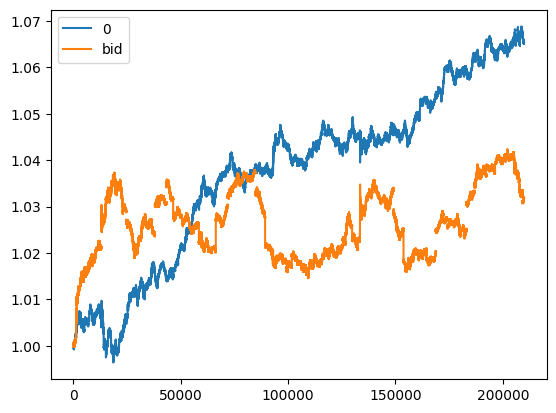

              short  neutral   long
true_short    11549     2287   7109
true_neutral  30145     6831  20354
true_long     12232     2379   7114
                 short   neutral      long
true_short    0.214164  0.198921  0.205599
true_neutral  0.559007  0.594155  0.588657
true_long     0.226829  0.206924  0.205744


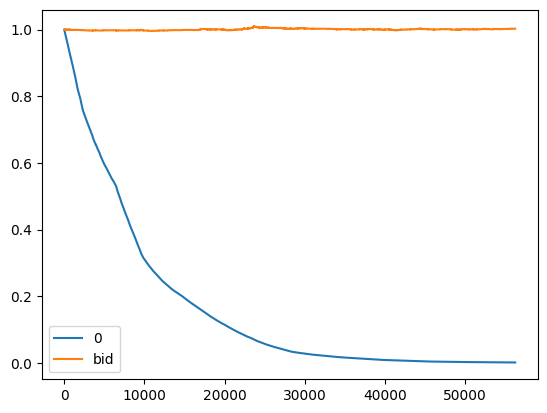

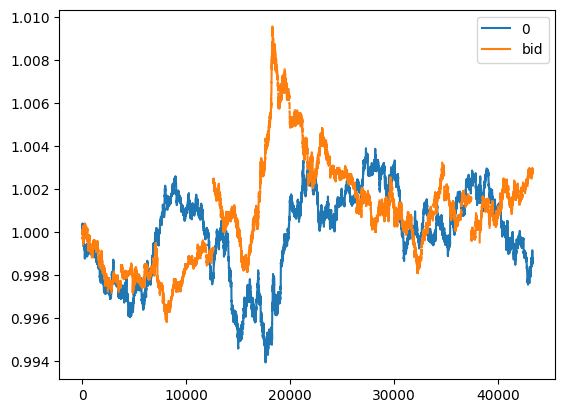

              short  neutral   long
true_short    12712     3194   9478
true_neutral  28671     7741  20795
true_long     13700     3361  10348
                 short   neutral      long
true_short    0.230779  0.223419  0.233328
true_neutral  0.520505  0.541480  0.511927
true_long     0.248716  0.235101  0.254745


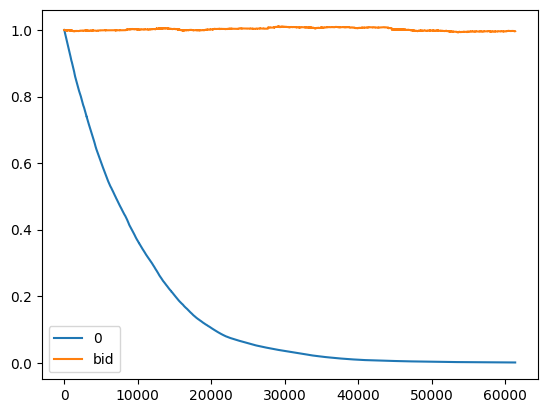

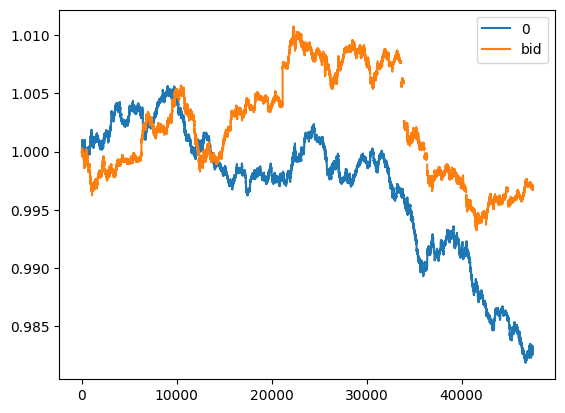


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00368_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

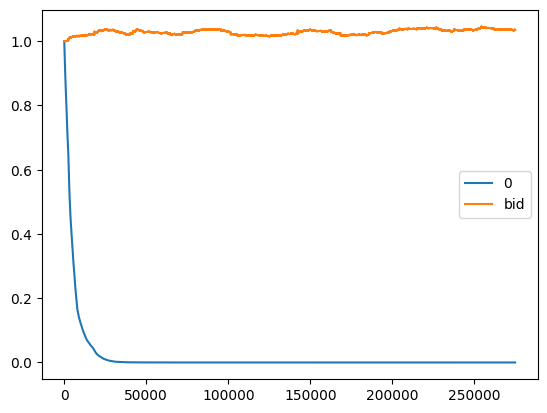

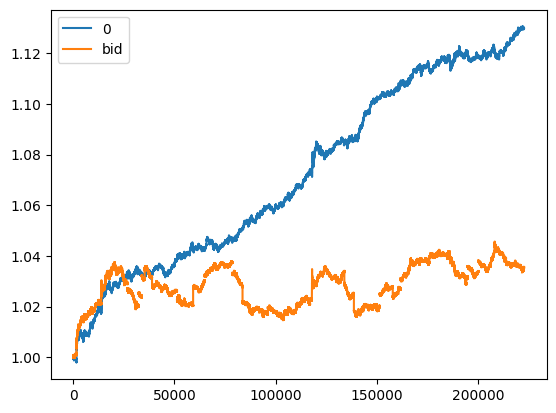

              short  neutral   long
true_short    12878     2555   9951
true_neutral  28992     5746  22469
true_long     13671     2733  11005
                 short   neutral      long
true_short    0.231865  0.231557  0.229154
true_neutral  0.521993  0.520754  0.517421
true_long     0.246142  0.247689  0.253425


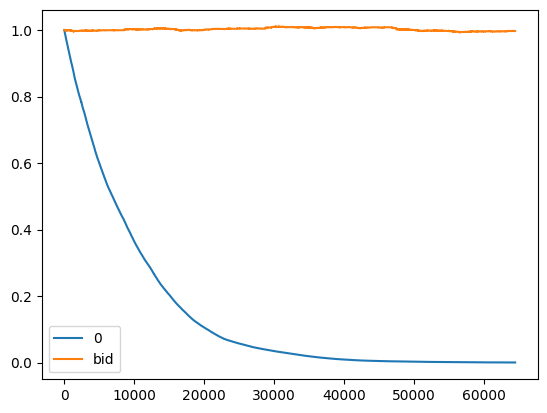

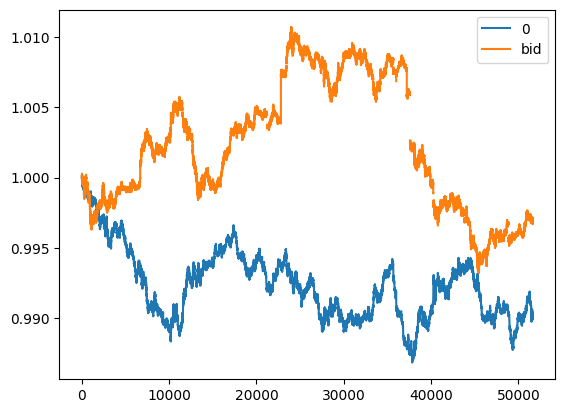

              short  neutral   long
true_short    17112     3282  11602
true_neutral  41514     8087  26612
true_long     18228     3148  10416
                 short   neutral      long
true_short    0.222656  0.226080  0.238577
true_neutral  0.540167  0.557071  0.547234
true_long     0.237177  0.216849  0.214189


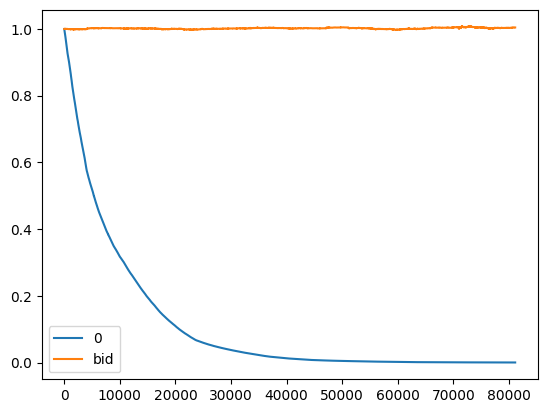

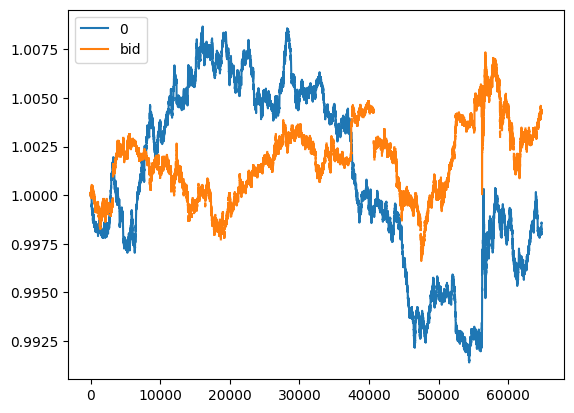

copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00366_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regula

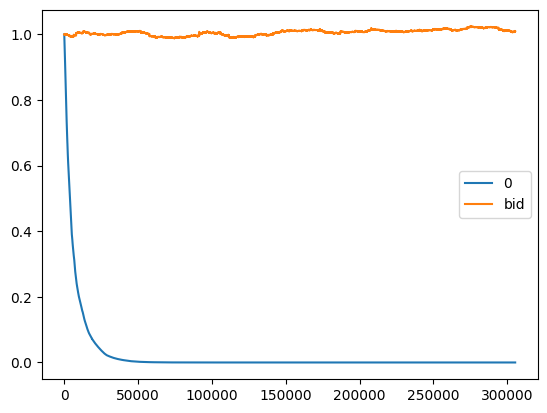

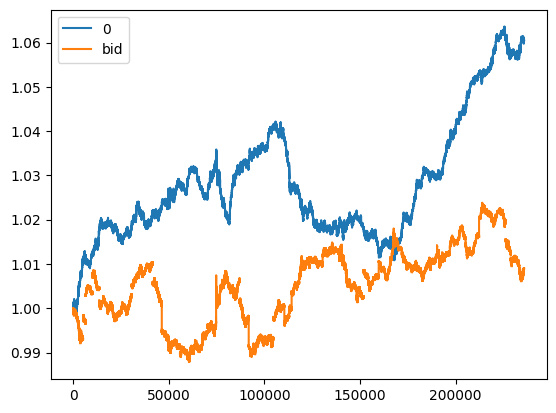

              short  neutral   long
true_short    21188     1382   9426
true_neutral  49980     3282  22951
true_long     21135     1204   9452
                 short   neutral      long
true_short    0.229548  0.235515  0.225346
true_neutral  0.541478  0.559305  0.548686
true_long     0.228974  0.205181  0.225968


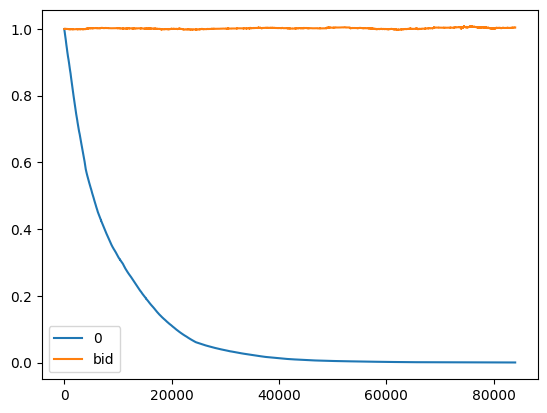

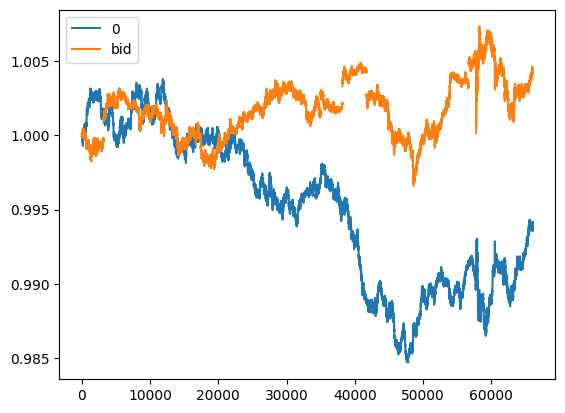

              short  neutral   long
true_short    22733     1012   7038
true_neutral  56312     2948  17080
true_long     24301     1315   7261
                 short   neutral      long
true_short    0.219970  0.191848  0.224290
true_neutral  0.544888  0.558863  0.544313
true_long     0.235142  0.249289  0.231397


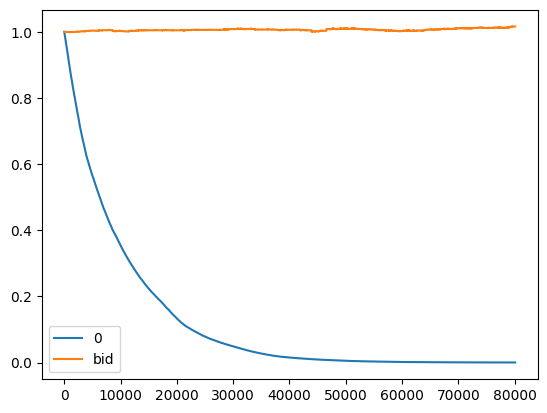

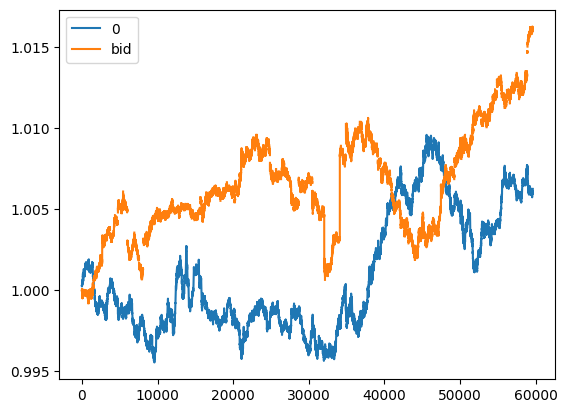


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regula

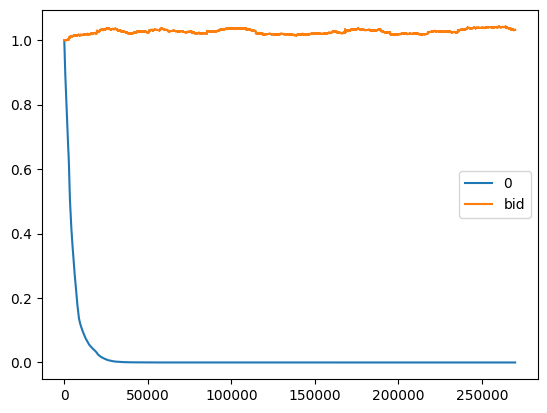

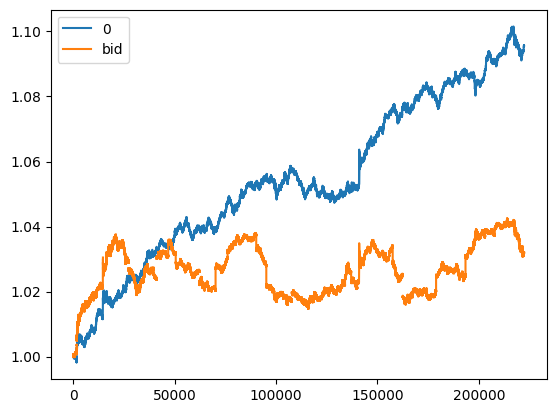

              short  neutral   long
true_short    10330     1438   9226
true_neutral  27822     4236  25252
true_long     10840     1516   9340
                 short   neutral      long
true_short    0.210851  0.200000  0.210553
true_neutral  0.567889  0.589152  0.576293
true_long     0.221261  0.210848  0.213154


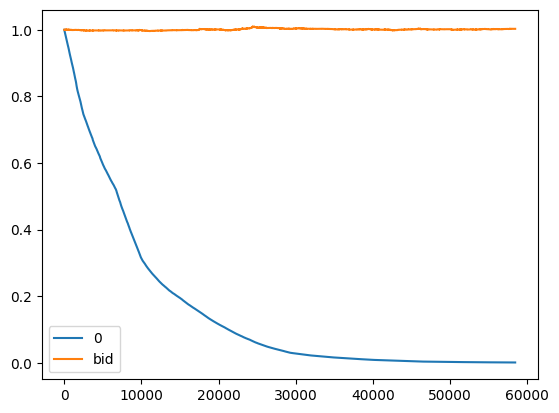

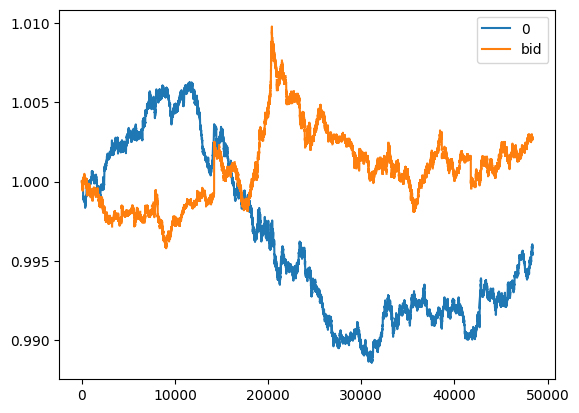

              short  neutral   long
true_short    10543     1741  13074
true_neutral  24770     3906  28570
true_long     11956     1758  13682
                 short   neutral      long
true_short    0.223043  0.235111  0.236308
true_neutral  0.524022  0.527481  0.516394
true_long     0.252935  0.237407  0.247298


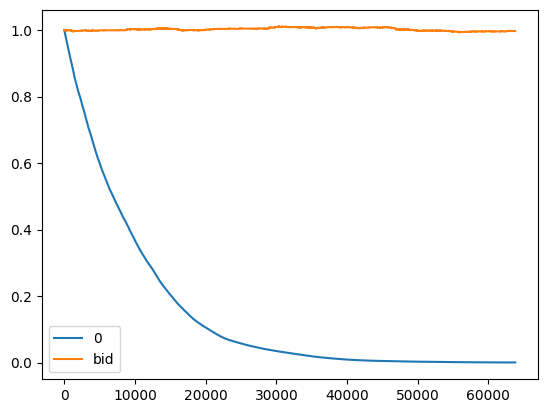

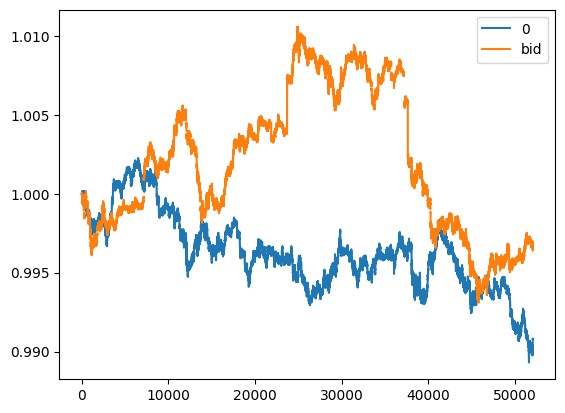


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

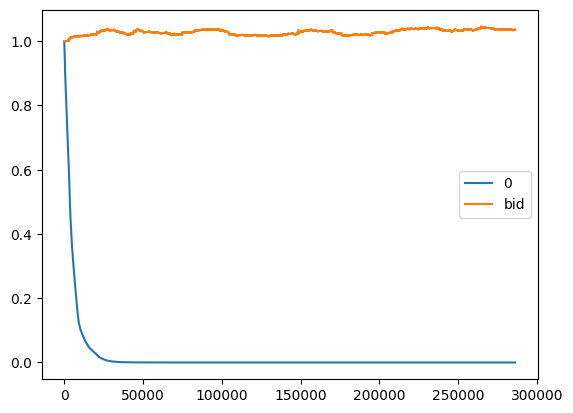

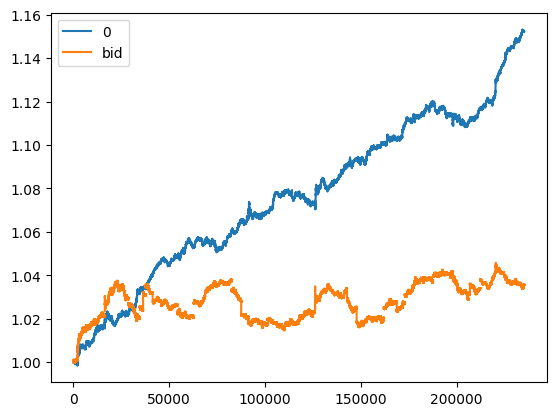

              short  neutral   long
true_short    12699     1037  11622
true_neutral  28163     2228  26855
true_long     13756     1070  12570
                 short   neutral      long
true_short    0.232506  0.239216  0.227673
true_neutral  0.515636  0.513956  0.526084
true_long     0.251858  0.246828  0.246244


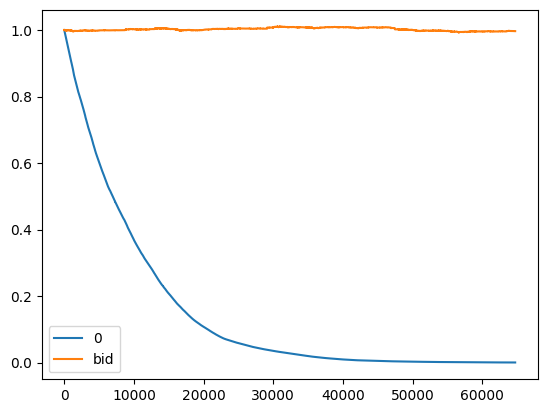

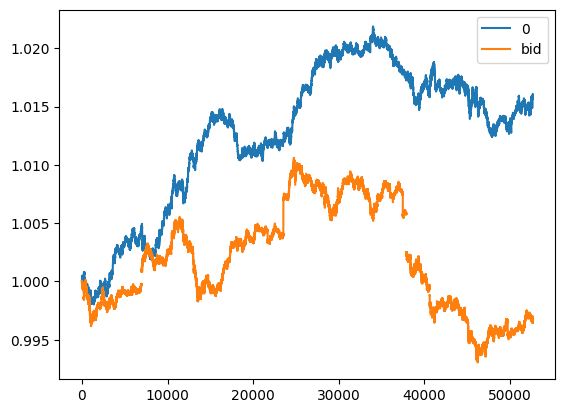

              short  neutral   long
true_short    13818     1125  17034
true_neutral  32989     2728  40498
true_long     14367     1115  16326
                 short   neutral      long
true_short    0.225880  0.226449  0.230632
true_neutral  0.539265  0.549114  0.548322
true_long     0.234855  0.224436  0.221046


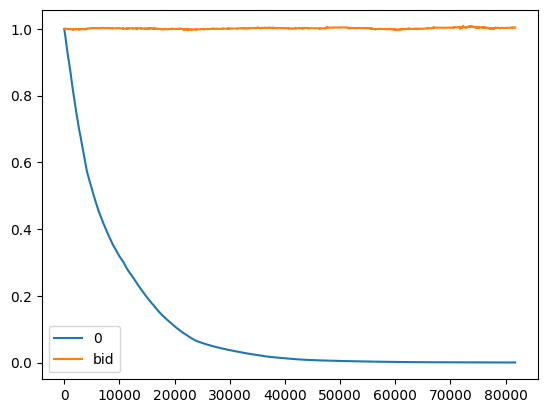

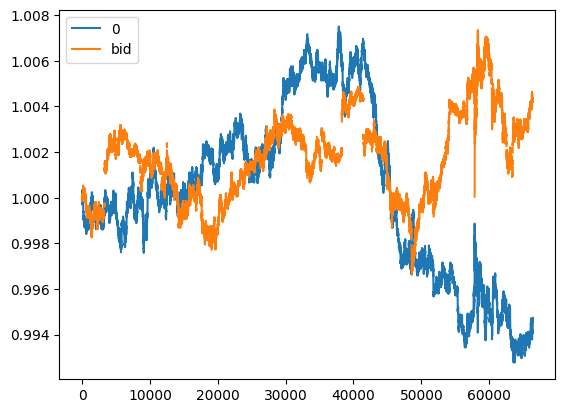


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

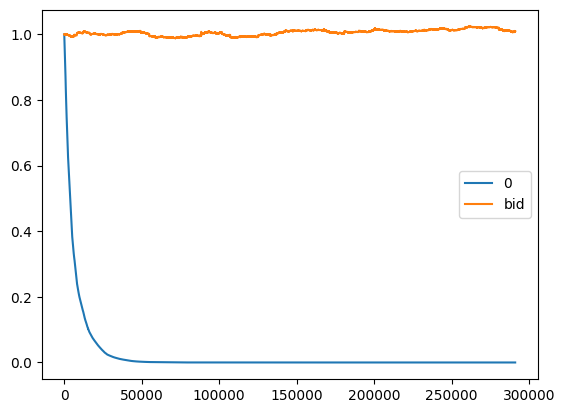

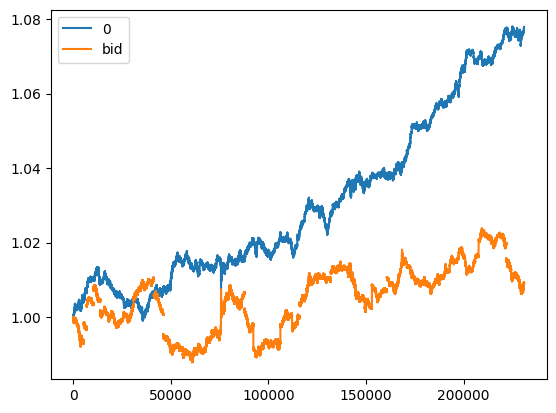

              short  neutral   long
true_short    19281     1015  11681
true_neutral  45452     2090  28673
true_long     19308      792  11708
                 short   neutral      long
true_short    0.229424  0.260457  0.224367
true_neutral  0.540831  0.536310  0.550747
true_long     0.229745  0.203233  0.224886


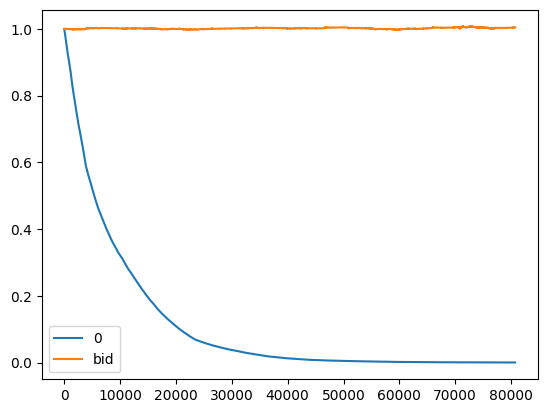

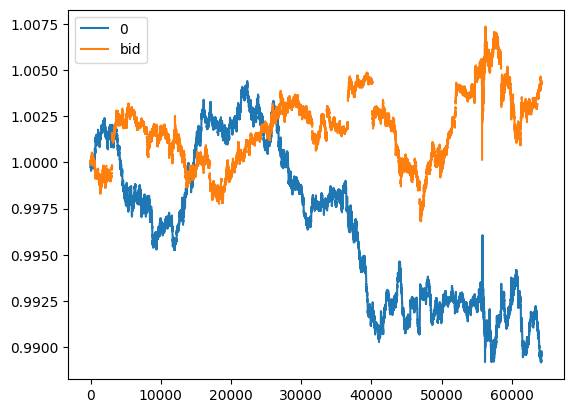

              short  neutral   long
true_short    20848      653   9300
true_neutral  49882     1717  24732
true_long     21916      661  10291
                 short  neutral      long
true_short    0.225029  0.21544  0.209823
true_neutral  0.538415  0.56648  0.557995
true_long     0.236556  0.21808  0.232182


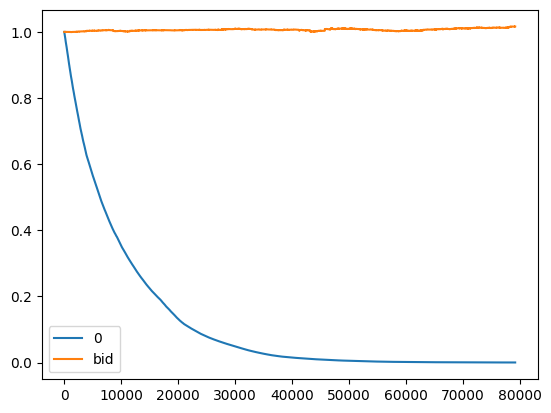

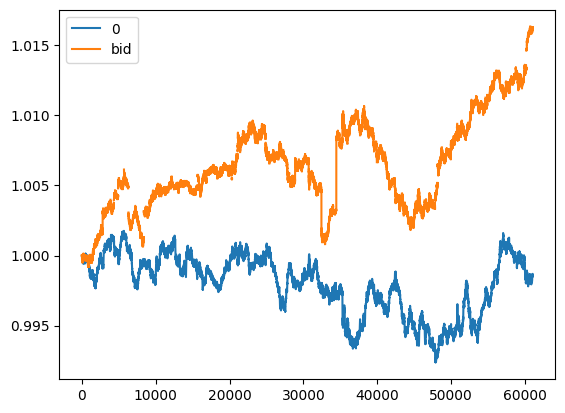


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00364_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

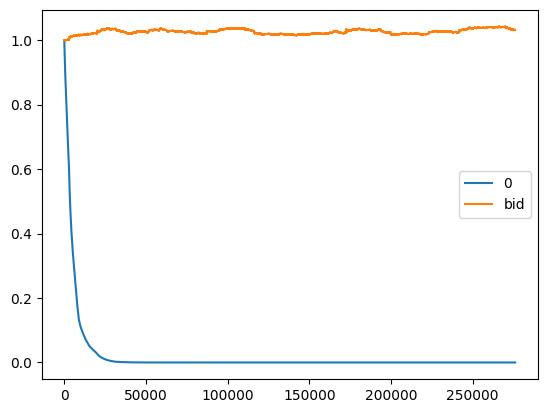

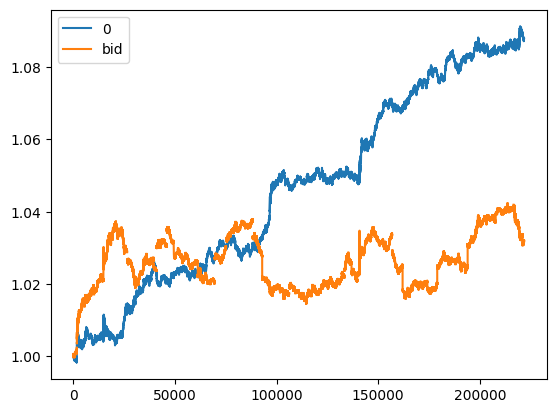

              short  neutral   long
true_short    13663     1269   5994
true_neutral  36764     3548  17066
true_long     13920     1309   6467
                 short   neutral      long
true_short    0.212333  0.207150  0.203001
true_neutral  0.571340  0.579171  0.577979
true_long     0.216327  0.213679  0.219020


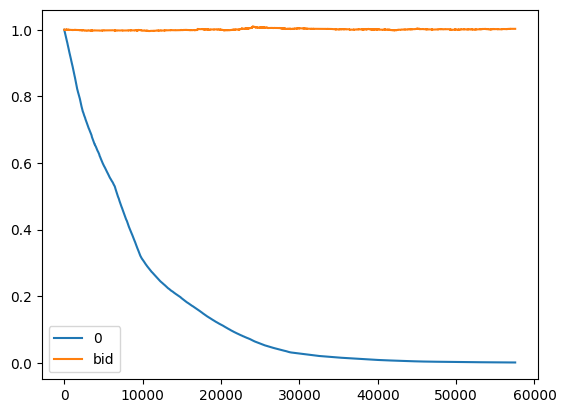

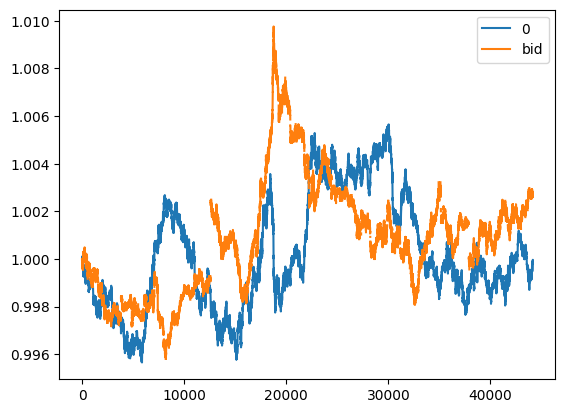

              short  neutral   long
true_short    15967     1501   7830
true_neutral  35656     3334  18320
true_long     16755     1557   9080
                 short   neutral      long
true_short    0.233511  0.234825  0.222254
true_neutral  0.521454  0.521589  0.520011
true_long     0.245035  0.243586  0.257735


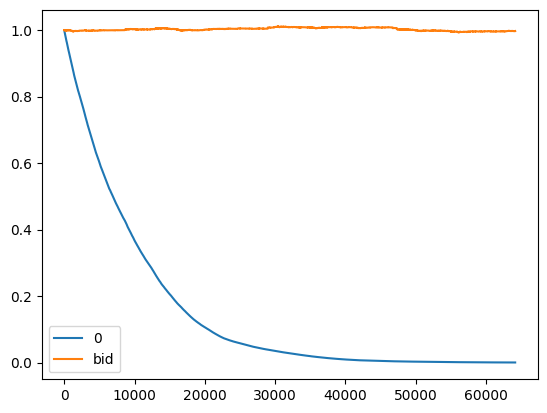

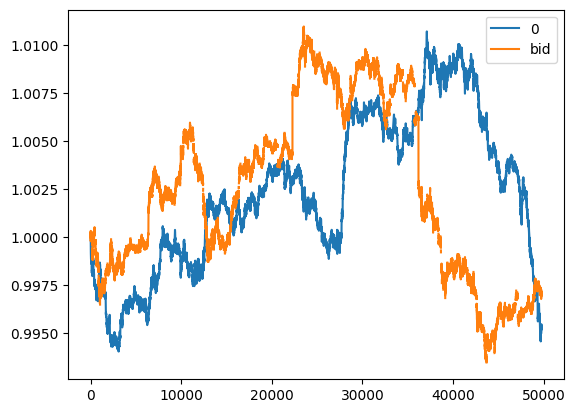

copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regula

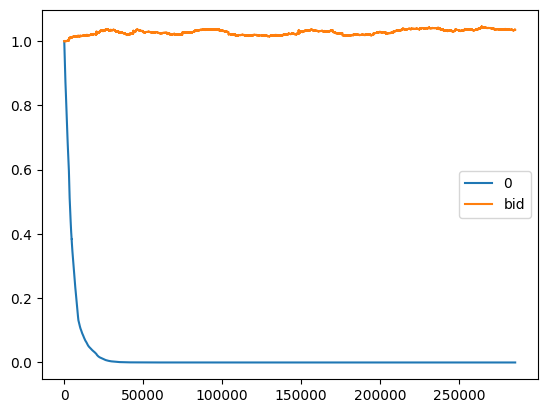

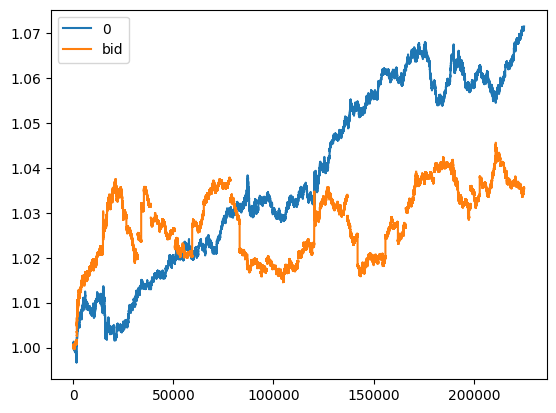

              short  neutral   long
true_short    14077     1564   9657
true_neutral  31773     3611  21926
true_long     15701     1858   9833
                 short   neutral      long
true_short    0.228705  0.222380  0.233171
true_neutral  0.516206  0.513437  0.529409
true_long     0.255089  0.264183  0.237420


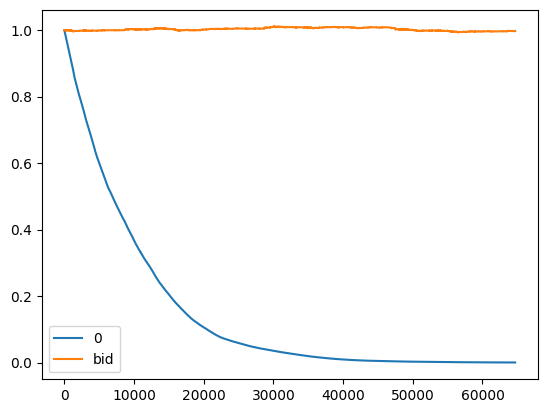

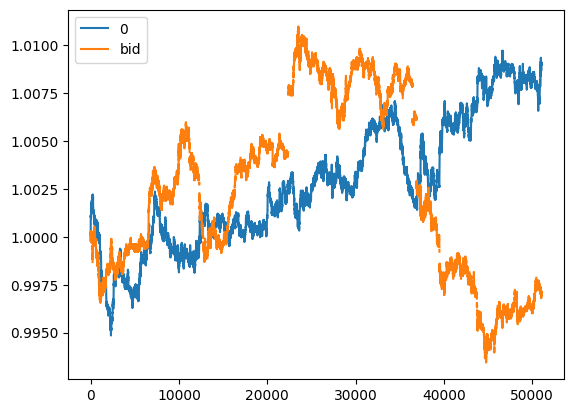

              short  neutral   long
true_short    18713     2006  11262
true_neutral  45010     4674  26531
true_long     18590     2045  11169
                 short   neutral      long
true_short    0.227340  0.229914  0.230015
true_neutral  0.546815  0.535702  0.541869
true_long     0.225845  0.234384  0.228116


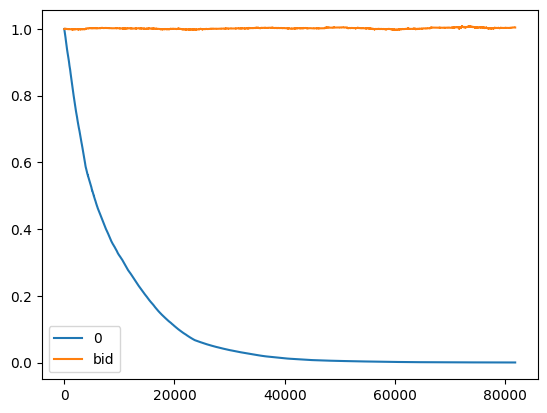

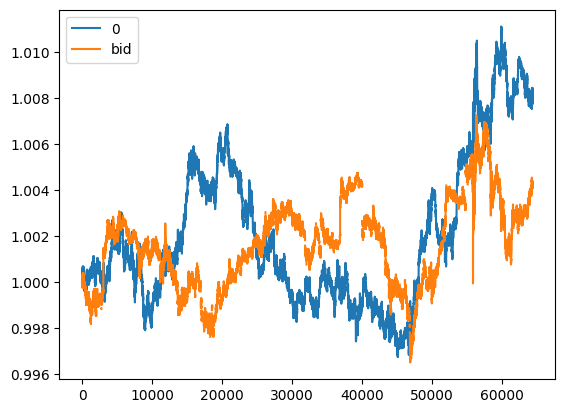


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

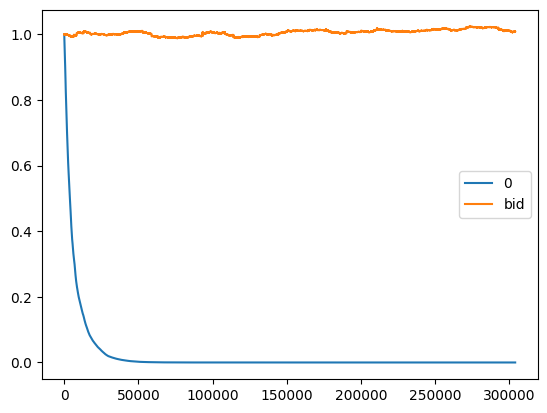

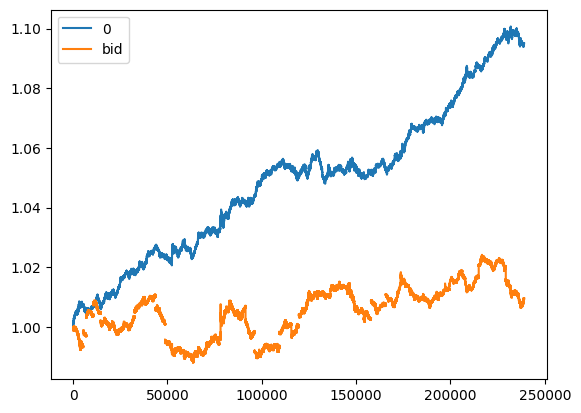

              short  neutral   long
true_short    21360     1049   9572
true_neutral  49879     2449  23887
true_long     21011      975   9818
                 short   neutral      long
true_short    0.231545  0.234518  0.221180
true_neutral  0.540694  0.547507  0.551956
true_long     0.227762  0.217975  0.226864


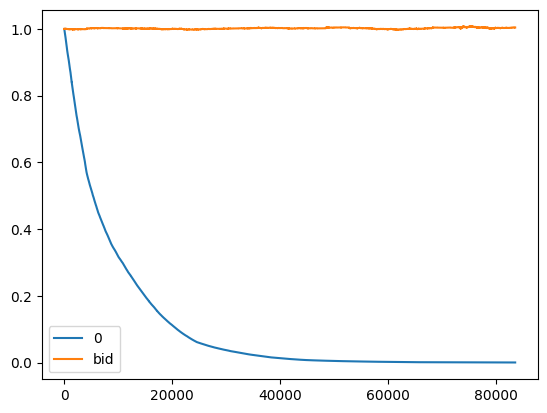

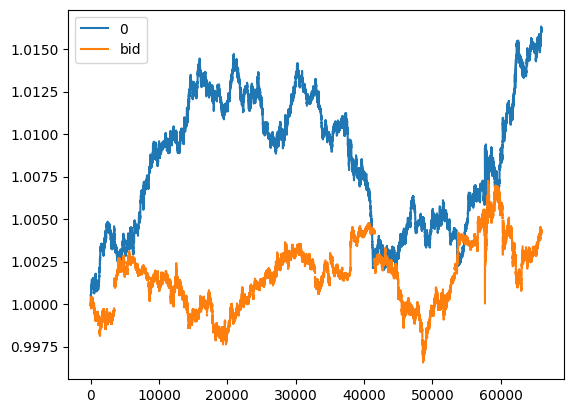

              short  neutral   long
true_short    22149      748   7891
true_neutral  54098     2199  20028
true_long     23672      767   8448
                 short   neutral      long
true_short    0.221670  0.201400  0.216982
true_neutral  0.541419  0.592084  0.550719
true_long     0.236912  0.206516  0.232299


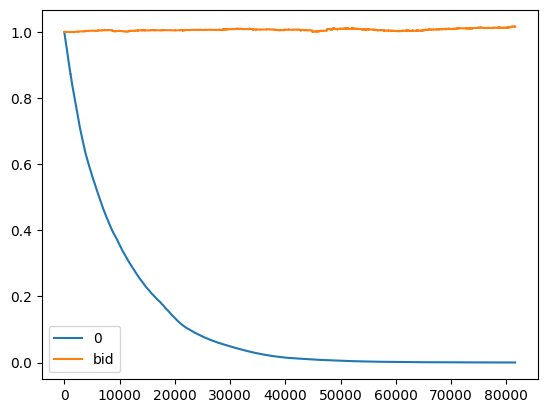

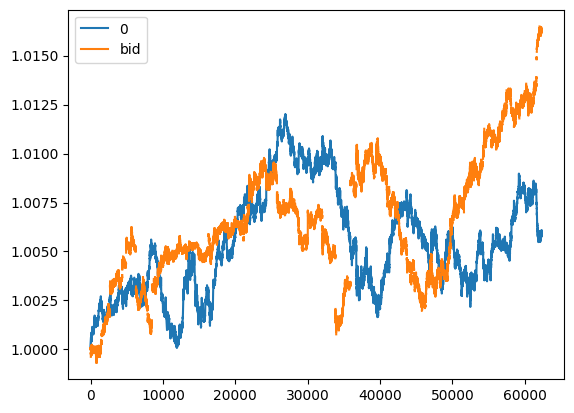


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

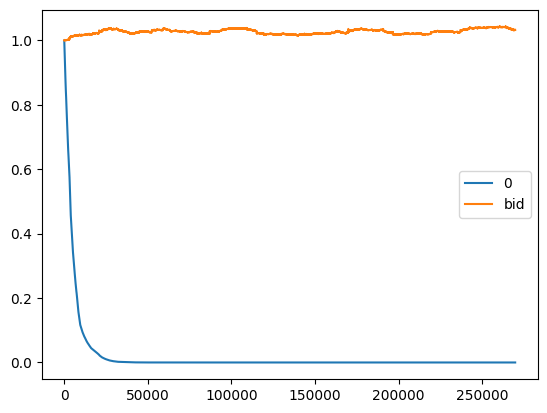

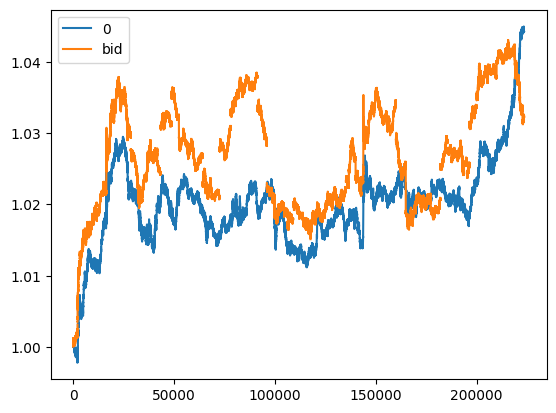

              short  neutral   long
true_short     9620     2069   9190
true_neutral  26891     5597  24873
true_long     10255     2173   9332
                 short   neutral      long
true_short    0.205705  0.210286  0.211776
true_neutral  0.575012  0.568859  0.573177
true_long     0.219283  0.220856  0.215048


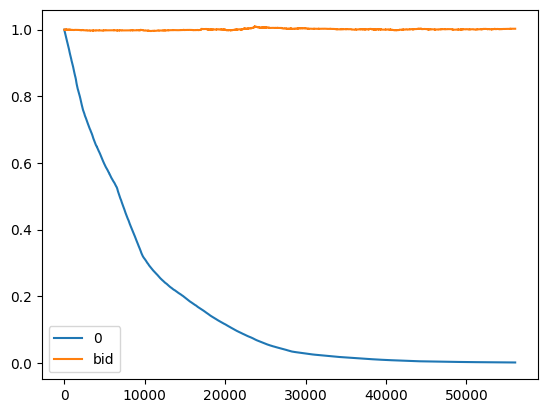

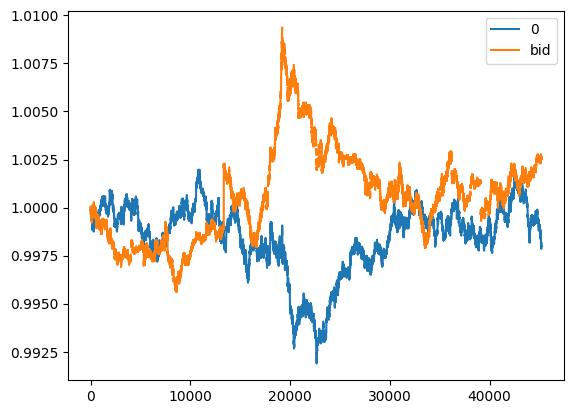

              short  neutral   long
true_short    11621     2646  11108
true_neutral  26246     5429  25500
true_long     12308     2880  12262
                 short   neutral      long
true_short    0.231609  0.241534  0.227297
true_neutral  0.523089  0.495573  0.521793
true_long     0.245301  0.262894  0.250911


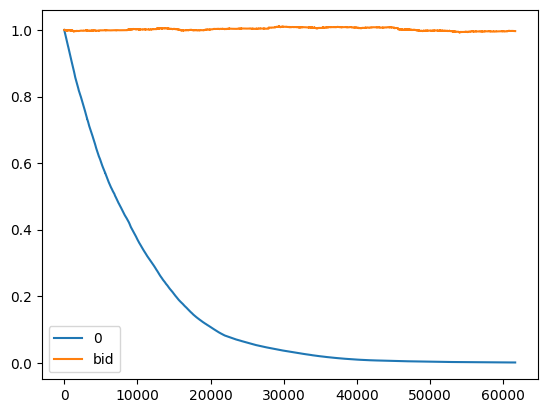

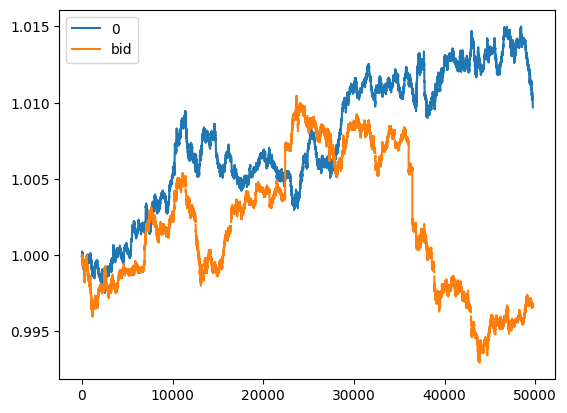


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

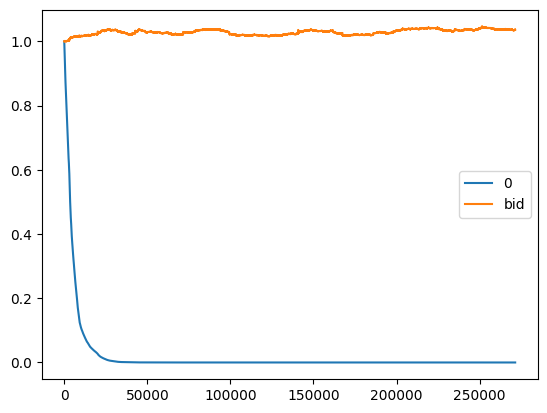

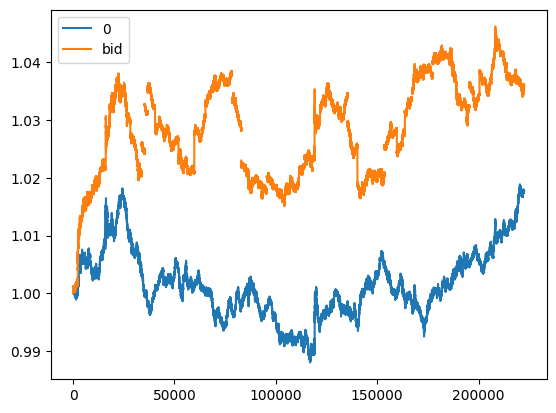

              short  neutral   long
true_short    10807     2620  11948
true_neutral  24082     5424  27669
true_long     11344     2916  13191
                 short   neutral      long
true_short    0.233751  0.239051  0.226254
true_neutral  0.520883  0.494891  0.523955
true_long     0.245366  0.266058  0.249792


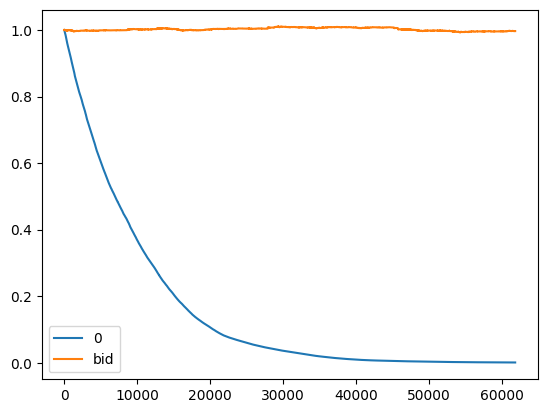

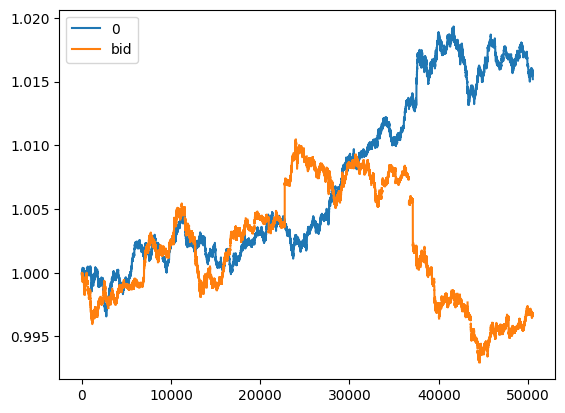

              short  neutral   long
true_short    13720     3316  14962
true_neutral  32647     8030  35549
true_long     13340     2945  15491
                 short   neutral      long
true_short    0.229789  0.232034  0.226690
true_neutral  0.546787  0.561892  0.538605
true_long     0.223424  0.206074  0.234705


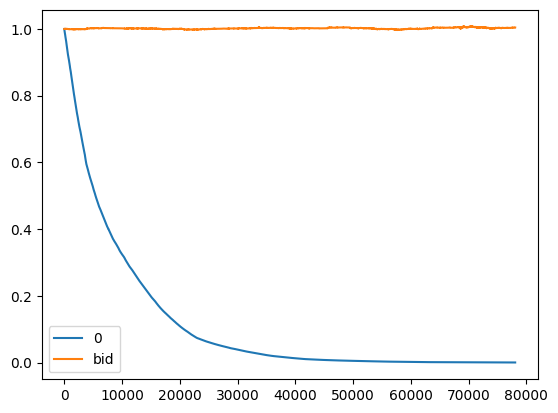

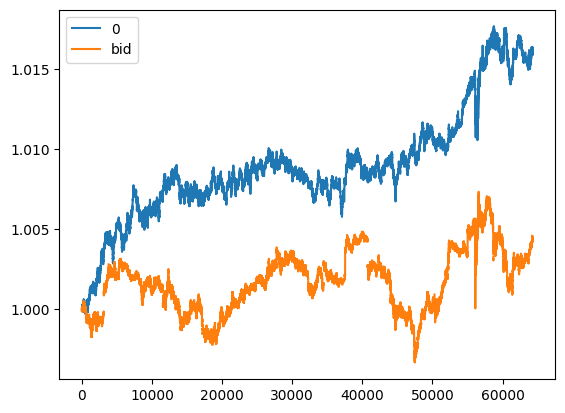


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

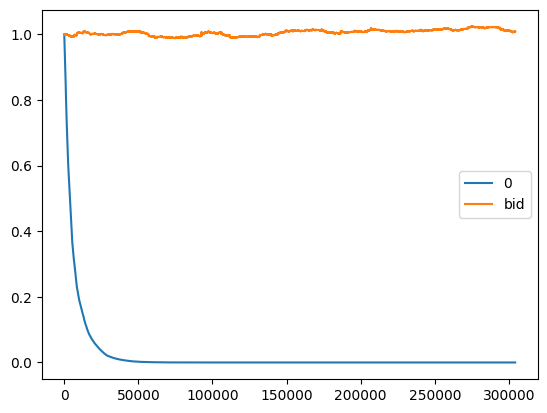

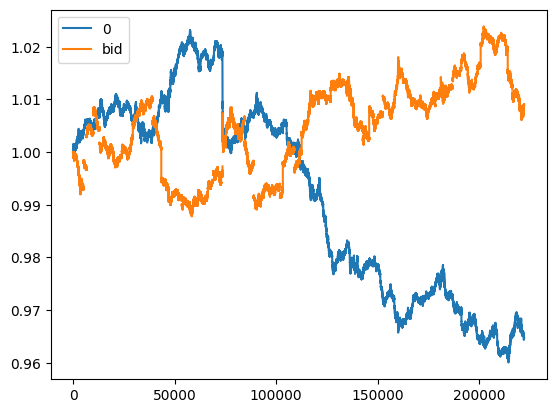

              short  neutral   long
true_short    26624      737   4637
true_neutral  63362     1780  11084
true_long     26464      633   4679
                 short   neutral      long
true_short    0.228630  0.233968  0.227304
true_neutral  0.544113  0.565079  0.543333
true_long     0.227256  0.200952  0.229363


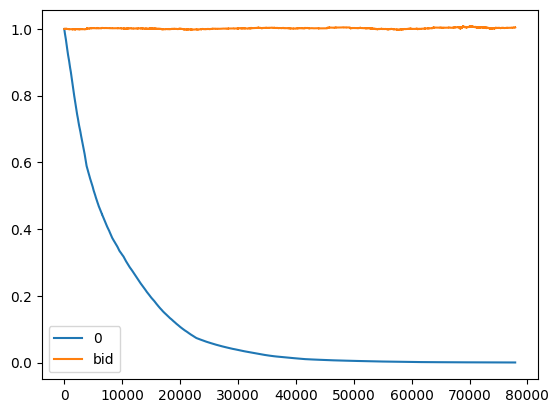

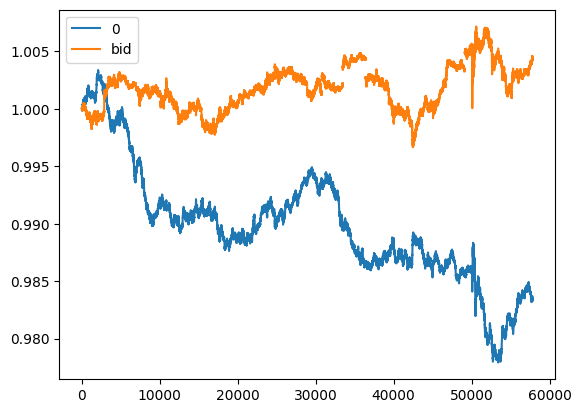

              short  neutral   long
true_short    25718      452   4694
true_neutral  63158     1215  11912
true_long     27178      474   5199
                 short   neutral      long
true_short    0.221604  0.211116  0.215272
true_neutral  0.544212  0.567492  0.546297
true_long     0.234184  0.221392  0.238432


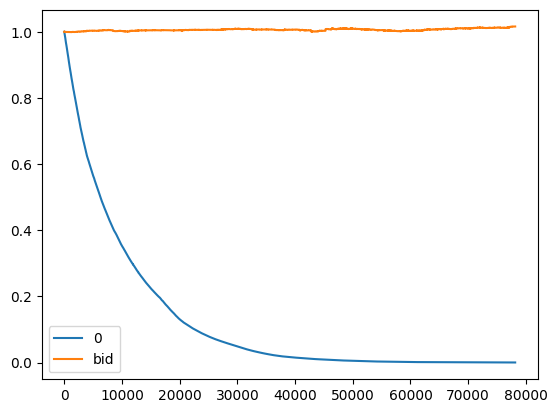

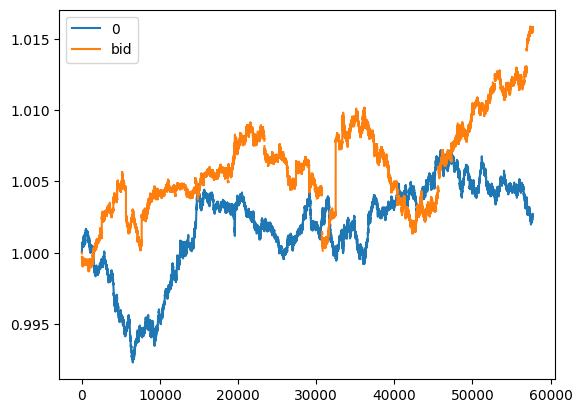


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

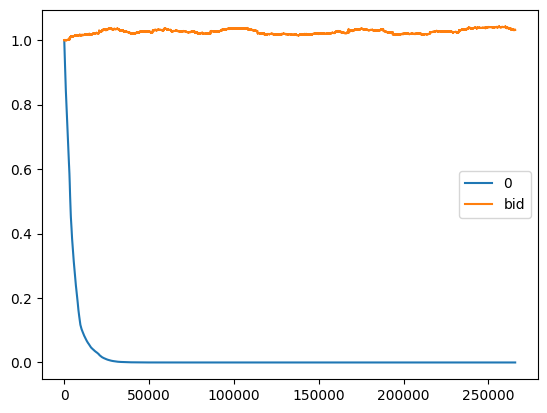

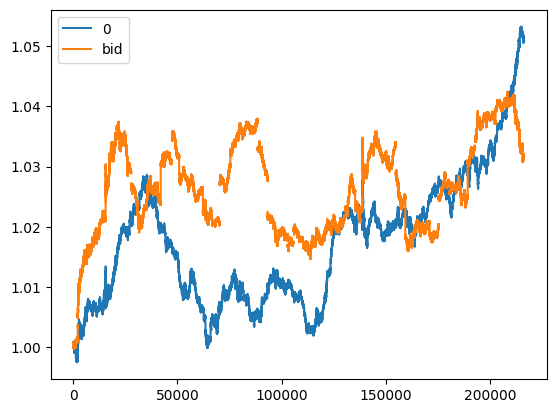

              short  neutral   long
true_short     8434     2558   9953
true_neutral  23292     7462  26576
true_long      8947     2839   9939
                 short   neutral      long
true_short    0.207361  0.198927  0.214190
true_neutral  0.572665  0.580294  0.571920
true_long     0.219974  0.220779  0.213889


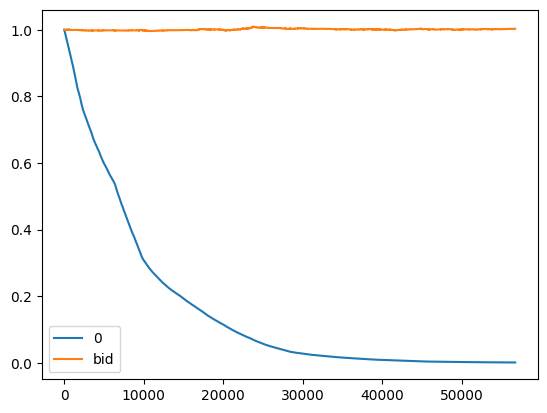

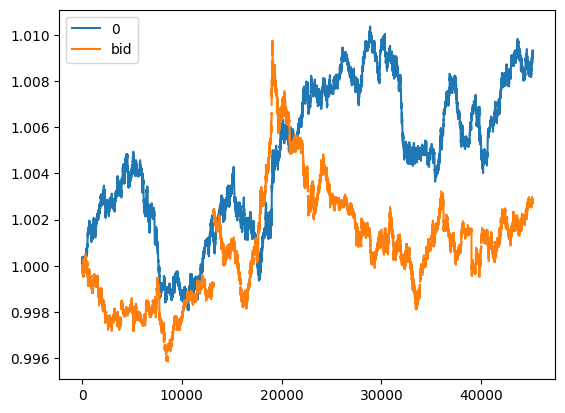

              short  neutral   long
true_short    10141     3090  12153
true_neutral  22549     6691  27967
true_long     10415     3369  13625
                 short   neutral      long
true_short    0.235263  0.234981  0.226123
true_neutral  0.523118  0.508821  0.520365
true_long     0.241619  0.256198  0.253512


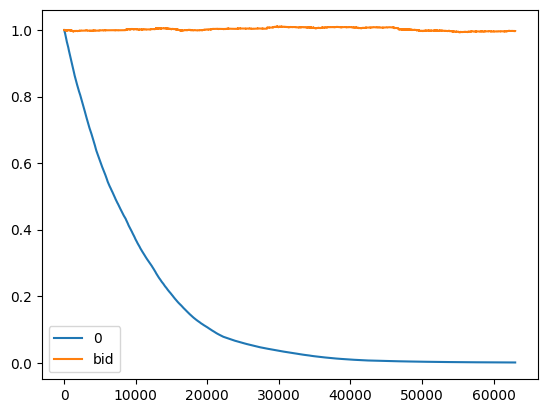

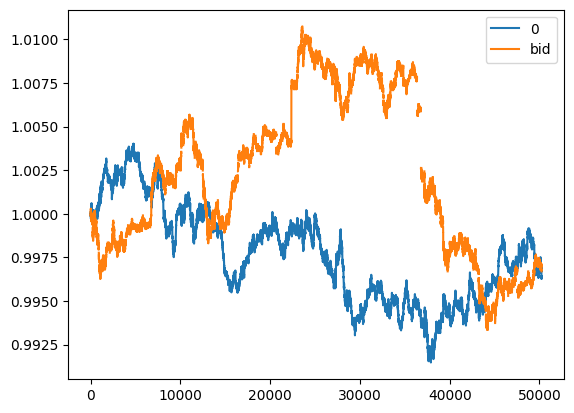


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

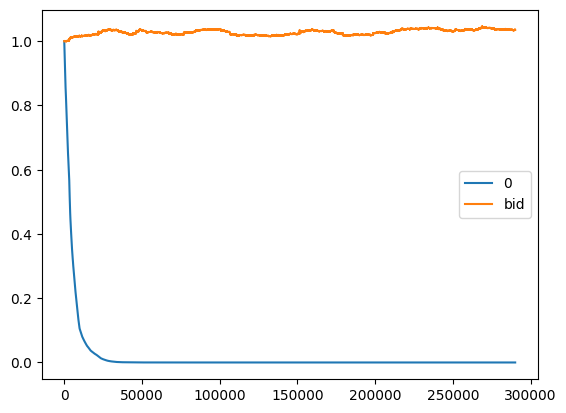

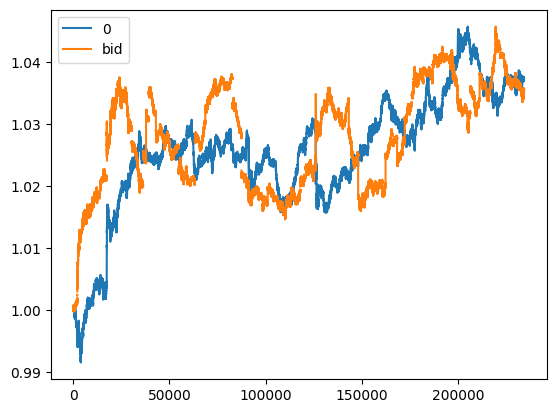

              short  neutral   long
true_short    14684     1148   9552
true_neutral  34008     2607  20592
true_long     16175     1209  10025
                 short   neutral      long
true_short    0.226371  0.231265  0.237795
true_neutral  0.524273  0.525181  0.512634
true_long     0.249356  0.243554  0.249571


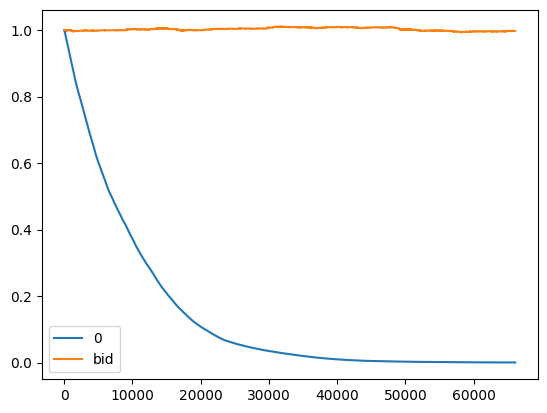

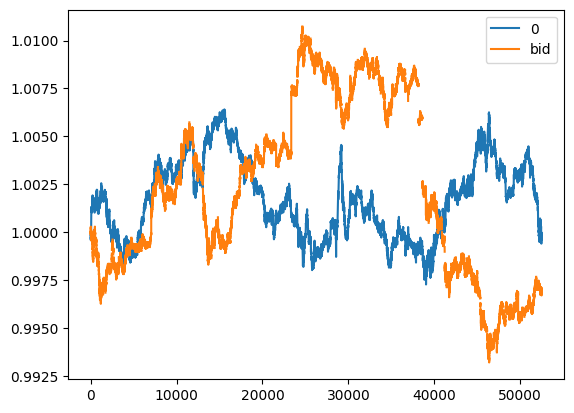

              short  neutral   long
true_short    19072     1469  11455
true_neutral  45438     3420  27355
true_long     19136     1212  11443
                 short   neutral      long
true_short    0.228009  0.240780  0.227947
true_neutral  0.543218  0.560564  0.544346
true_long     0.228774  0.198656  0.227708


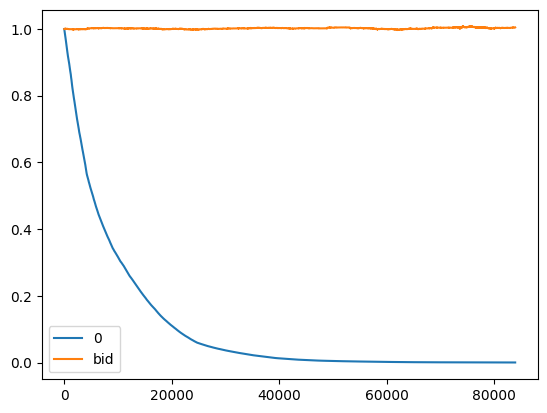

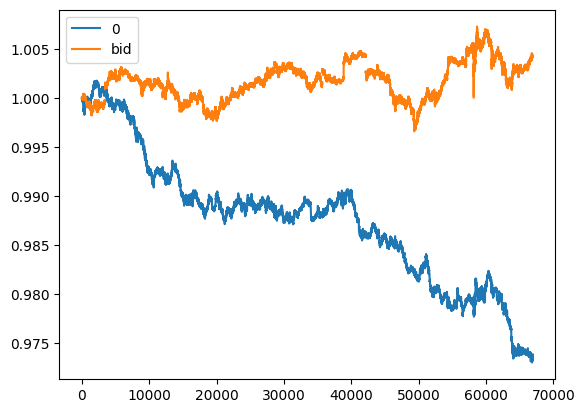


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

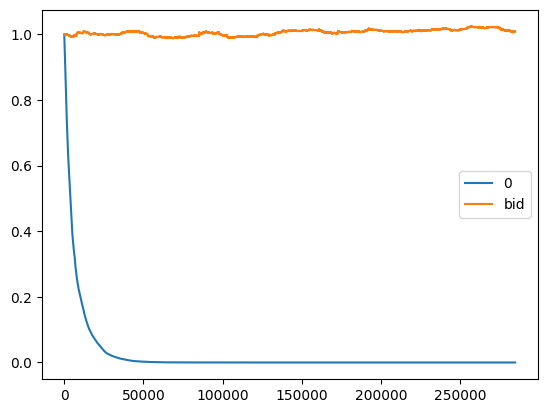

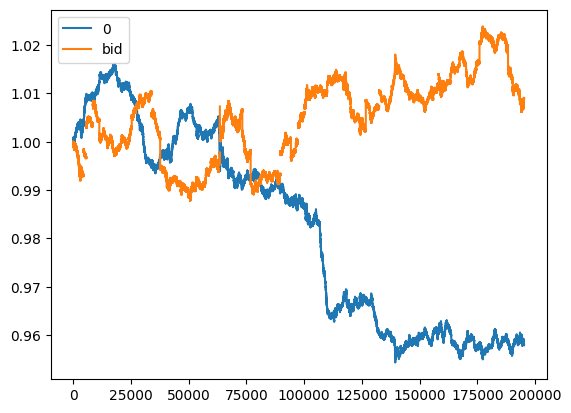

              short  neutral  long
true_short    27286     2290  2420
true_neutral  64940     5579  5694
true_long     27465     1896  2430
                 short   neutral      long
true_short    0.227970  0.234511  0.229514
true_neutral  0.542564  0.571326  0.540023
true_long     0.229466  0.194163  0.230463


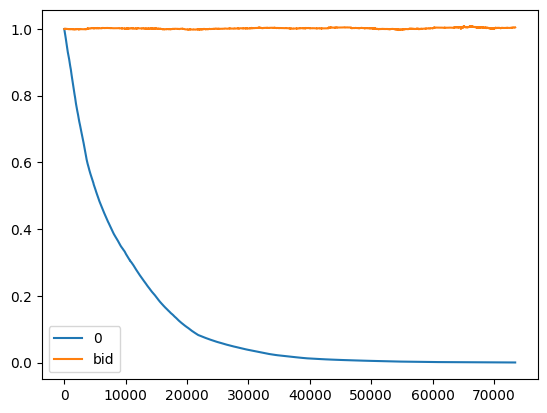

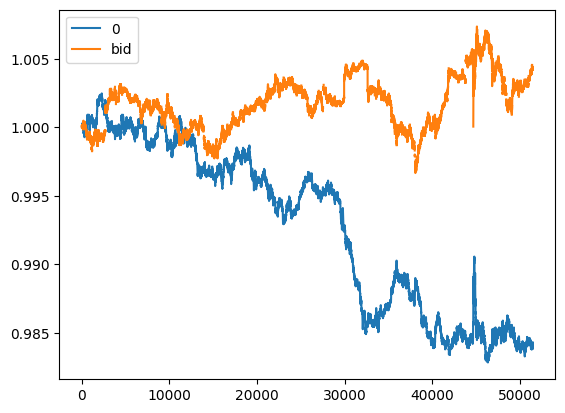

              short  neutral  long
true_short    26322     1634  2827
true_neutral  65009     4110  7221
true_long     27998     1564  3315
                 short   neutral      long
true_short    0.220583  0.223591  0.211554
true_neutral  0.544788  0.562397  0.540373
true_long     0.234629  0.214012  0.248073


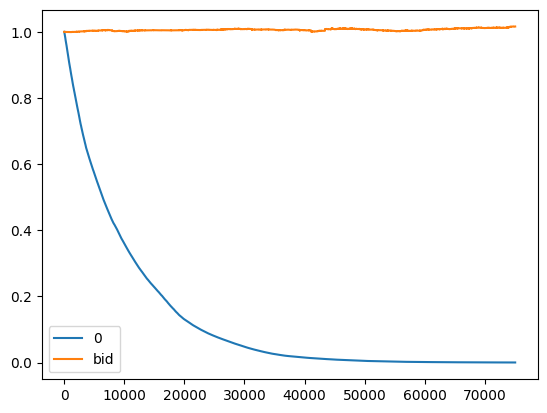

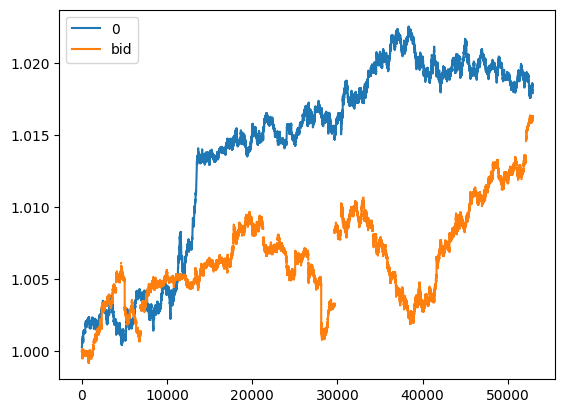


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

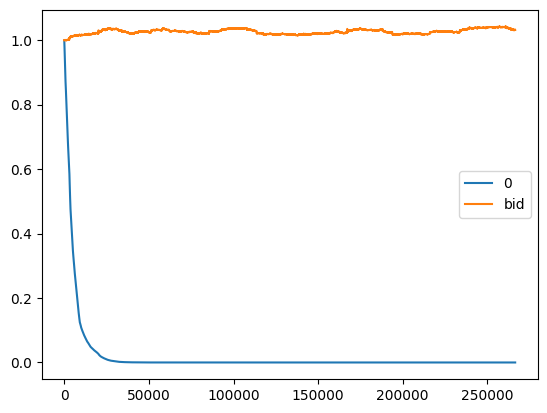

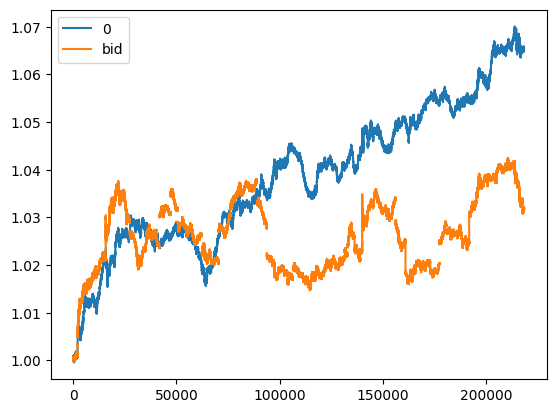

              short  neutral   long
true_short     6403     1987  12604
true_neutral  17849     5263  34198
true_long      7094     2009  12593
                 short   neutral      long
true_short    0.204268  0.214602  0.212206
true_neutral  0.569419  0.568420  0.575772
true_long     0.226313  0.216978  0.212021


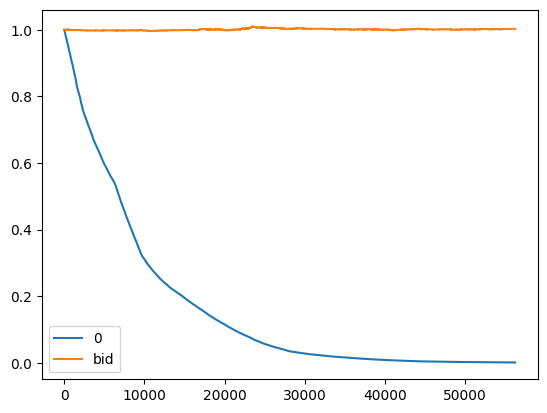

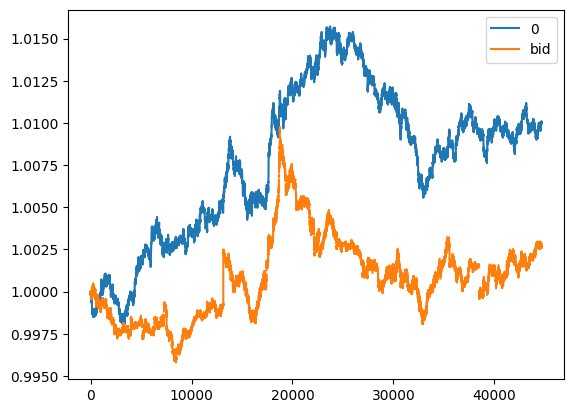

              short  neutral   long
true_short     7715     2423  15220
true_neutral  17366     5247  34633
true_long      8294     2690  16412
                 short   neutral      long
true_short    0.231161  0.233880  0.229684
true_neutral  0.520330  0.506467  0.522644
true_long     0.248509  0.259653  0.247672


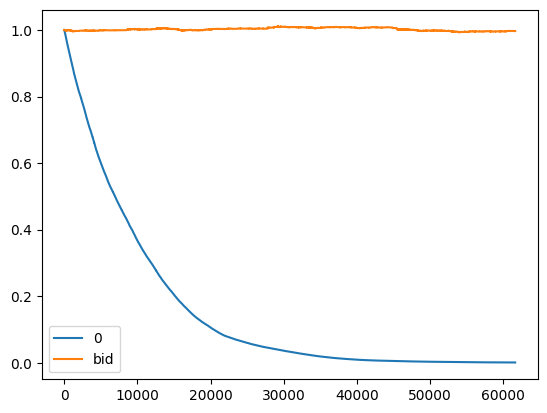

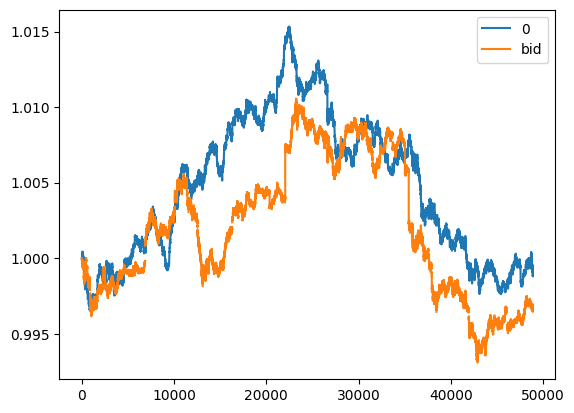


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

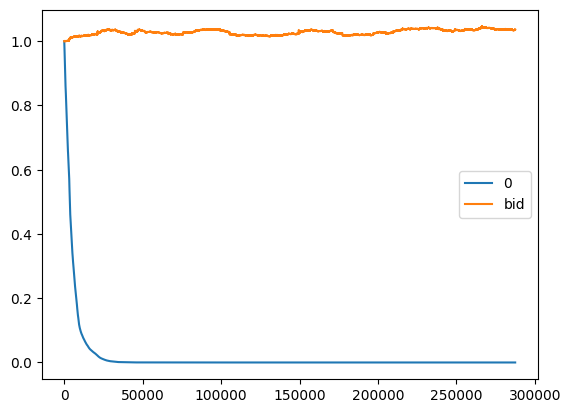

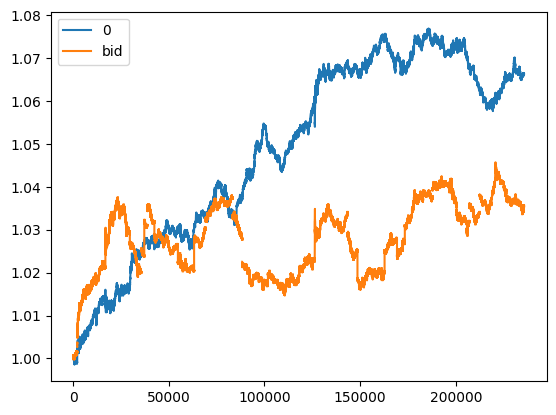

              short  neutral   long
true_short    11247     1331  12780
true_neutral  26055     2763  28428
true_long     12418     1478  13500
                 short   neutral      long
true_short    0.226207  0.238873  0.233604
true_neutral  0.524035  0.495872  0.519631
true_long     0.249759  0.265255  0.246765


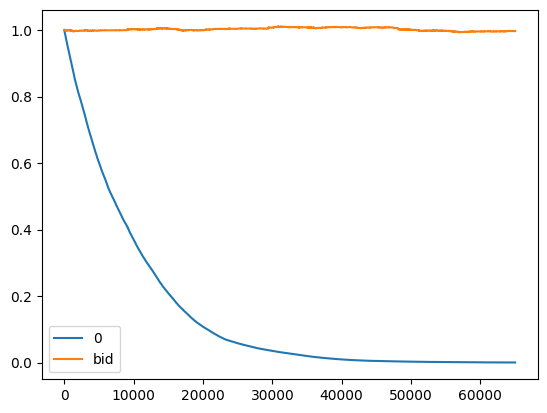

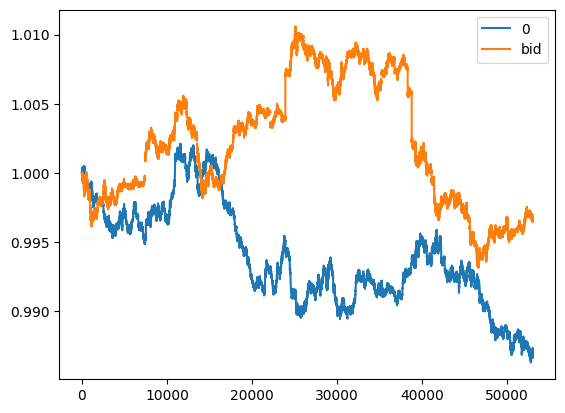

              short  neutral   long
true_short    14832     1803  15342
true_neutral  35372     4232  36611
true_long     14814     1490  15504
                 short   neutral      long
true_short    0.228121  0.239601  0.227434
true_neutral  0.544034  0.562392  0.542731
true_long     0.227845  0.198007  0.229835


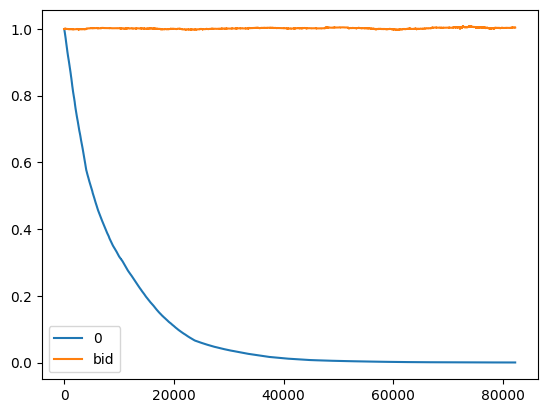

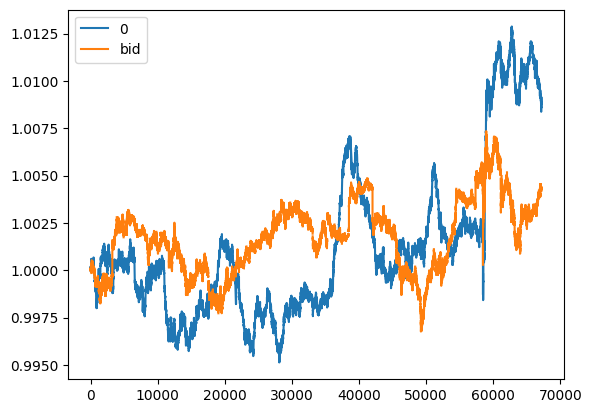


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

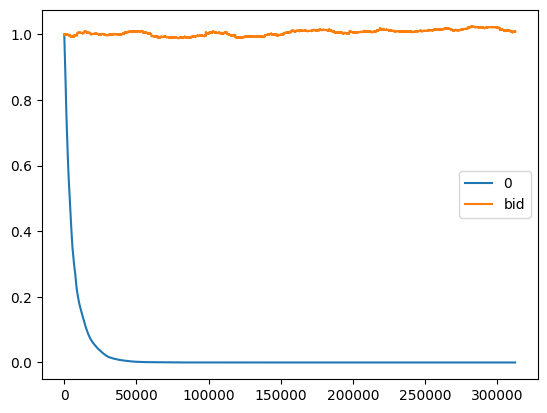

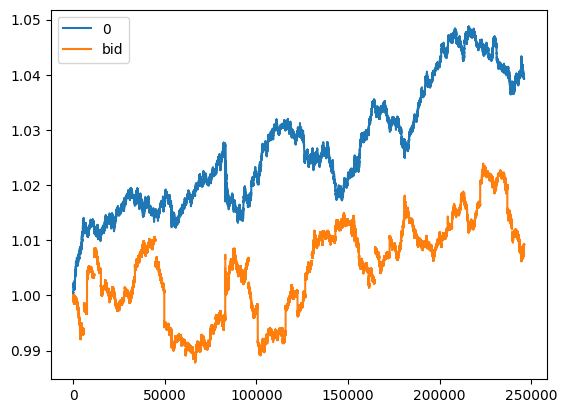

              short  neutral   long
true_short    21958      640   9379
true_neutral  52731     1729  21755
true_long     22245      717   8846
                 short   neutral      long
true_short    0.226525  0.207388  0.234592
true_neutral  0.543989  0.560272  0.544147
true_long     0.229486  0.232340  0.221261


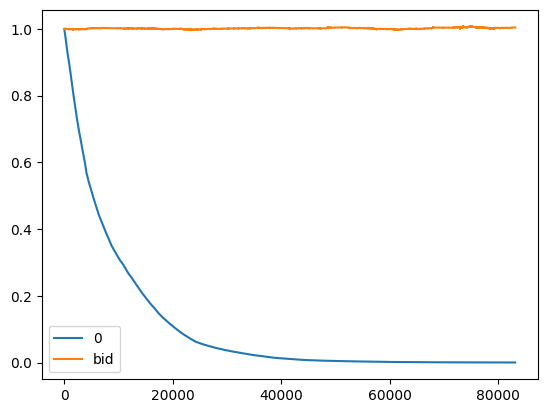

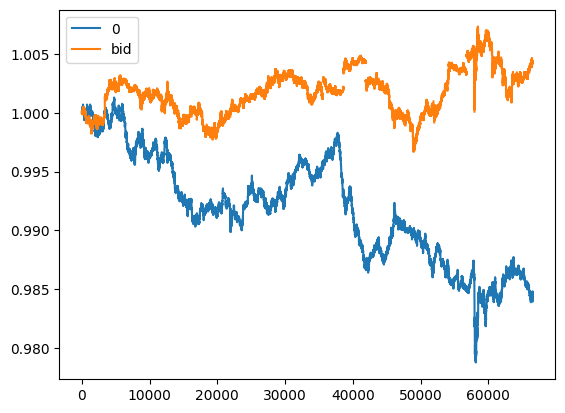

              short  neutral   long
true_short    20093      391  10317
true_neutral  50134      988  25209
true_long     20968      420  11480
                 short   neutral      long
true_short    0.220330  0.217343  0.219483
true_neutral  0.549745  0.549194  0.536293
true_long     0.229925  0.233463  0.244224


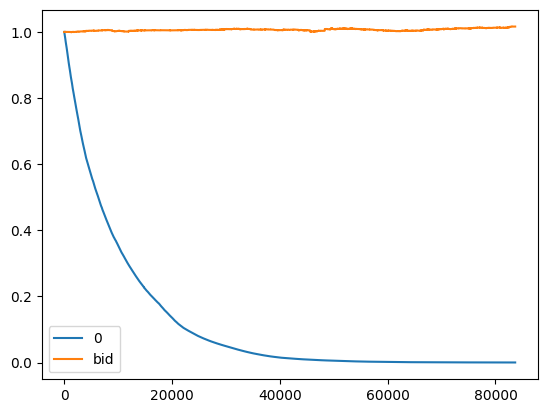

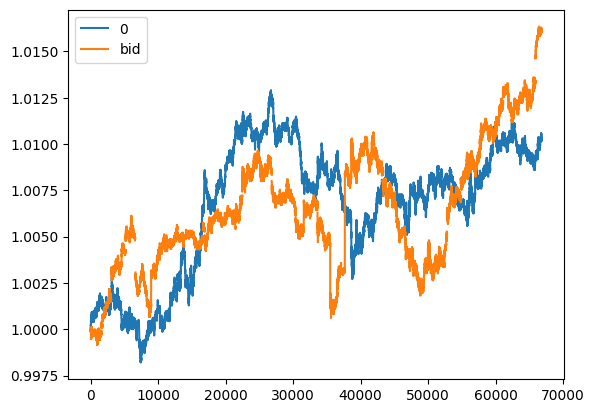


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

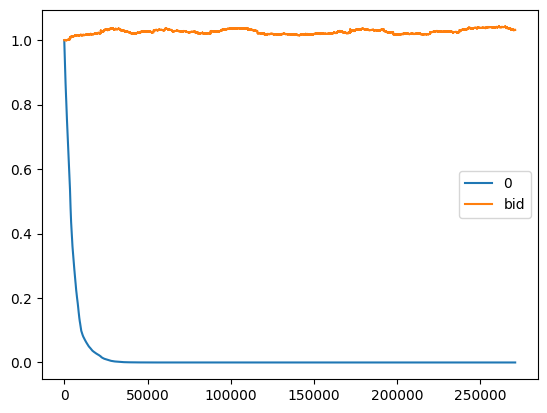

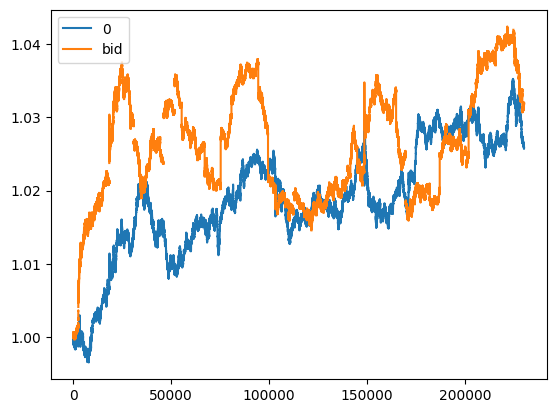

              short  neutral   long
true_short     9405     3143   8378
true_neutral  26372     8579  22427
true_long     10167     3398   8131
                 short   neutral      long
true_short    0.204706  0.207870  0.215174
true_neutral  0.574003  0.567394  0.575997
true_long     0.221291  0.224735  0.208830


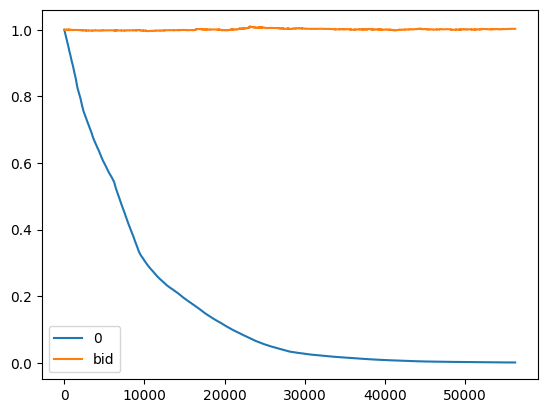

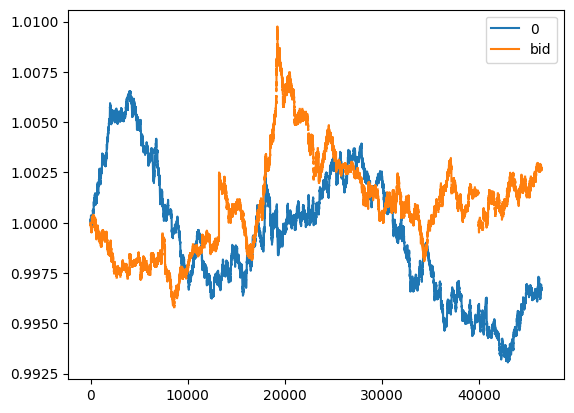

              short  neutral   long
true_short    11534     3527  10237
true_neutral  26119     7653  23538
true_long     12331     3723  11340
                 short   neutral      long
true_short    0.230754  0.236664  0.226909
true_neutral  0.522547  0.513521  0.521733
true_long     0.246699  0.249815  0.251358


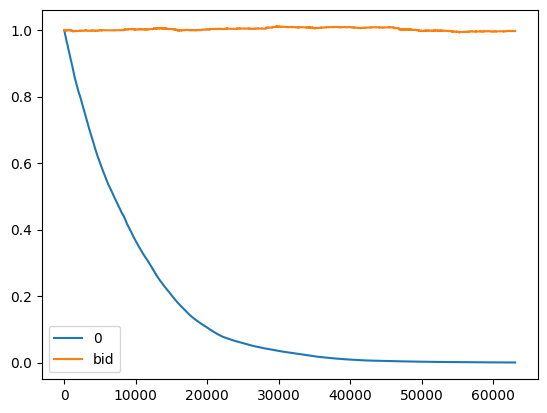

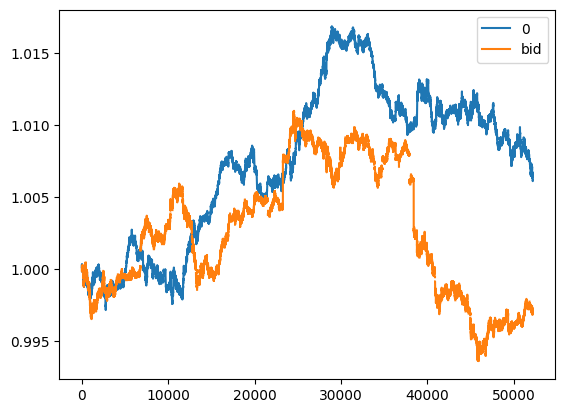


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

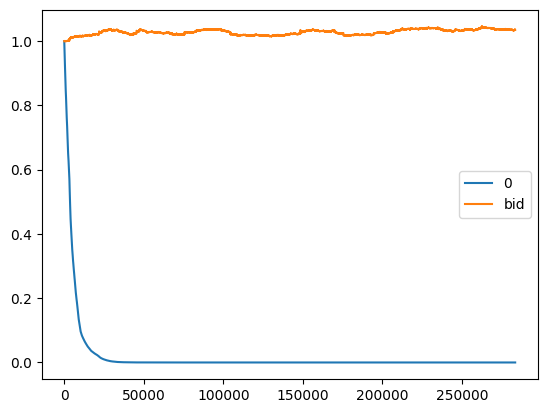

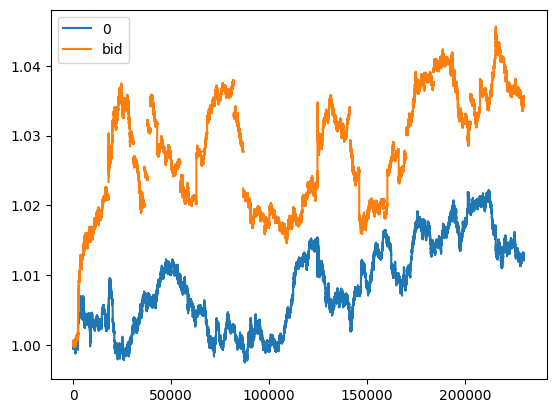

              short  neutral   long
true_short    15827     1607   7864
true_neutral  36578     3615  17117
true_long     17675     1776   7941
                 short   neutral      long
true_short    0.225842  0.229637  0.238868
true_neutral  0.521946  0.516576  0.519926
true_long     0.252212  0.253787  0.241206


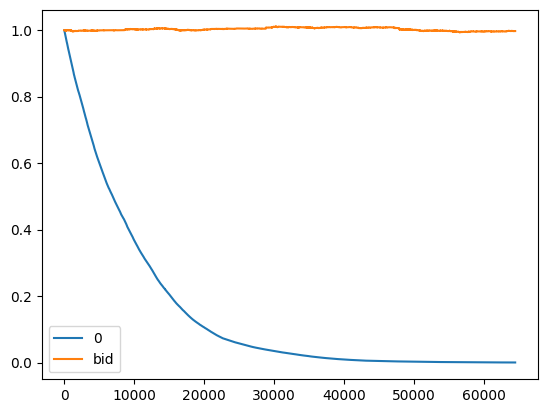

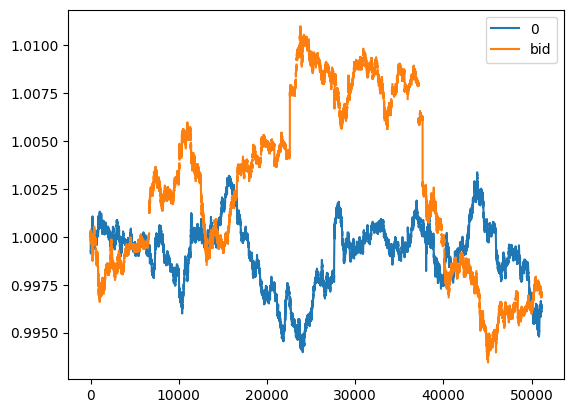

              short  neutral   long
true_short    20110     2231   9640
true_neutral  48426     5177  22612
true_long     20502     2024   9278
                 short   neutral      long
true_short    0.225859  0.236535  0.232121
true_neutral  0.543880  0.548876  0.544474
true_long     0.230261  0.214589  0.223405


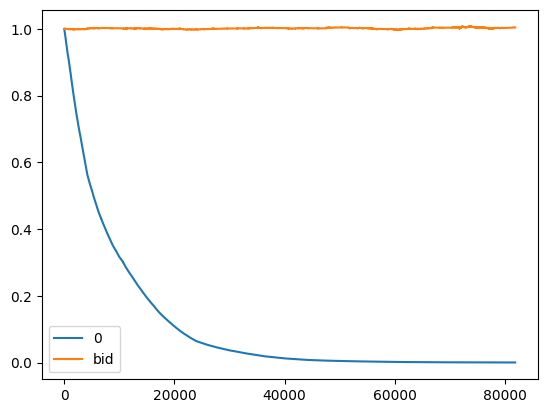

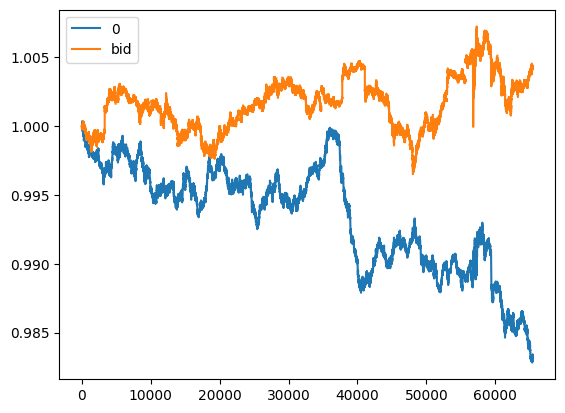


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

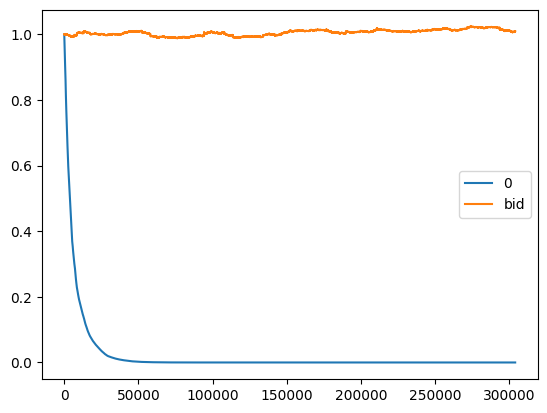

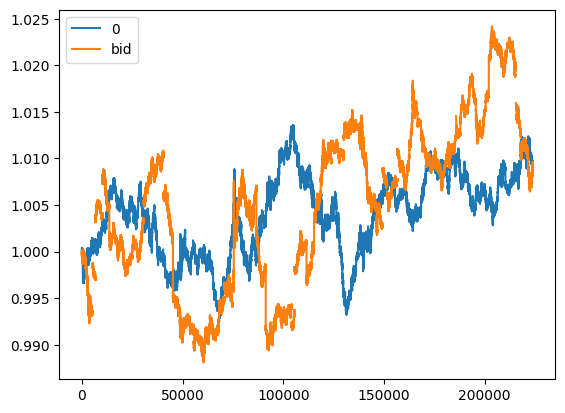

              short  neutral   long
true_short    26657      667   4657
true_neutral  63733     1595  10887
true_long     26802      565   4437
                 short   neutral      long
true_short    0.227464  0.235939  0.233071
true_neutral  0.543834  0.564202  0.544868
true_long     0.228702  0.199859  0.222061


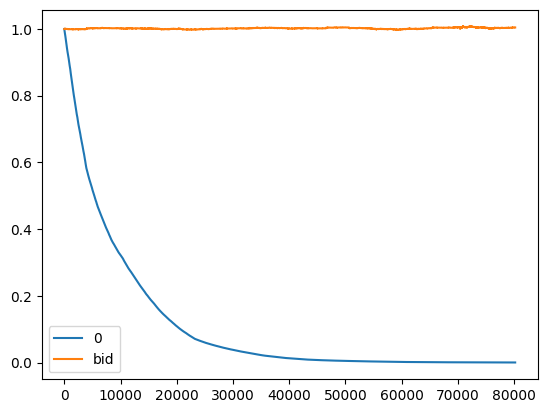

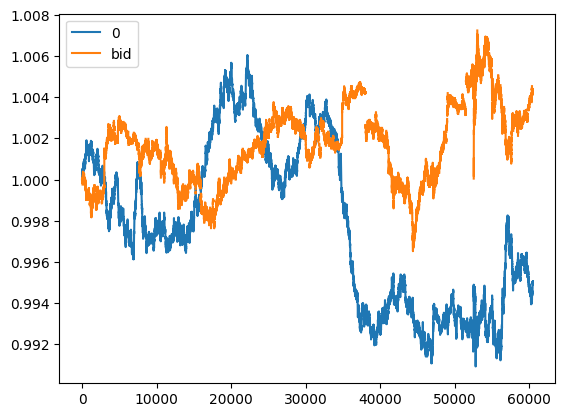

              short  neutral   long
true_short    26044      455   4289
true_neutral  64801     1140  10384
true_long     27790      457   4640
                 short   neutral      long
true_short    0.219530  0.221735  0.222078
true_neutral  0.546222  0.555556  0.537669
true_long     0.234248  0.222710  0.240253


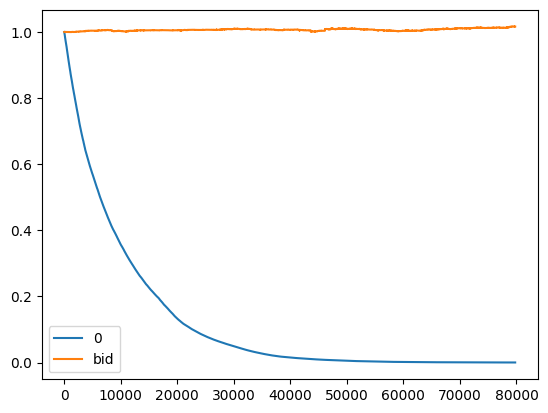

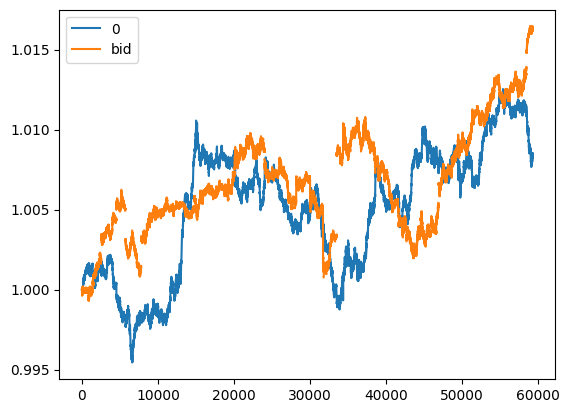


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

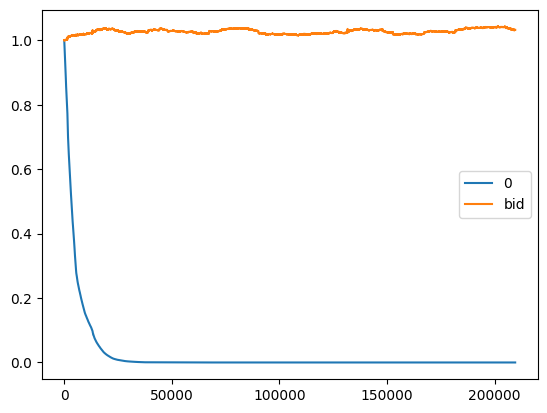

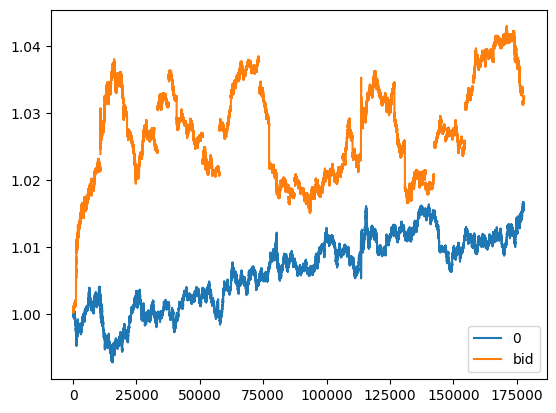

              short  neutral   long
true_short     9426     6238   5215
true_neutral  26422    17488  13451
true_long     10143     6560   5057
                 short   neutral      long
true_short    0.204953  0.205970  0.219829
true_neutral  0.574504  0.577429  0.567002
true_long     0.220543  0.216602  0.213169


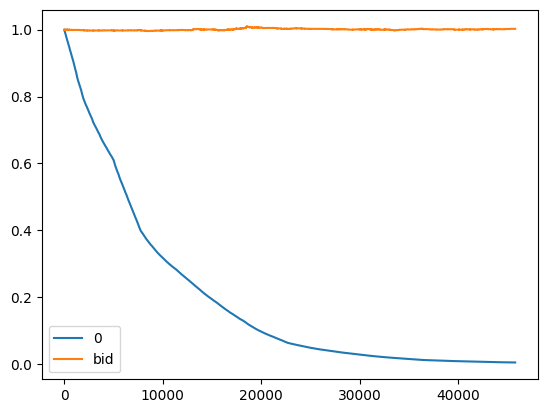

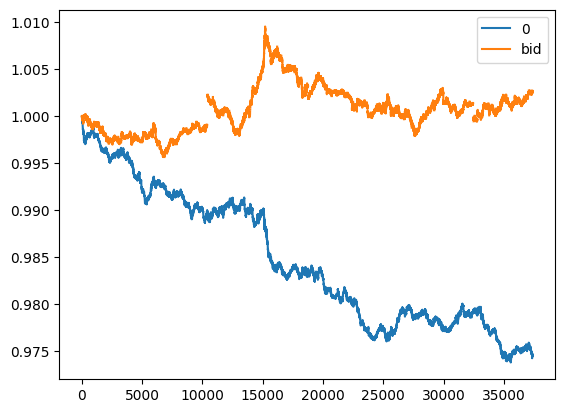

              short  neutral   long
true_short    11226     7946   6203
true_neutral  25533    18132  13510
true_long     12532     8607   6311
                 short   neutral      long
true_short    0.227749  0.229090  0.238357
true_neutral  0.518005  0.522762  0.519136
true_long     0.254245  0.248148  0.242507


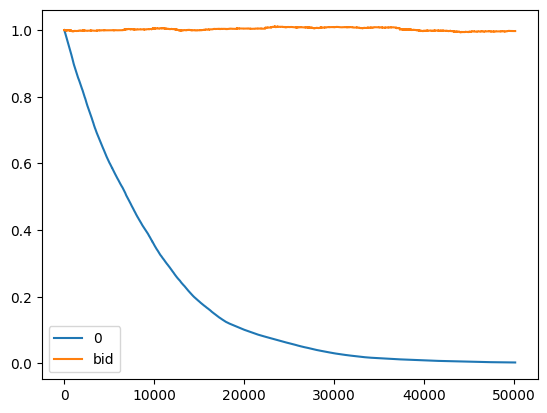

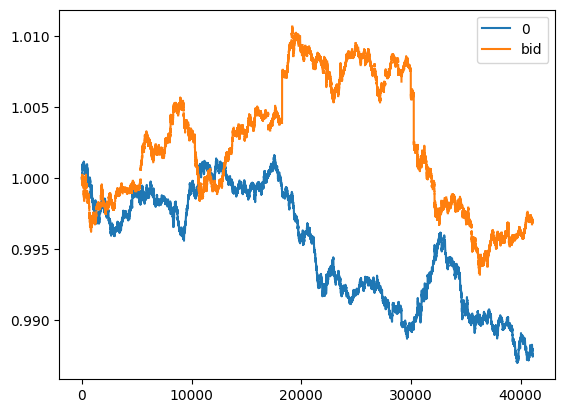


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

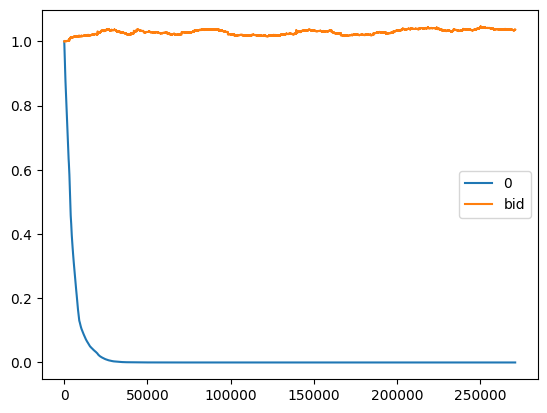

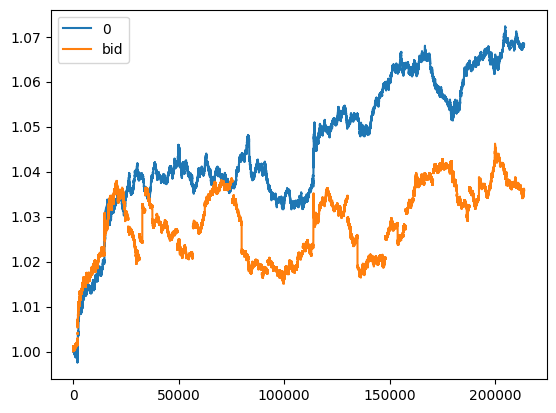

              short  neutral   long
true_short    15651     1947   7777
true_neutral  34200     4541  18434
true_long     16633     2241   8576
                 short  neutral      long
true_short    0.235410  0.22305  0.223561
true_neutral  0.514409  0.52022  0.529911
true_long     0.250180  0.25673  0.246529


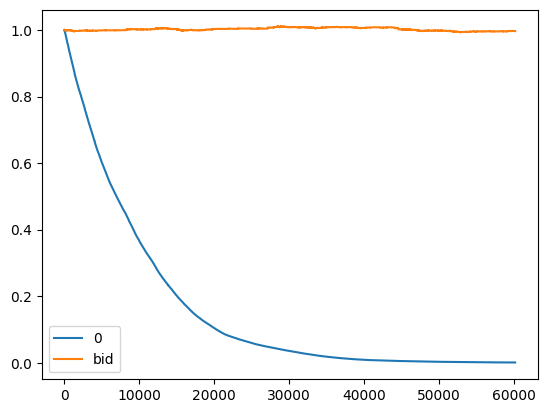

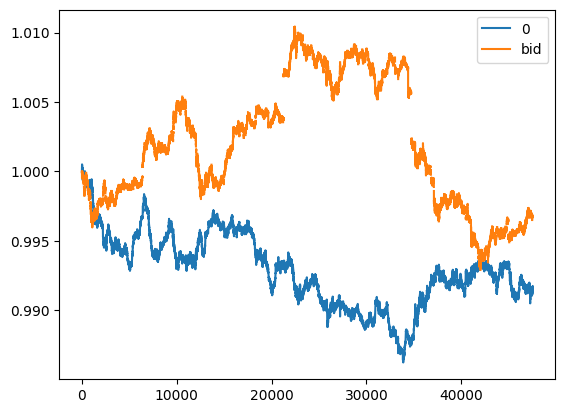

              short  neutral   long
true_short    20453     2728   8817
true_neutral  48746     6074  21406
true_long     20743     2525   8508
                 short   neutral      long
true_short    0.227402  0.240840  0.227647
true_neutral  0.541971  0.536241  0.552684
true_long     0.230626  0.222919  0.219669


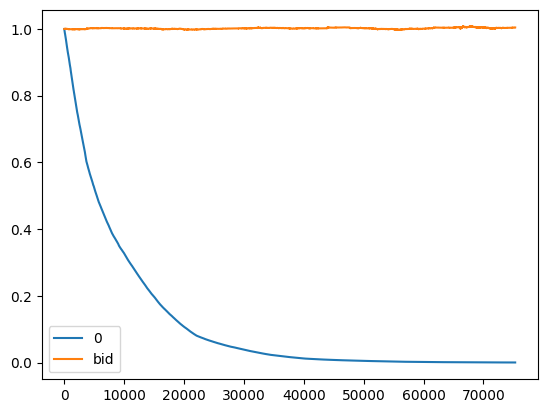

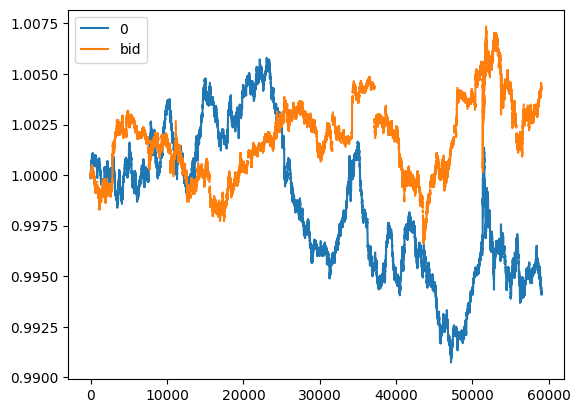


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

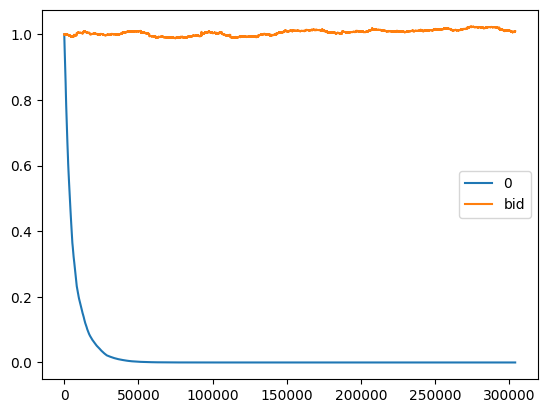

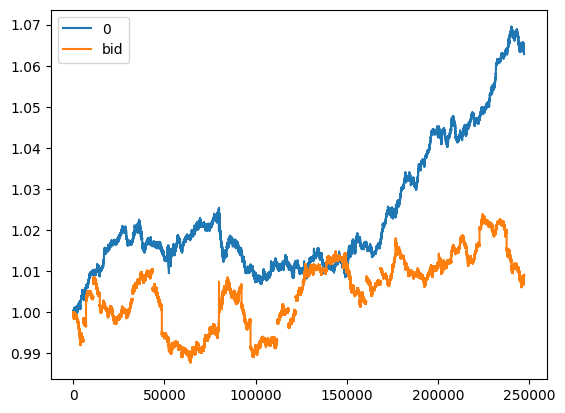

              short  neutral   long
true_short    14831     1435  15732
true_neutral  32166     3358  40702
true_long     13352     1503  16921
                 short   neutral      long
true_short    0.245754  0.227922  0.214464
true_neutral  0.533000  0.533355  0.554863
true_long     0.221246  0.238723  0.230673


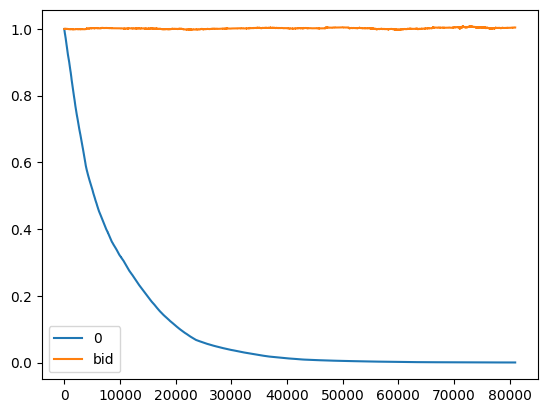

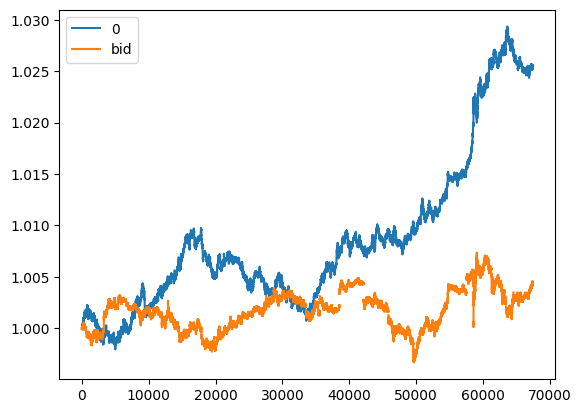

              short  neutral   long
true_short    12661     1041  17162
true_neutral  31290     2727  42268
true_long     13027     1279  18545
                 short   neutral      long
true_short    0.222209  0.206261  0.220096
true_neutral  0.549159  0.540321  0.542071
true_long     0.228632  0.253418  0.237833


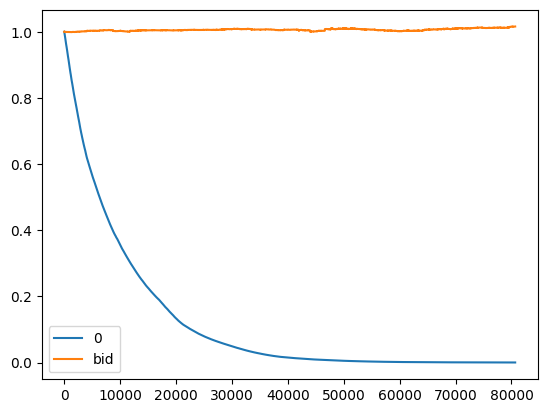

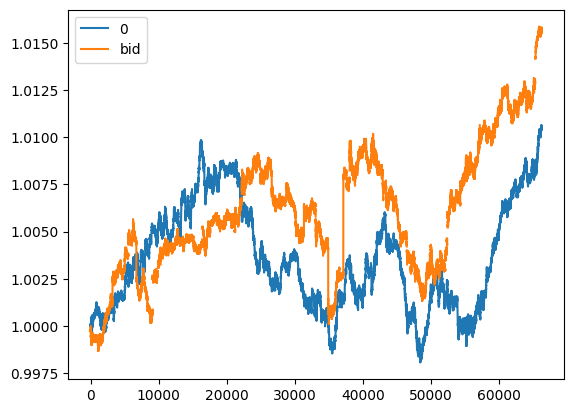


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

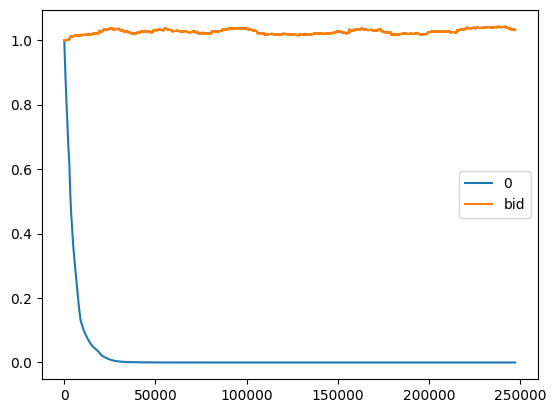

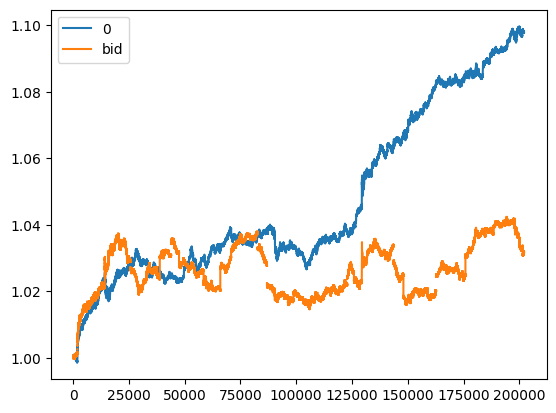

              short  neutral   long
true_short     8404     5029   7512
true_neutral  23765    13674  19891
true_long      9199     5198   7328
                 short  neutral      long
true_short    0.203152  0.21041  0.216291
true_neutral  0.574478  0.57211  0.572716
true_long     0.222370  0.21748  0.210993


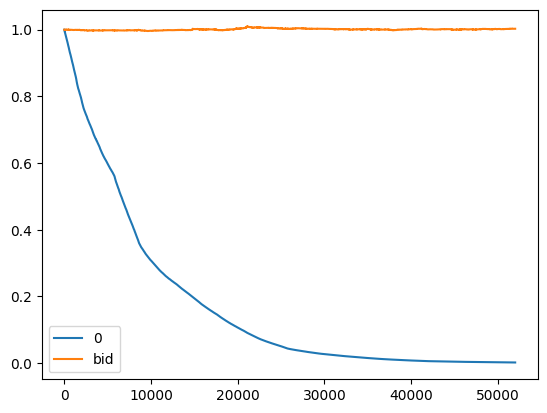

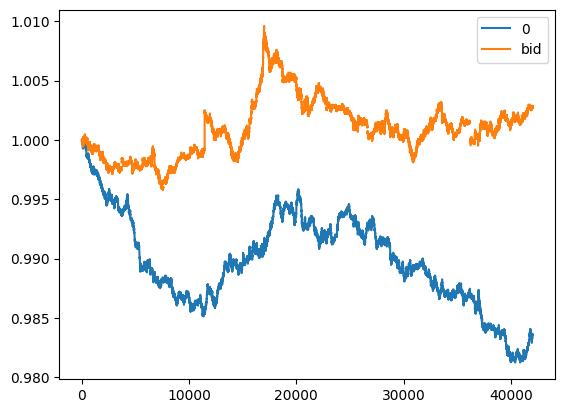

              short  neutral   long
true_short    10639     5621   9124
true_neutral  23182    13226  20799
true_long     10960     6395  10054
                 short   neutral      long
true_short    0.237578  0.222684  0.228231
true_neutral  0.517675  0.523968  0.520274
true_long     0.244747  0.253348  0.251495


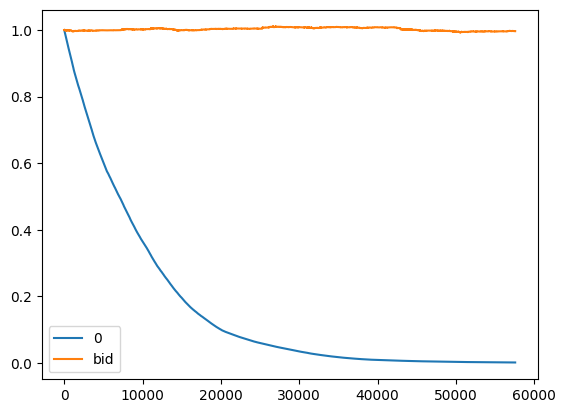

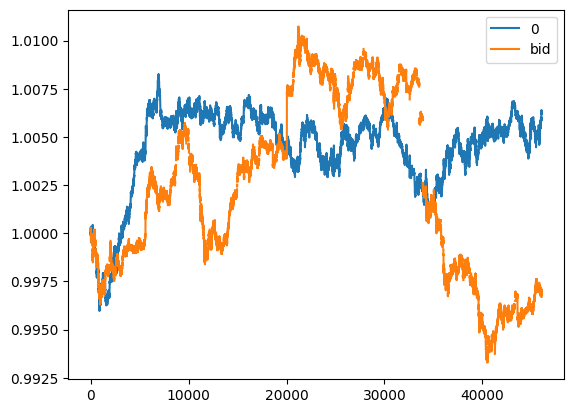


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

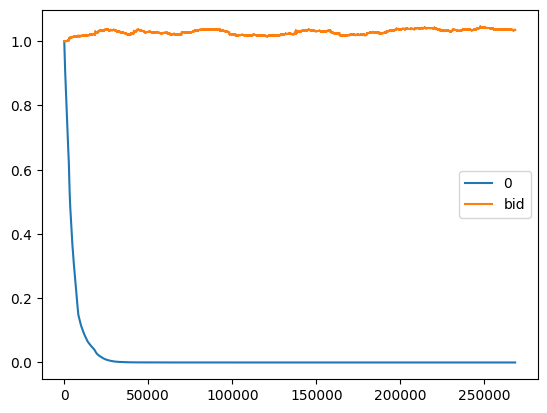

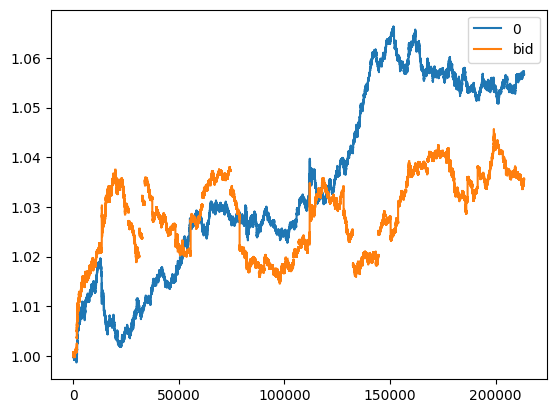

              short  neutral   long
true_short    14702     2505   8177
true_neutral  31912     6399  18896
true_long     15753     2845   8811
                 short   neutral      long
true_short    0.235734  0.213210  0.227873
true_neutral  0.511681  0.544642  0.526586
true_long     0.252586  0.242148  0.245541


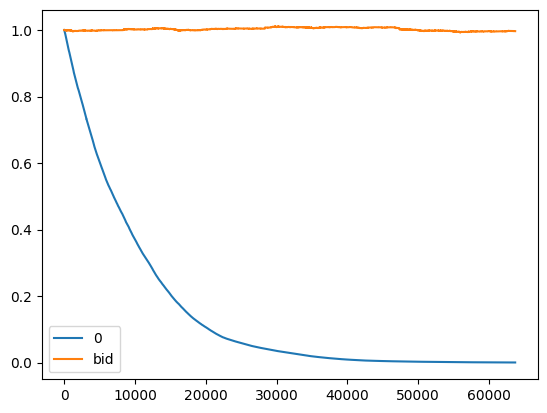

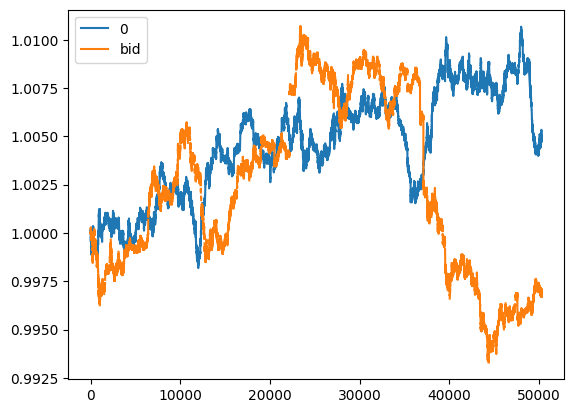

              short  neutral   long
true_short    18962     3425   9610
true_neutral  44731     8402  23080
true_long     18970     3601   9220
                 short   neutral      long
true_short    0.229389  0.221999  0.229301
true_neutral  0.541125  0.544594  0.550704
true_long     0.229486  0.233407  0.219995


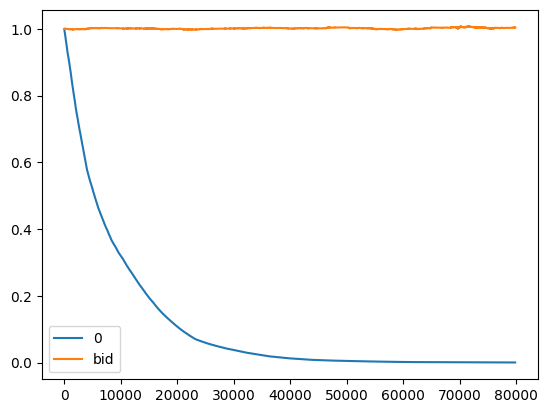

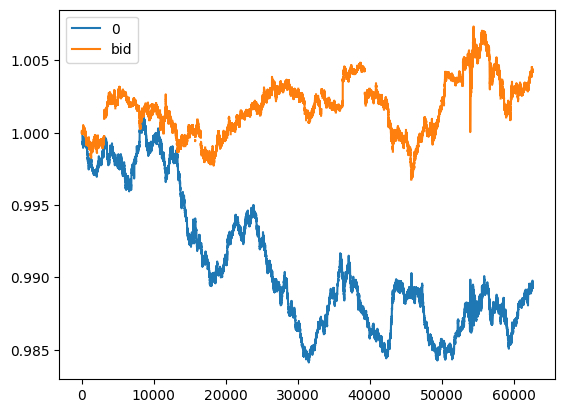


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

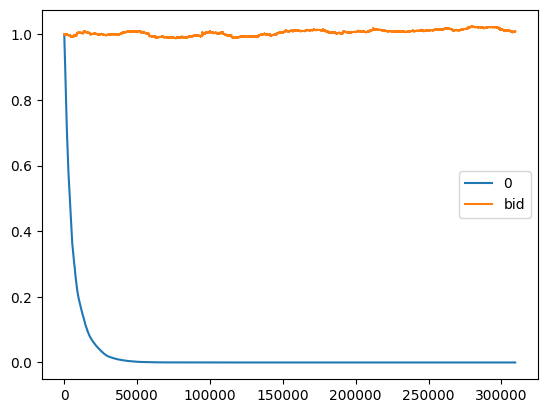

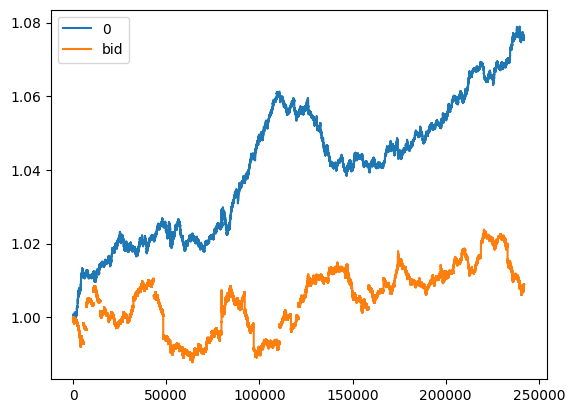

              short  neutral   long
true_short    23053     1392   7551
true_neutral  52886     3704  19623
true_long     22626     1394   7771
                 short   neutral      long
true_short    0.233886  0.214484  0.216082
true_neutral  0.536560  0.570724  0.561540
true_long     0.229554  0.214792  0.222378


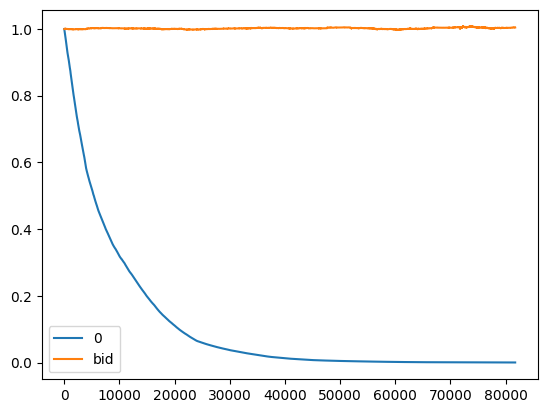

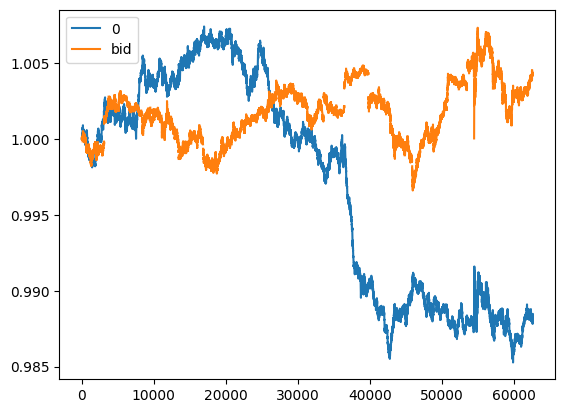

              short  neutral   long
true_short    22894      947   6942
true_neutral  55657     2768  17915
true_long     24415     1050   7412
                 short   neutral      long
true_short    0.222345  0.198741  0.215129
true_neutral  0.540538  0.580902  0.555177
true_long     0.237117  0.220357  0.229694


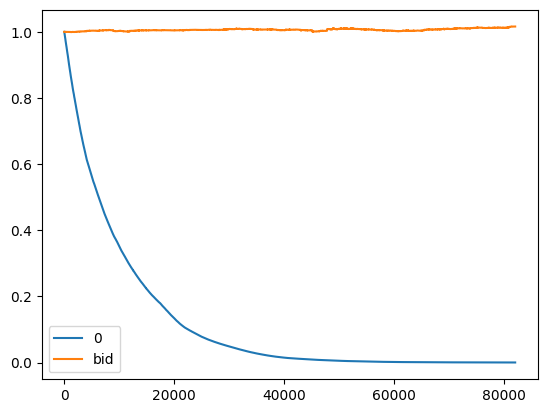

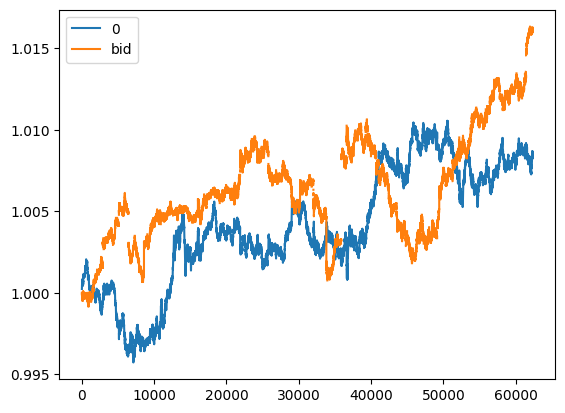


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

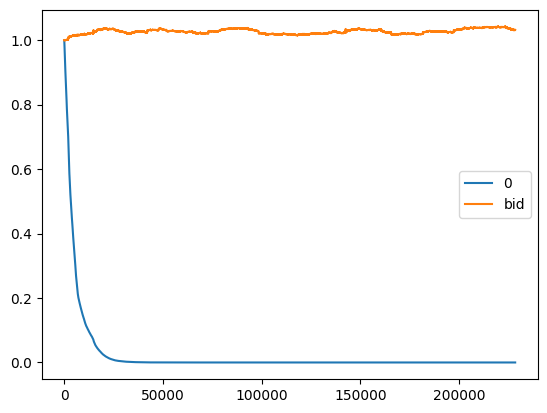

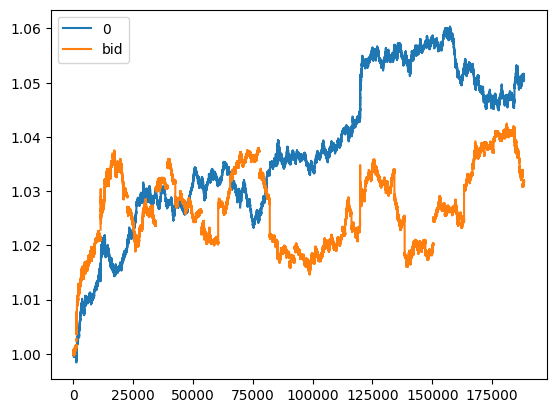

              short  neutral   long
true_short    11888     3842   5265
true_neutral  32791    10709  13810
true_long     12703     3918   5075
                 short   neutral      long
true_short    0.207173  0.208024  0.218012
true_neutral  0.571451  0.579836  0.571843
true_long     0.221376  0.212139  0.210145


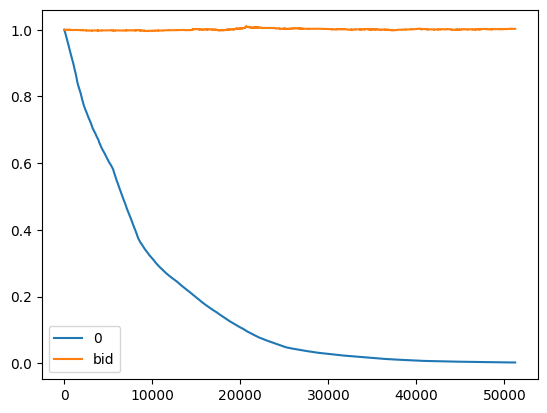

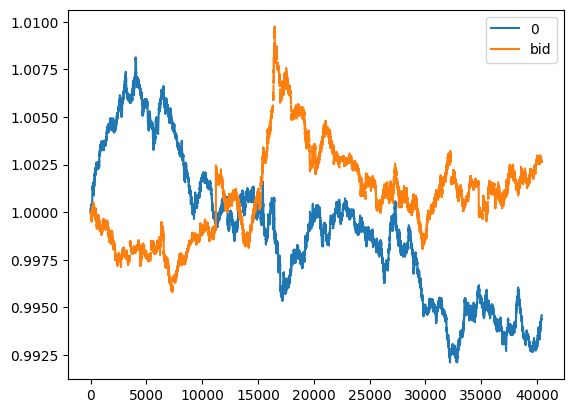

              short  neutral   long
true_short    15640     4175   5543
true_neutral  33691     9679  13876
true_long     16078     4807   6511
                 short   neutral      long
true_short    0.239111  0.223729  0.213768
true_neutral  0.515082  0.518675  0.535133
true_long     0.245807  0.257596  0.251099


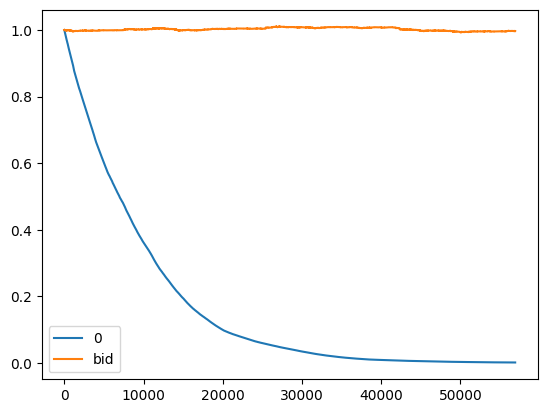

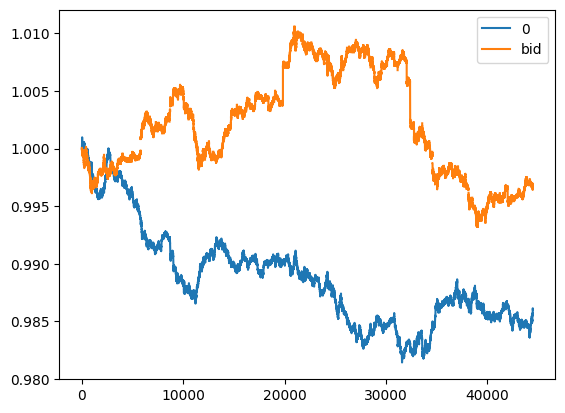


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

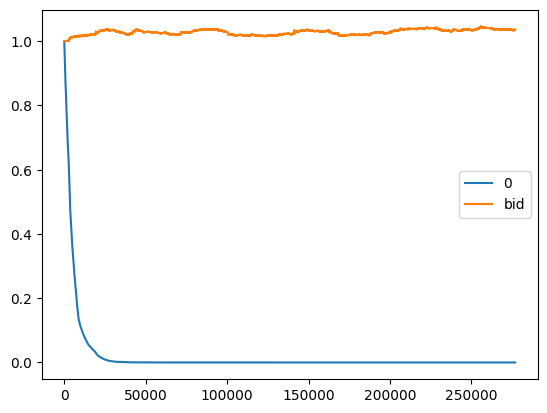

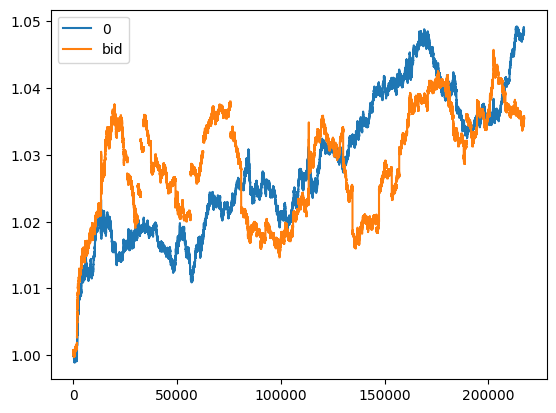

              short  neutral   long
true_short     8699     1735  14925
true_neutral  19075     3651  34520
true_long      9936     1767  15693
                 short   neutral      long
true_short    0.230682  0.242556  0.229129
true_neutral  0.505834  0.510415  0.529952
true_long     0.263484  0.247029  0.240919


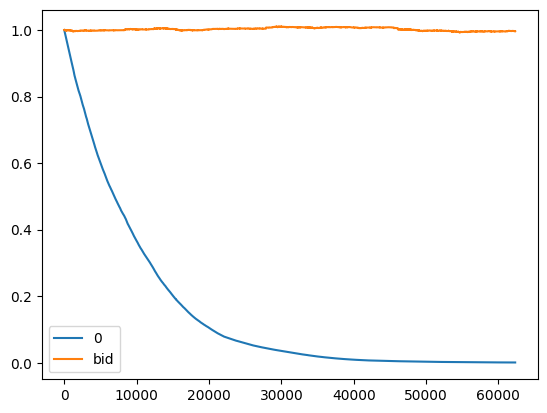

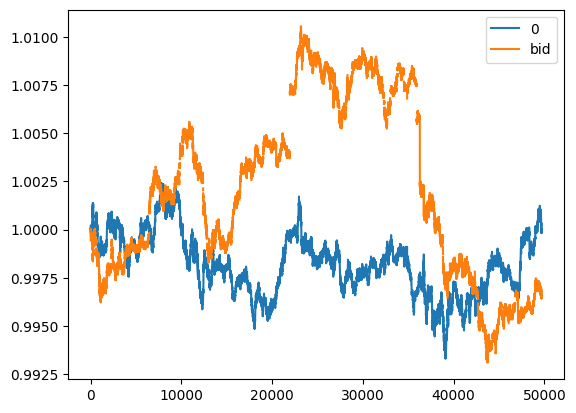

              short  neutral   long
true_short    10819     2214  18944
true_neutral  27580     4863  43772
true_long     11763     2257  17788
                 short   neutral      long
true_short    0.215681  0.237197  0.235317
true_neutral  0.549819  0.520999  0.543725
true_long     0.234500  0.241804  0.220958


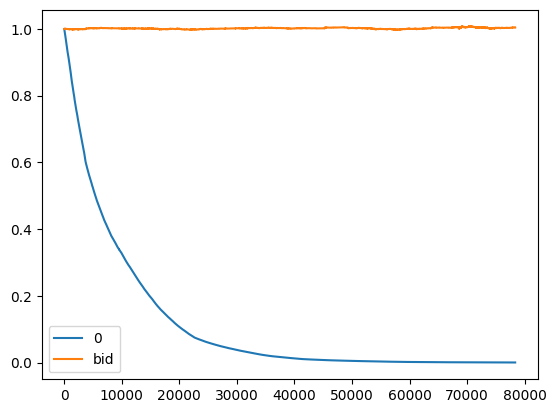

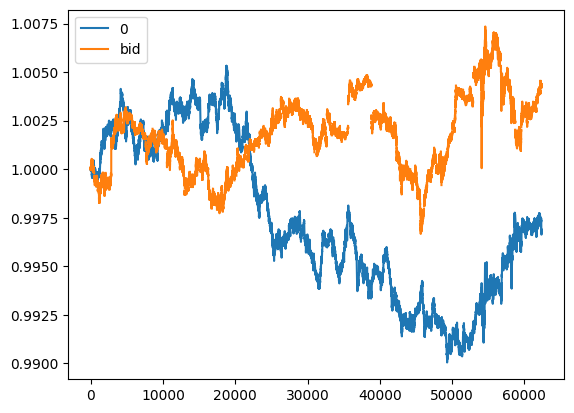


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

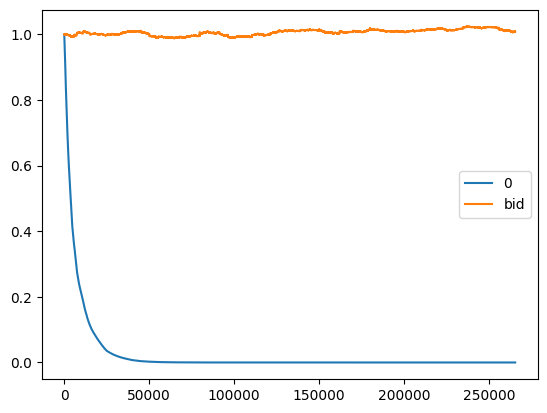

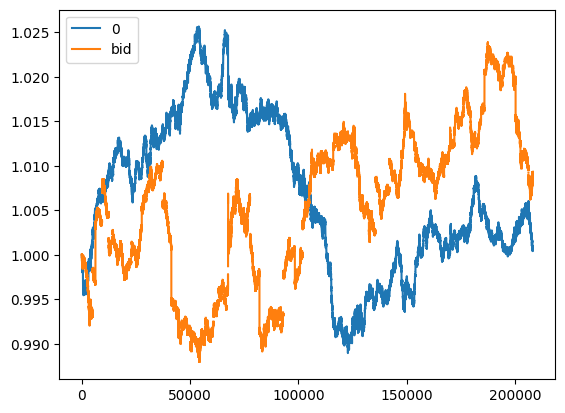

              short  neutral   long
true_short    22485     2758   6734
true_neutral  53196     6890  16129
true_long     22375     2851   6582
                 short   neutral      long
true_short    0.229308  0.220658  0.228698
true_neutral  0.542506  0.551244  0.547767
true_long     0.228186  0.228098  0.223535


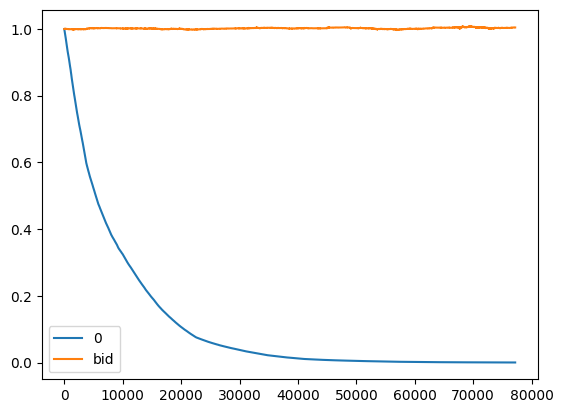

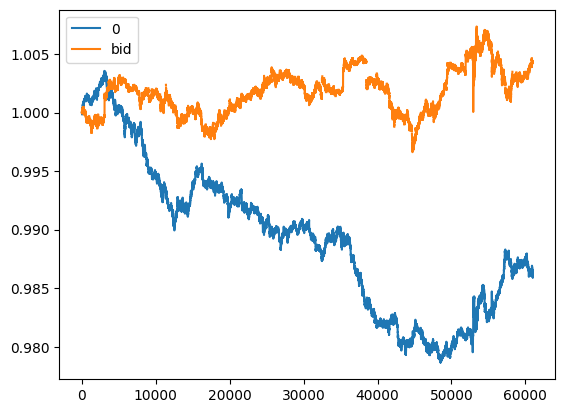

              short  neutral   long
true_short    20887     1487   8427
true_neutral  52756     3485  20091
true_long     22939     1751   8178
                 short   neutral      long
true_short    0.216262  0.221181  0.229644
true_neutral  0.546230  0.518370  0.547498
true_long     0.237508  0.260449  0.222858


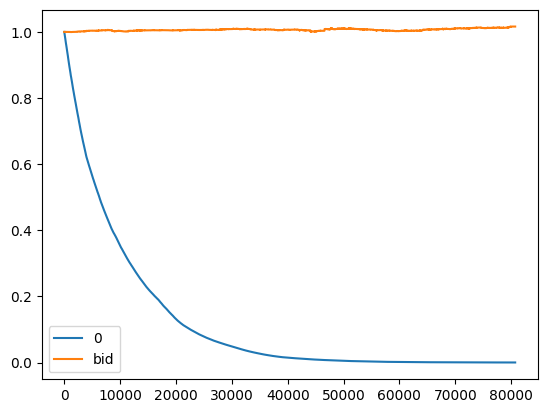

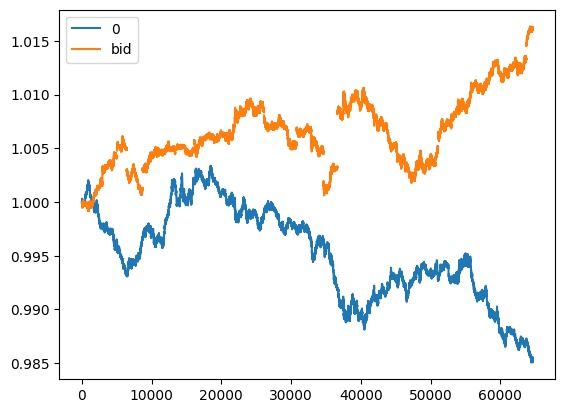


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

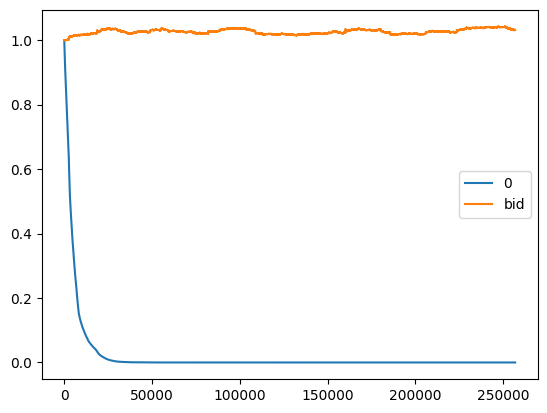

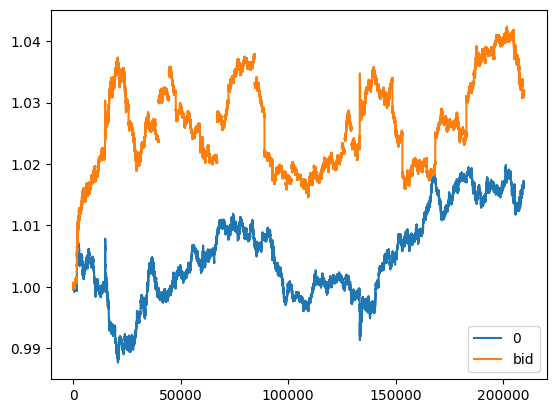

              short  neutral   long
true_short    11058     2533   7335
true_neutral  31885     7039  18454
true_long     11959     2756   6981
                 short   neutral      long
true_short    0.201413  0.205467  0.223833
true_neutral  0.580762  0.570977  0.563137
true_long     0.217824  0.223556  0.213030


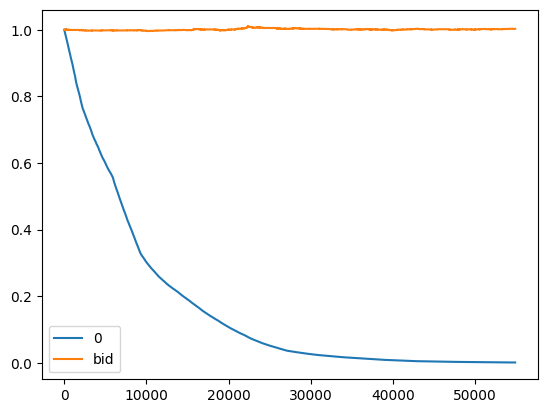

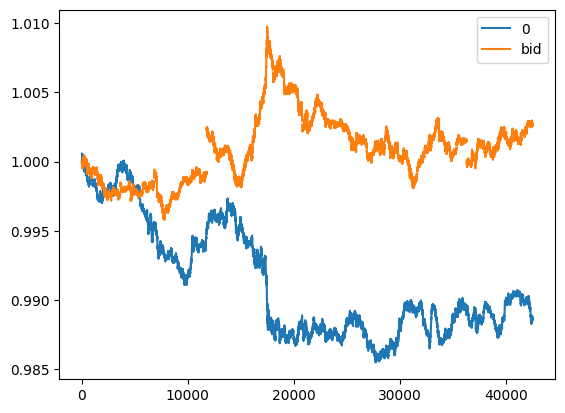

              short  neutral   long
true_short    14439     2793   8066
true_neutral  33021     6294  17995
true_long     15258     3299   8835
                 short   neutral      long
true_short    0.230221  0.225497  0.231144
true_neutral  0.526500  0.508154  0.515675
true_long     0.243279  0.266349  0.253181


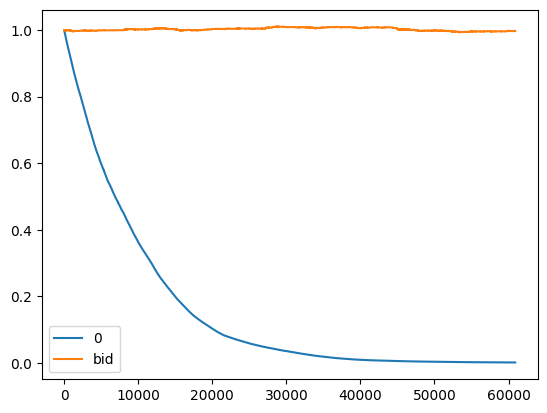

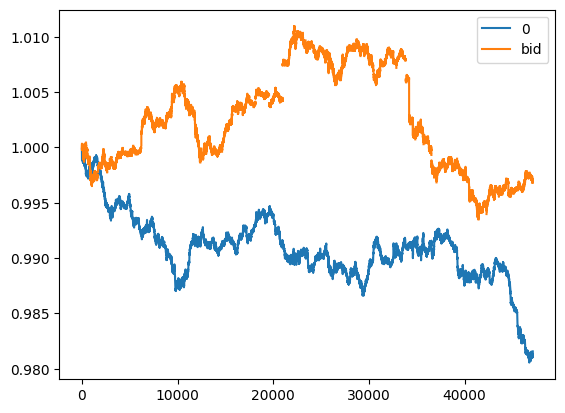


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

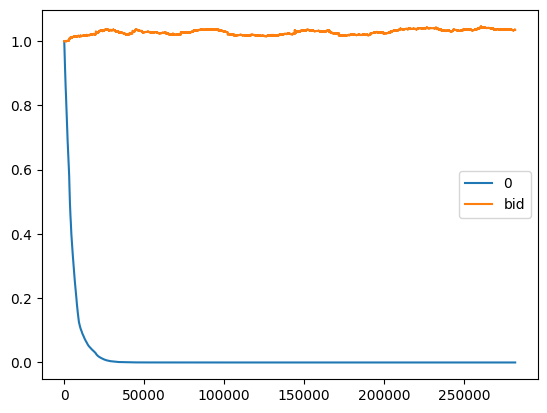

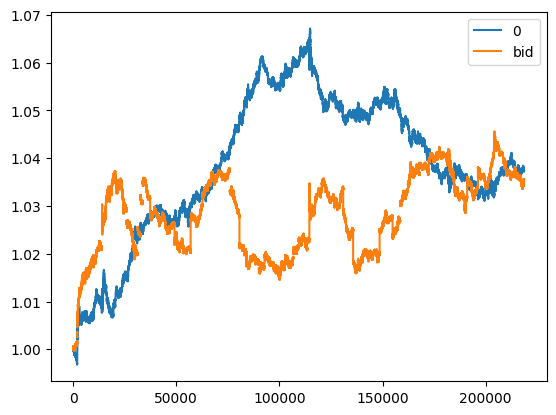

              short  neutral   long
true_short    15751     1444   8103
true_neutral  35504     3176  18630
true_long     17331     1447   8614
                 short   neutral      long
true_short    0.229653  0.238009  0.229242
true_neutral  0.517657  0.523488  0.527060
true_long     0.252690  0.238503  0.243698


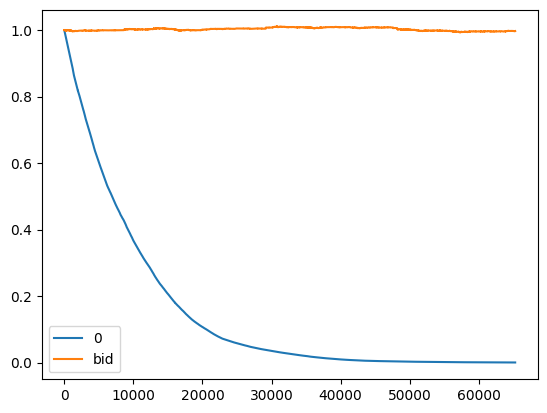

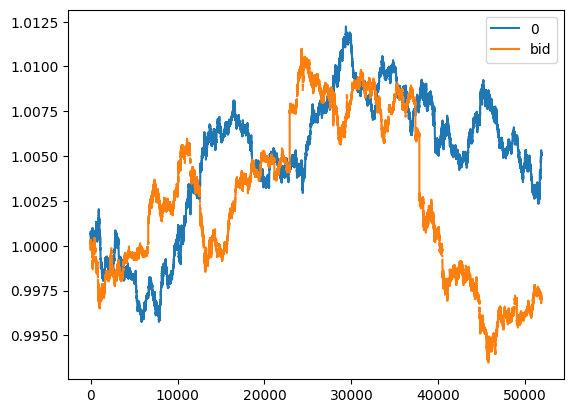

              short  neutral   long
true_short    20530     1438  10013
true_neutral  48225     3610  24380
true_long     20492     1455   9857
                 short   neutral      long
true_short    0.230036  0.221129  0.226282
true_neutral  0.540354  0.555128  0.550960
true_long     0.229610  0.223743  0.222757


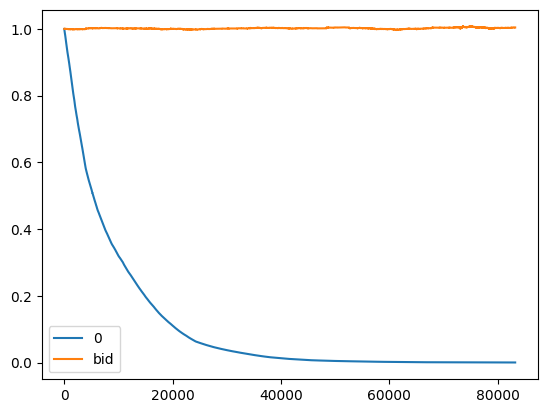

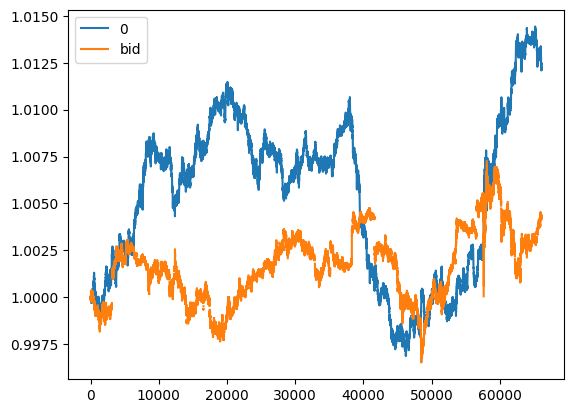


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

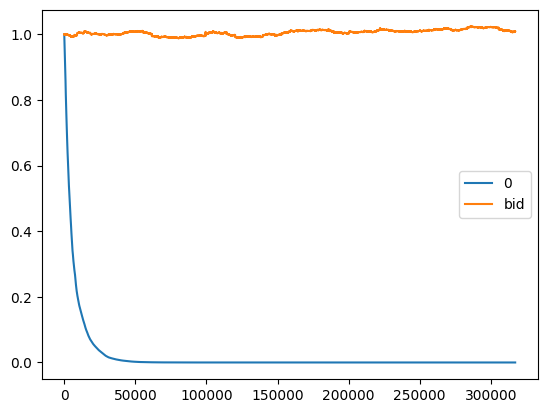

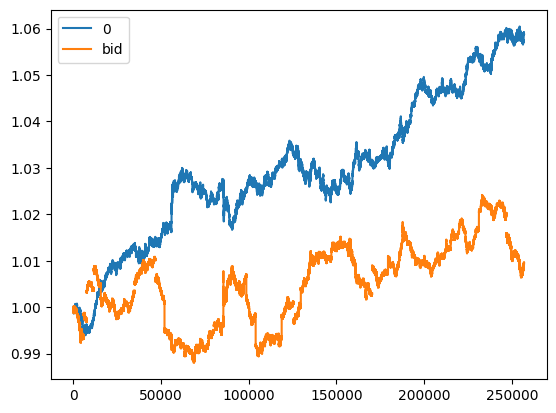

              short  neutral   long
true_short    18069      639  13273
true_neutral  41738     1361  33116
true_long     17620      564  13620
                 short   neutral      long
true_short    0.233368  0.249220  0.221183
true_neutral  0.539063  0.530811  0.551851
true_long     0.227569  0.219969  0.226966


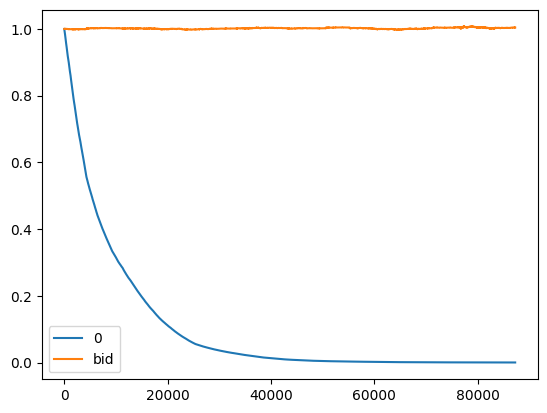

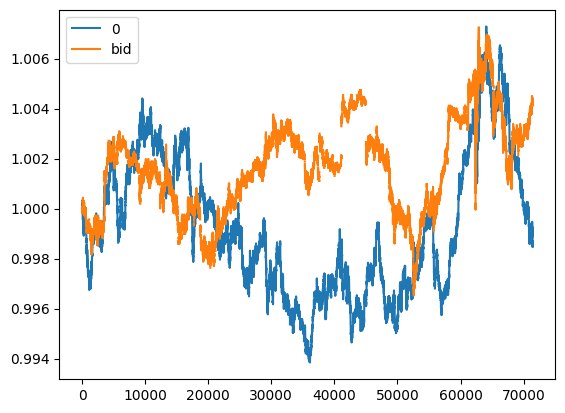

              short  neutral   long
true_short    18032      427  12329
true_neutral  43587     1011  31727
true_long     19050      500  13337
                 short   neutral      long
true_short    0.223531  0.220330  0.214817
true_neutral  0.540319  0.521672  0.552803
true_long     0.236150  0.257998  0.232380


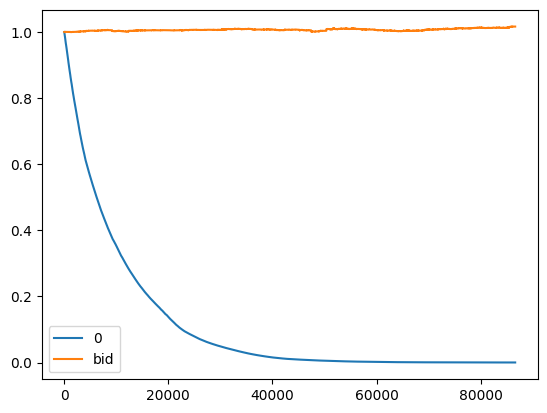

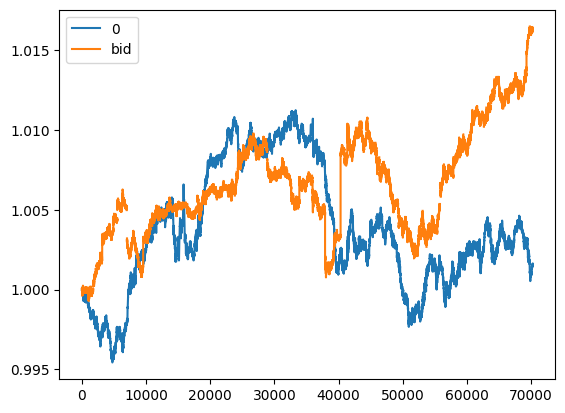

copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regula

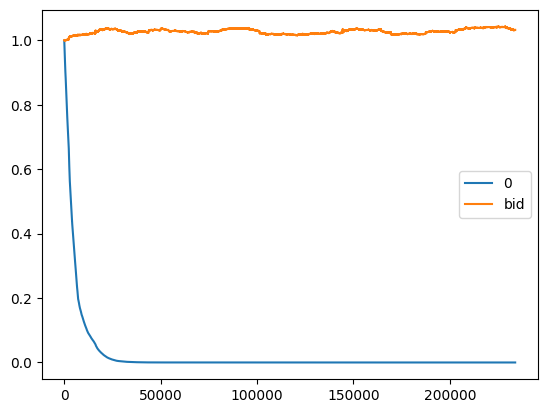

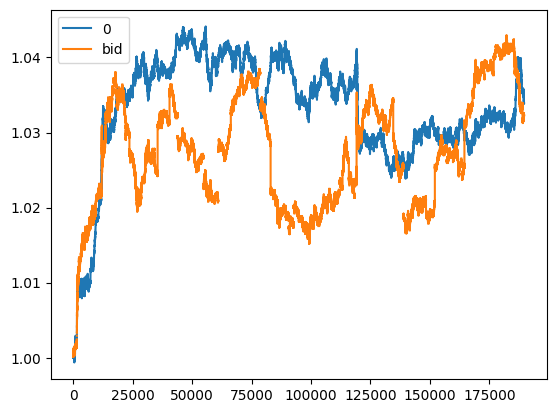

              short  neutral   long
true_short     9722     2878   8279
true_neutral  26229     8208  22924
true_long      9820     3022   8918
                 short   neutral      long
true_short    0.212405  0.203998  0.206351
true_neutral  0.573048  0.581798  0.571372
true_long     0.214546  0.214205  0.222278


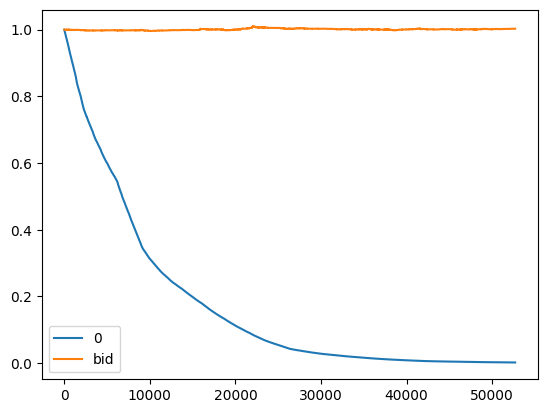

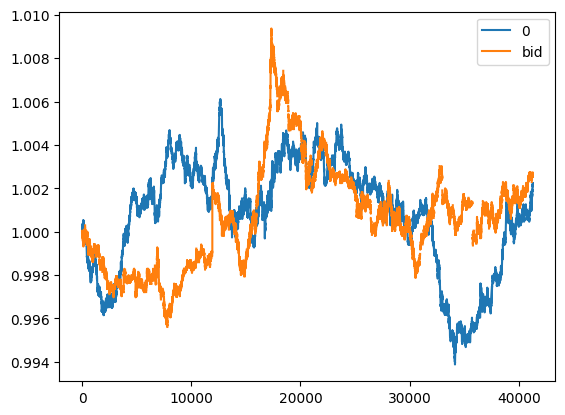

              short  neutral   long
true_short     9627     4033  11715
true_neutral  21905     8652  26619
true_long      9579     4333  13538
                 short   neutral      long
true_short    0.234171  0.236984  0.225844
true_neutral  0.532826  0.508403  0.513167
true_long     0.233003  0.254613  0.260989


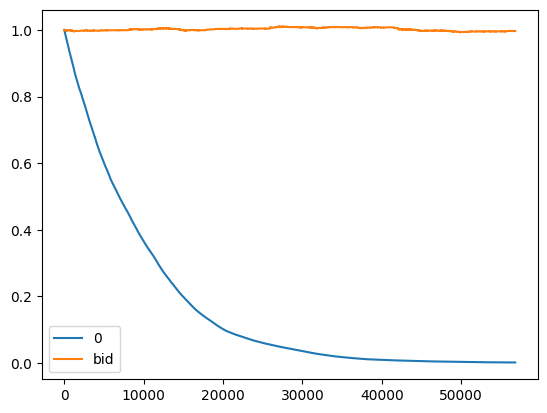

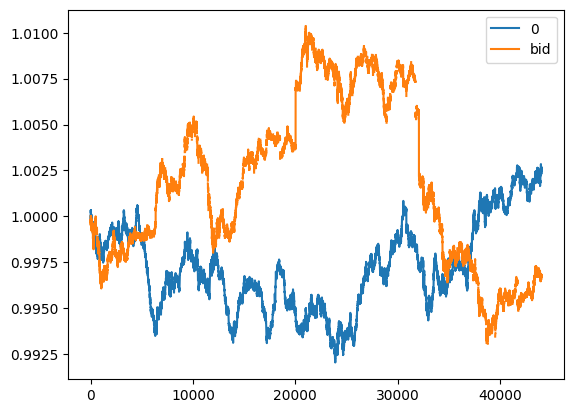


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

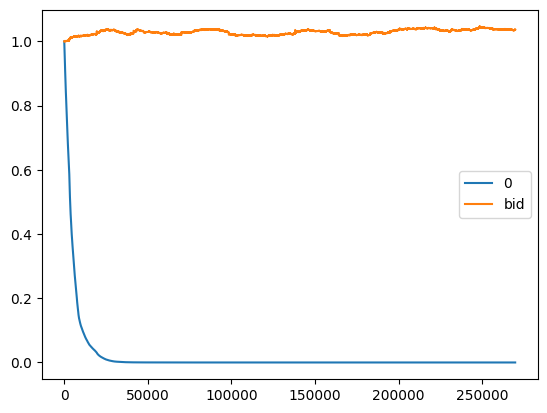

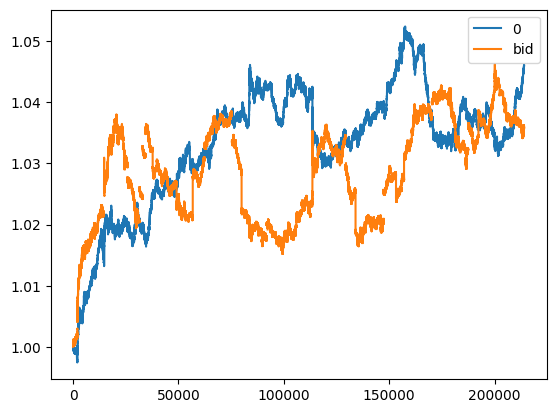

              short  neutral   long
true_short    16451      998   7926
true_neutral  36206     2397  18572
true_long     17304      990   9156
                 short   neutral      long
true_short    0.235145  0.227594  0.222303
true_neutral  0.517517  0.546636  0.520895
true_long     0.247338  0.225770  0.256801


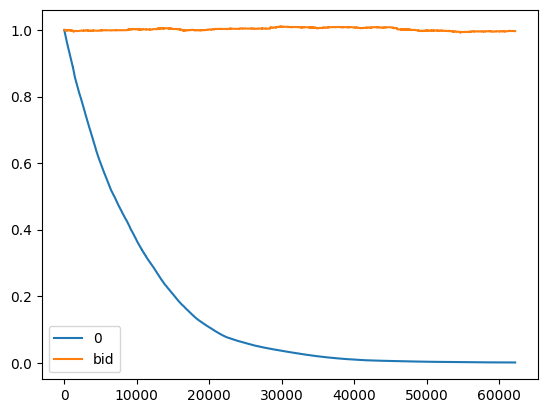

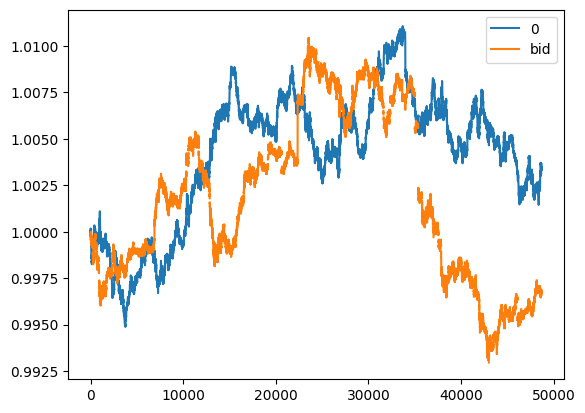

              short  neutral   long
true_short    20838      987  10174
true_neutral  49188     2688  24350
true_long     20728     1023  10025
                 short   neutral      long
true_short    0.229610  0.210089  0.228378
true_neutral  0.541993  0.572158  0.546589
true_long     0.228398  0.217752  0.225033


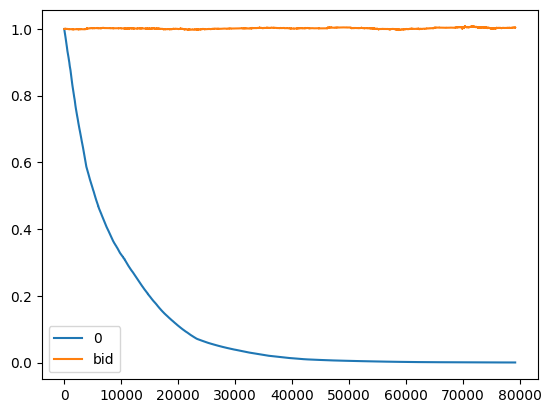

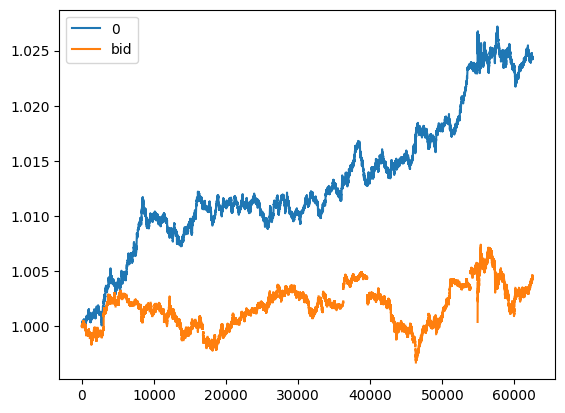


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

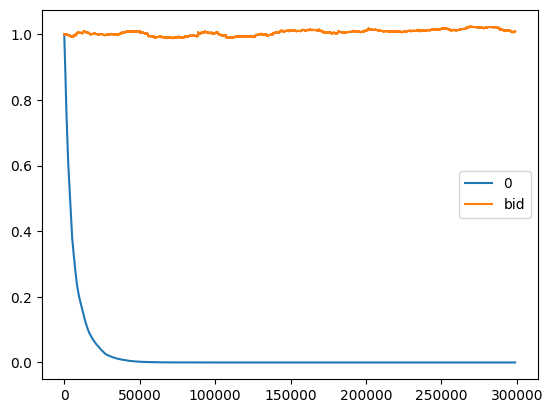

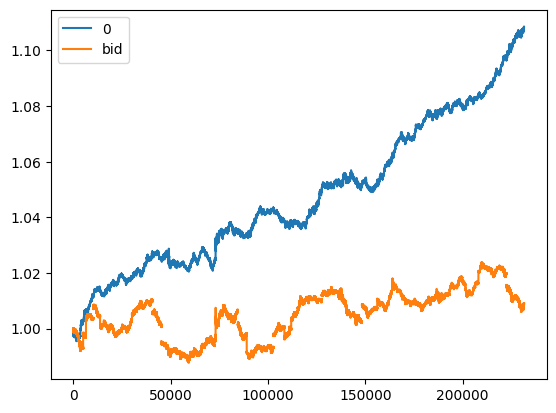

              short  neutral   long
true_short    16892      677  14429
true_neutral  40822     1711  33693
true_long     16984      843  13949
                 short   neutral      long
true_short    0.226137  0.209533  0.232460
true_neutral  0.546494  0.529557  0.542814
true_long     0.227369  0.260910  0.224727


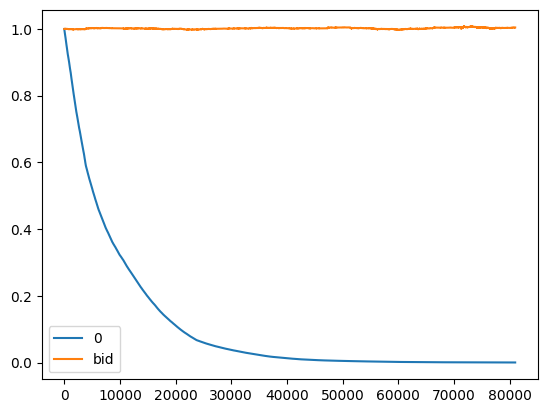

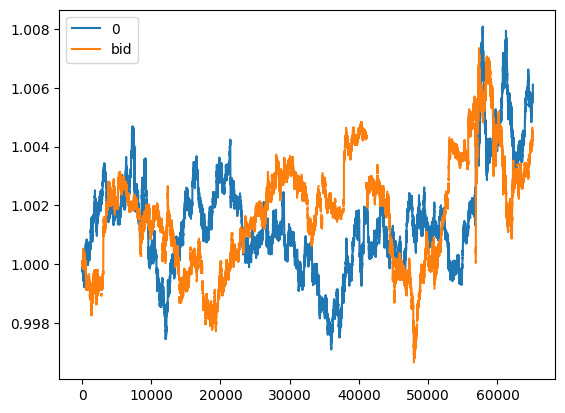

              short  neutral   long
true_short    19204      392  11268
true_neutral  46751     1092  28442
true_long     20136      388  12327
                 short   neutral      long
true_short    0.223066  0.209402  0.216538
true_neutral  0.543042  0.583333  0.546573
true_long     0.233892  0.207265  0.236889


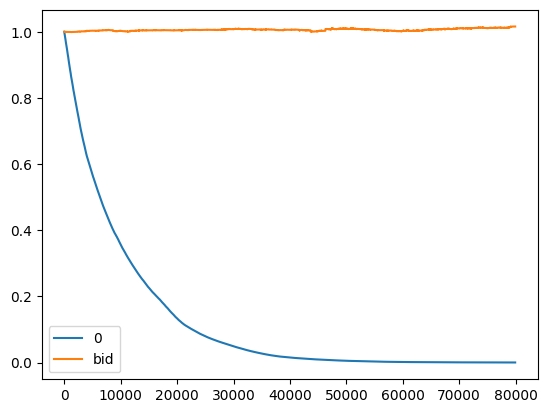

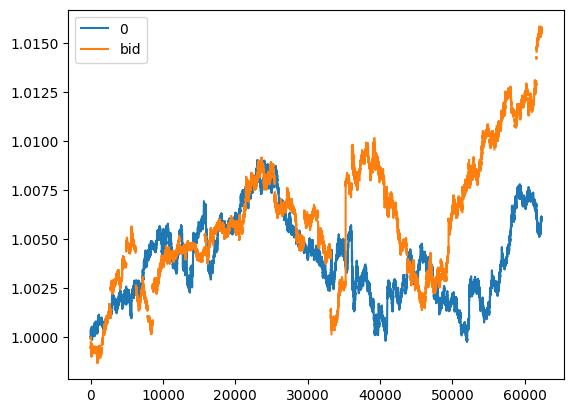


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

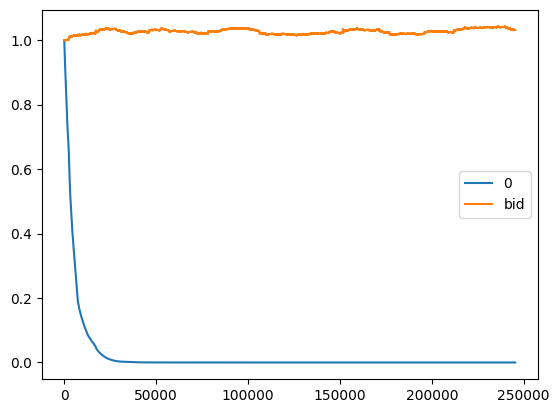

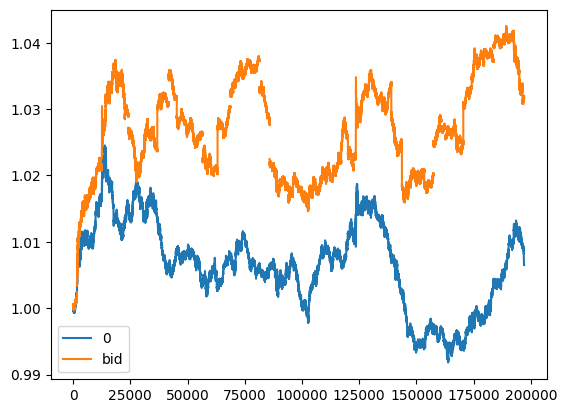

              short  neutral   long
true_short    11297     2123   7525
true_neutral  29810     6495  21025
true_long     11173     2573   7979
                 short   neutral      long
true_short    0.216086  0.189706  0.206001
true_neutral  0.570199  0.580377  0.575570
true_long     0.213715  0.229917  0.218429


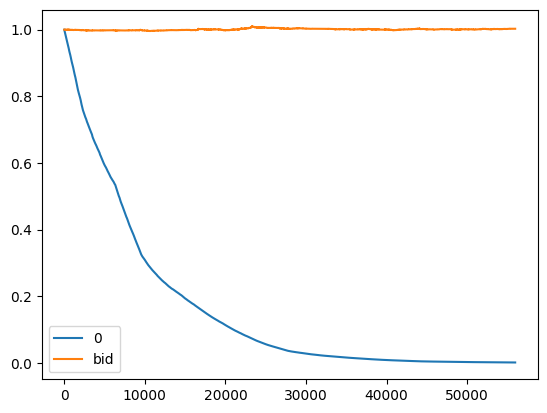

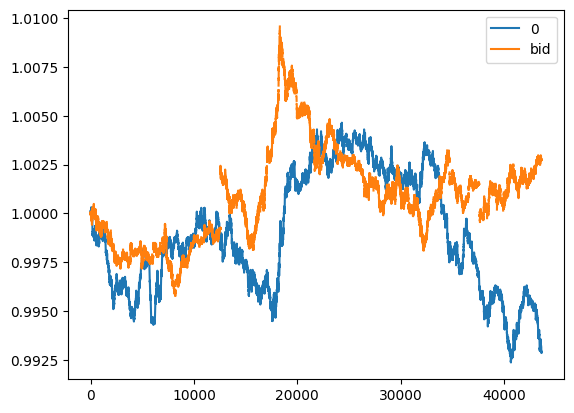

              short  neutral   long
true_short    11786     2681  10917
true_neutral  26350     6066  24791
true_long     12493     2635  12281
                 short   neutral      long
true_short    0.232791  0.235547  0.227490
true_neutral  0.520453  0.532947  0.516598
true_long     0.246756  0.231506  0.255913


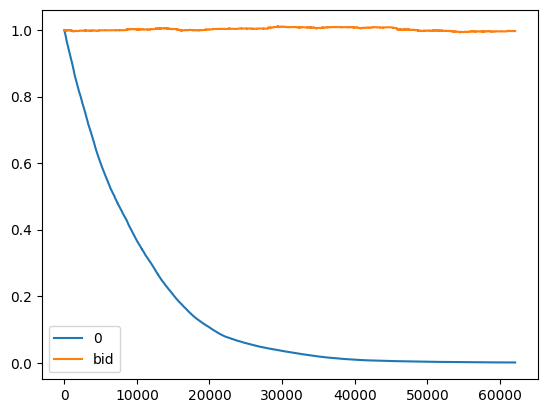

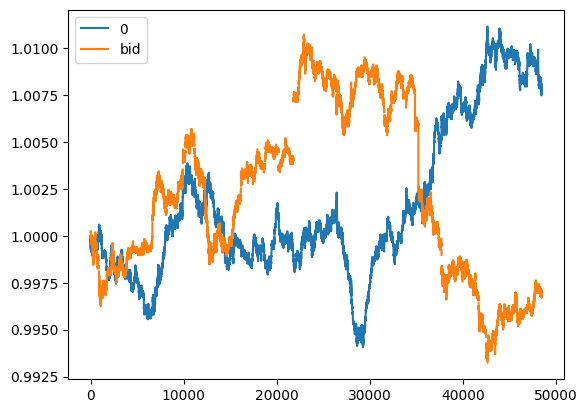


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

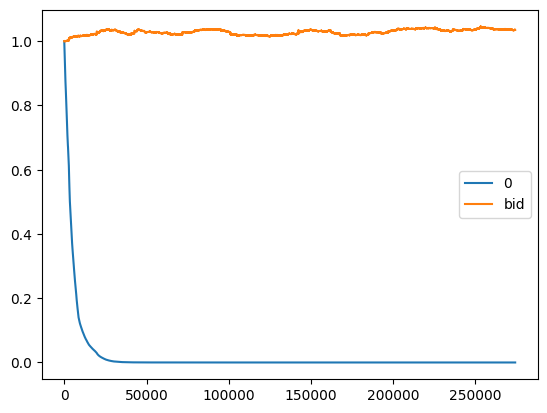

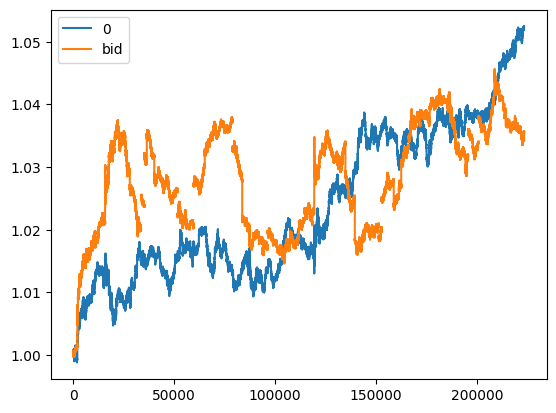

              short  neutral   long
true_short    15454     1511   8419
true_neutral  34038     3298  19871
true_long     16476     1327   9606
                 short   neutral      long
true_short    0.234265  0.246252  0.222161
true_neutral  0.515977  0.537484  0.524356
true_long     0.249757  0.216265  0.253483


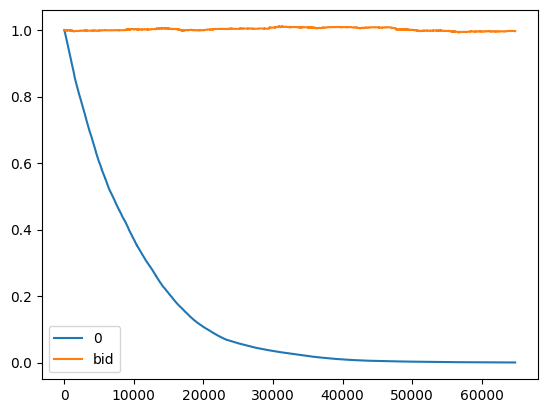

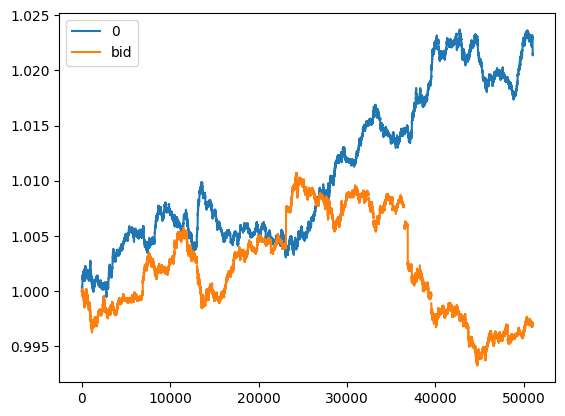

              short  neutral   long
true_short    20496     1508   9992
true_neutral  48658     3860  23695
true_long     20481     1412   9898
                 short   neutral      long
true_short    0.228661  0.222419  0.229253
true_neutral  0.542846  0.569322  0.543650
true_long     0.228493  0.208260  0.227096


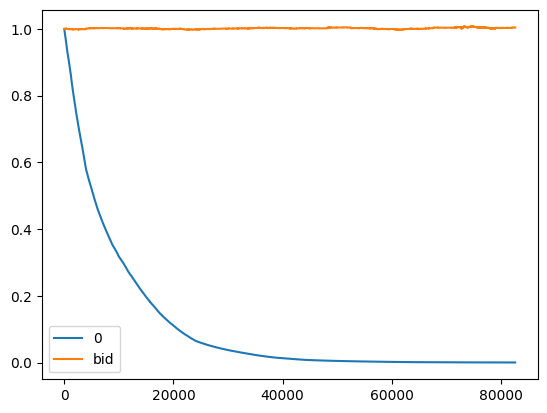

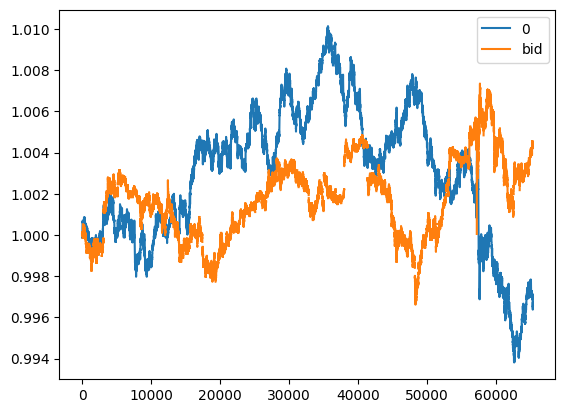


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

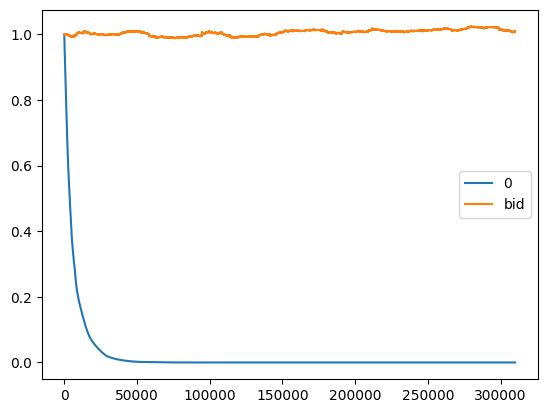

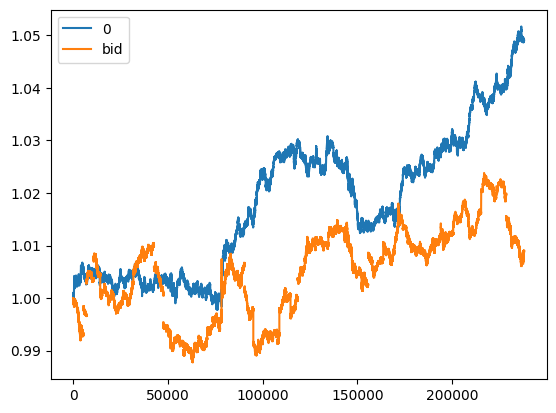

              short  neutral   long
true_short    20869      384  10743
true_neutral  48081     1009  27123
true_long     19711      433  11647
                 short   neutral      long
true_short    0.235380  0.210296  0.216973
true_neutral  0.542302  0.552574  0.547796
true_long     0.222319  0.237130  0.235231


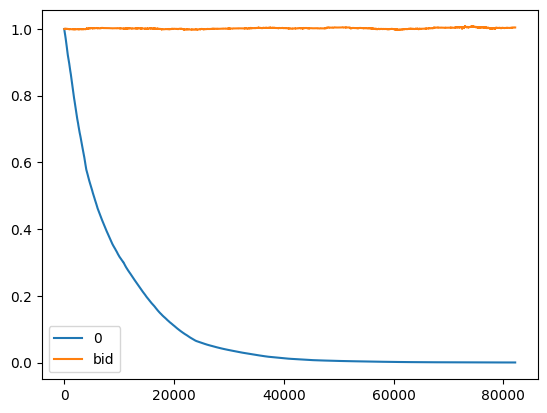

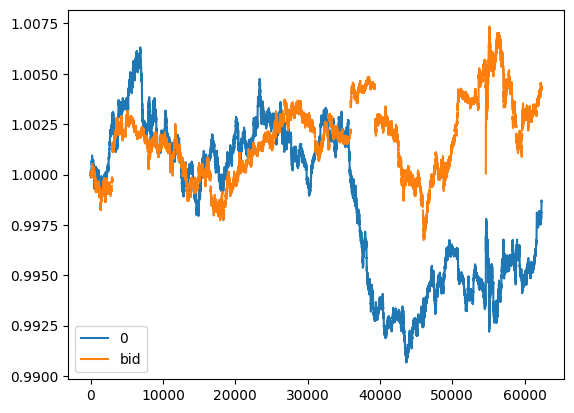

              short  neutral   long
true_short    24889      119   5775
true_neutral  60423      259  15658
true_long     27004       91   5782
                 short   neutral      long
true_short    0.221598  0.253731  0.212199
true_neutral  0.537973  0.552239  0.575344
true_long     0.240429  0.194030  0.212456


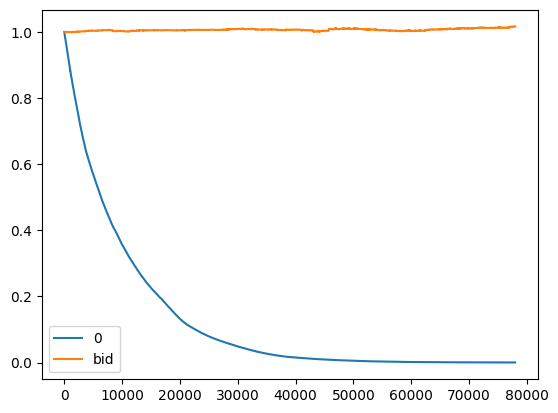

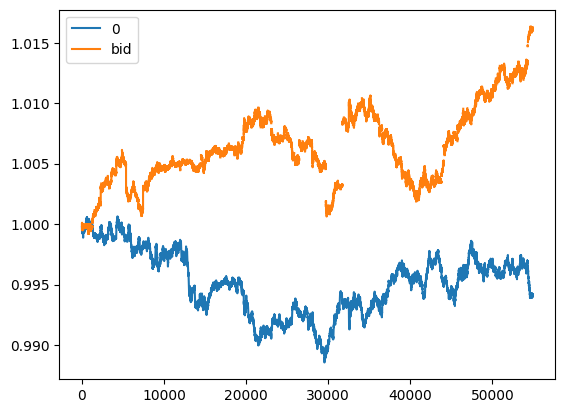


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

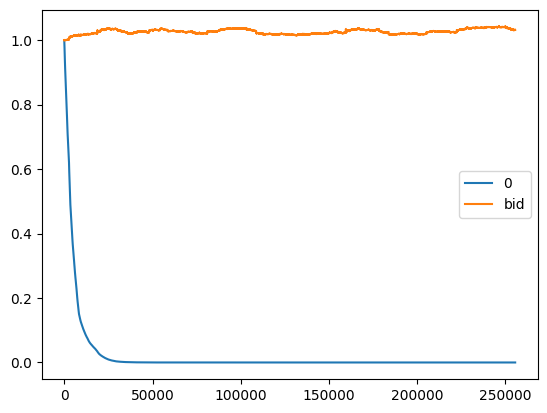

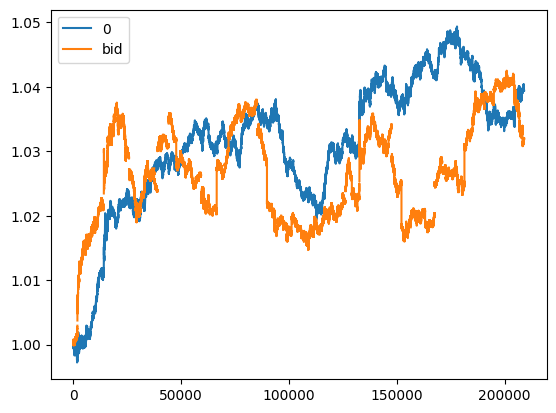

              short  neutral   long
true_short     9018     2676   9300
true_neutral  25391     7742  24177
true_long      9435     3007   9254
                 short   neutral      long
true_short    0.205684  0.199330  0.217641
true_neutral  0.579121  0.576685  0.565795
true_long     0.215195  0.223985  0.216564


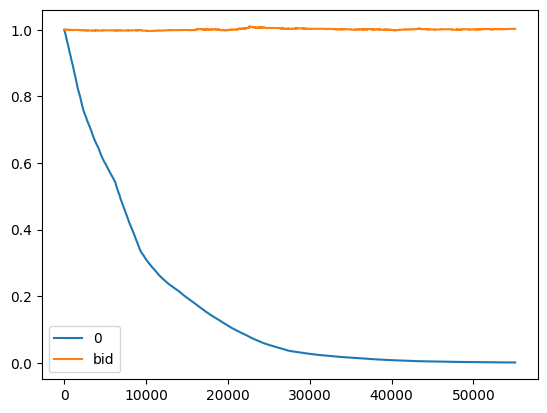

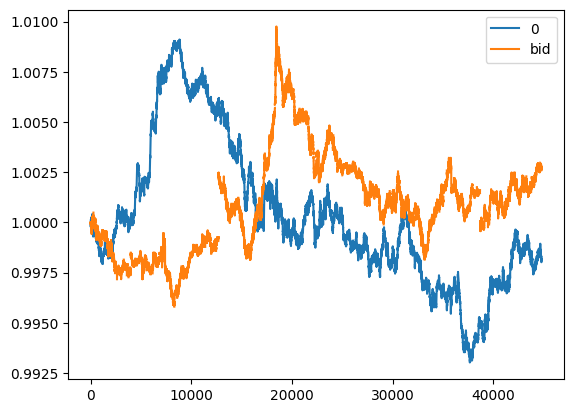

              short  neutral   long
true_short    10662     3295  11401
true_neutral  24019     8176  25051
true_long     11088     3567  12741
                 short   neutral      long
true_short    0.232952  0.219112  0.231761
true_neutral  0.524788  0.543689  0.509239
true_long     0.242260  0.237199  0.259000


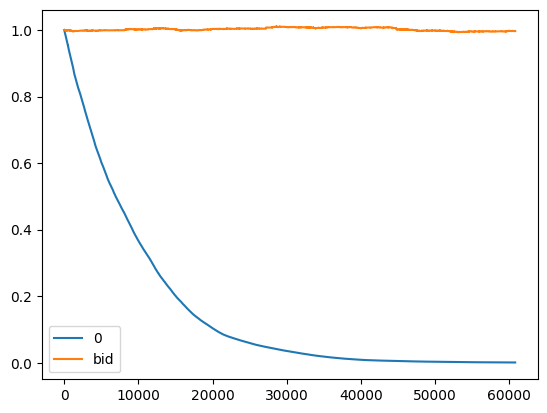

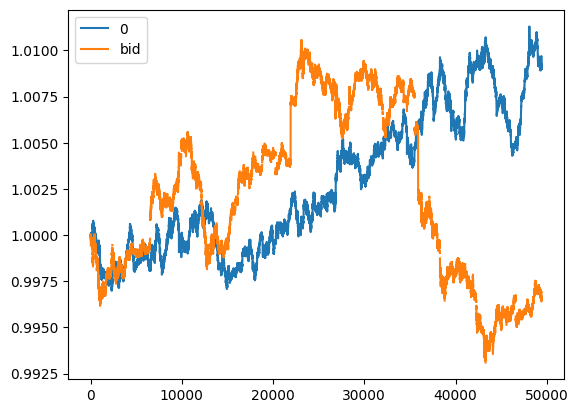


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

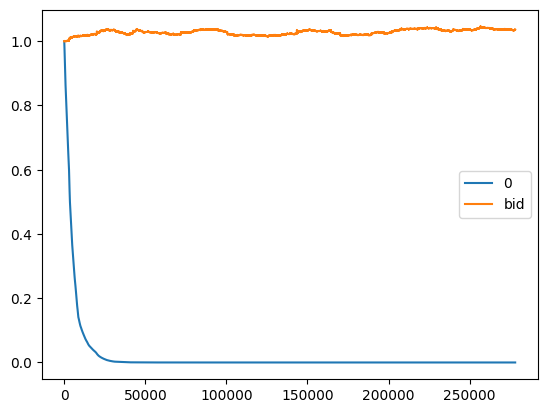

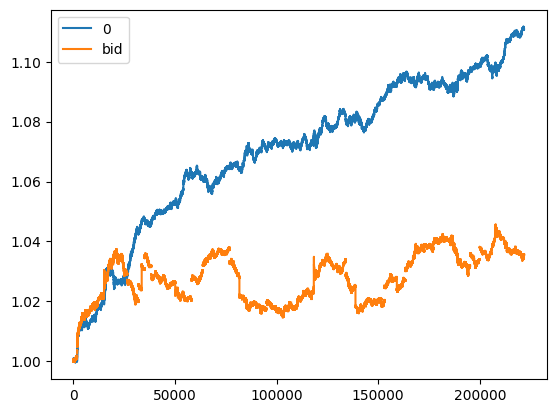

              short  neutral   long
true_short    12892     1392  11074
true_neutral  29968     3176  24102
true_long     15069     1377  10950
                 short   neutral      long
true_short    0.222548  0.234146  0.240082
true_neutral  0.517323  0.534230  0.522525
true_long     0.260129  0.231623  0.237393


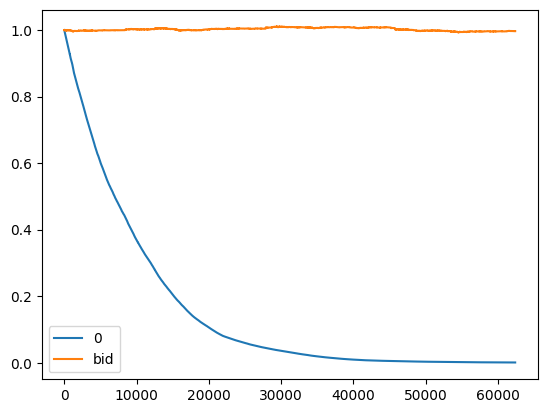

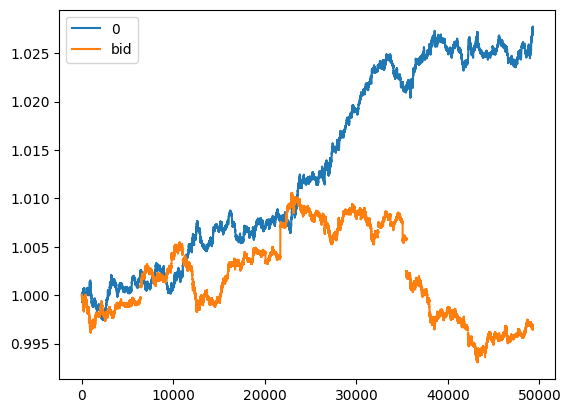

              short  neutral   long
true_short    16278     1509  14190
true_neutral  39606     3545  33064
true_long     17443     1460  12905
                 short   neutral      long
true_short    0.221992  0.231655  0.235875
true_neutral  0.540128  0.544212  0.549610
true_long     0.237880  0.224133  0.214515


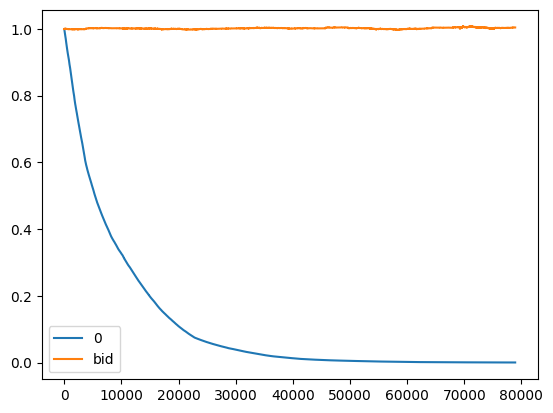

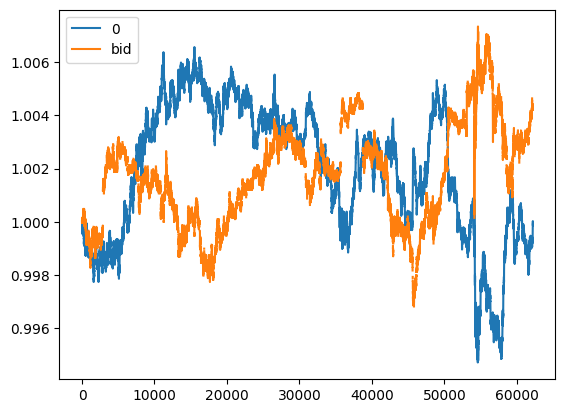


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

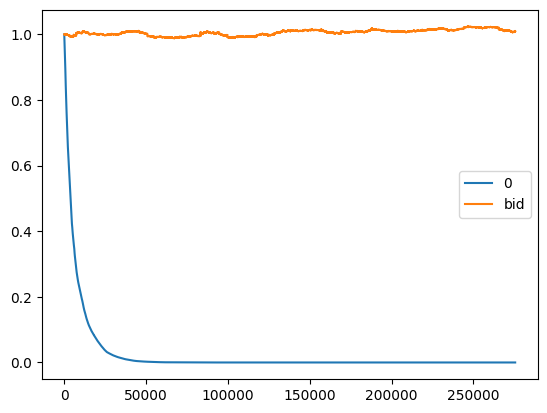

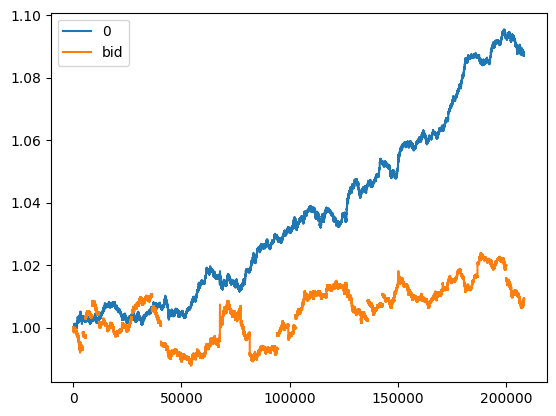

              short  neutral   long
true_short    20566     1193  10218
true_neutral  48241     3002  24972
true_long     19397     1393  11018
                 short   neutral      long
true_short    0.233164  0.213493  0.221131
true_neutral  0.546925  0.537223  0.540426
true_long     0.219911  0.249284  0.238444


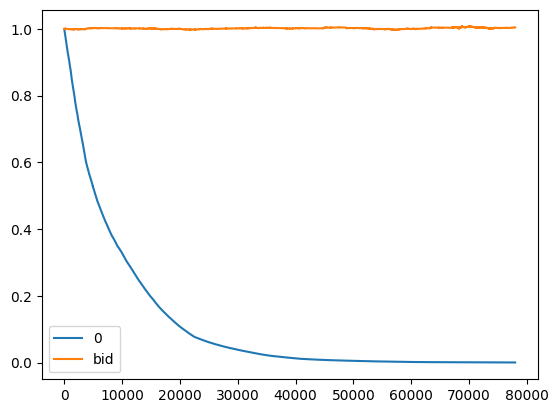

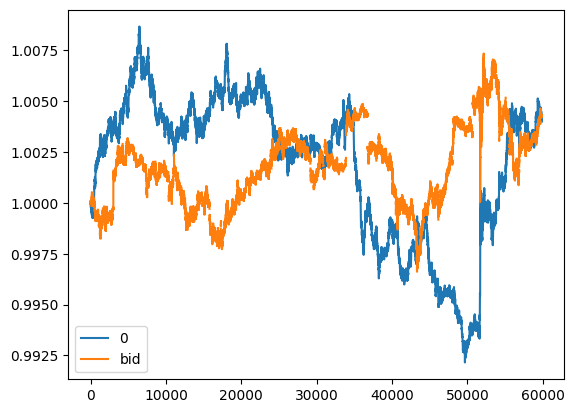

              short  neutral   long
true_short    24587      535   5679
true_neutral  58926     1389  16016
true_long     24370      717   7781
                 short   neutral      long
true_short    0.227904  0.202575  0.192665
true_neutral  0.546203  0.525937  0.543357
true_long     0.225893  0.271488  0.263977


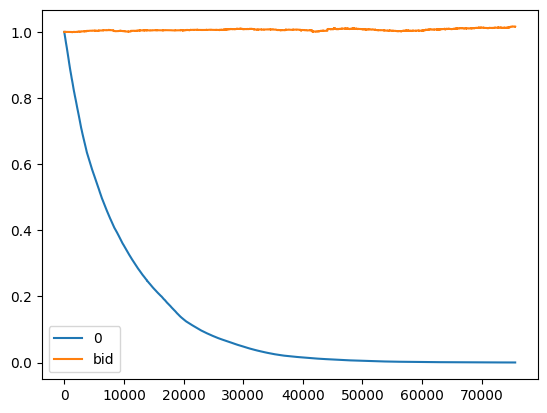

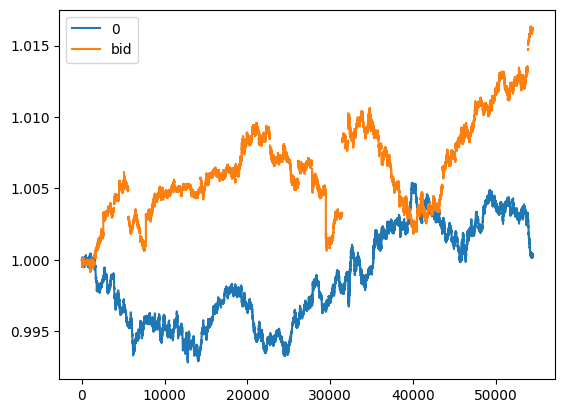


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

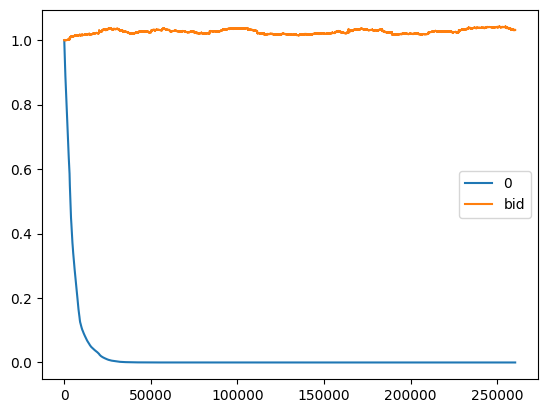

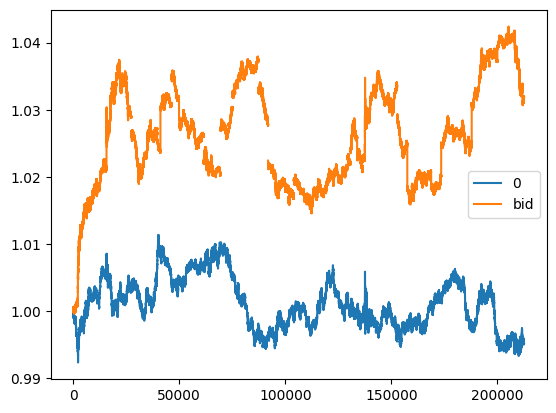

              short  neutral   long
true_short    14644     2024   4258
true_neutral  39374     5960  12044
true_long     15249     2351   4096
                 short   neutral      long
true_short    0.211414  0.195839  0.208746
true_neutral  0.568438  0.576681  0.590450
true_long     0.220148  0.227479  0.200804


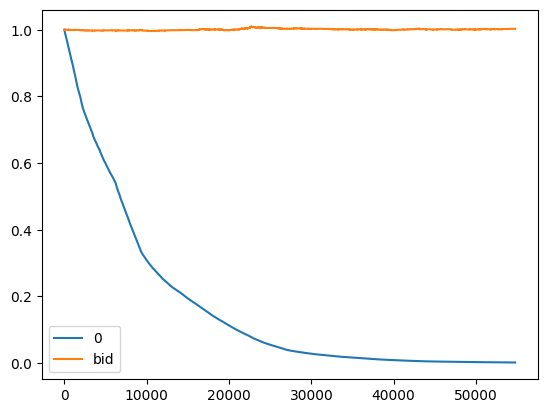

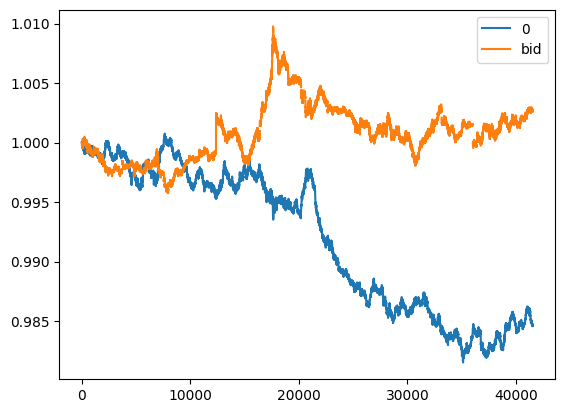

              short  neutral  long
true_short    19612     2043  3643
true_neutral  43486     5203  8621
true_long     20908     2550  3934
                 short   neutral      long
true_short    0.233460  0.208555  0.224904
true_neutral  0.517654  0.531135  0.532226
true_long     0.248887  0.260310  0.242869


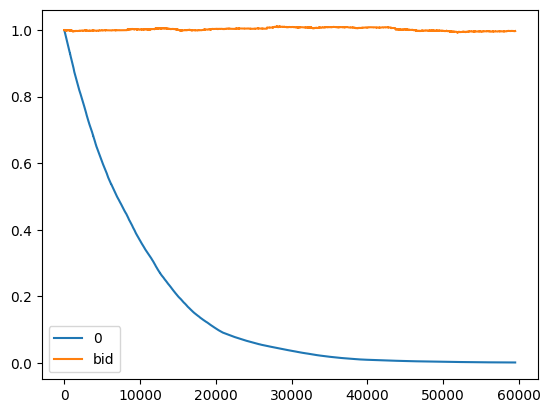

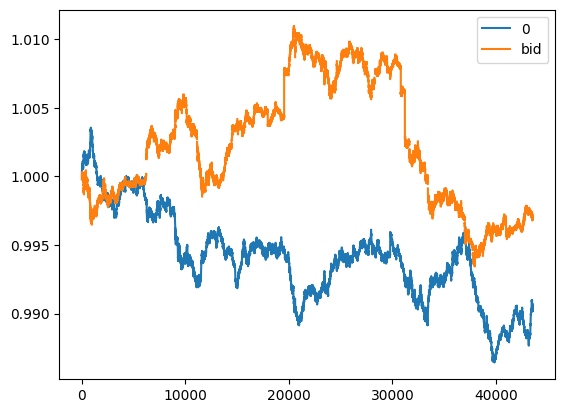


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

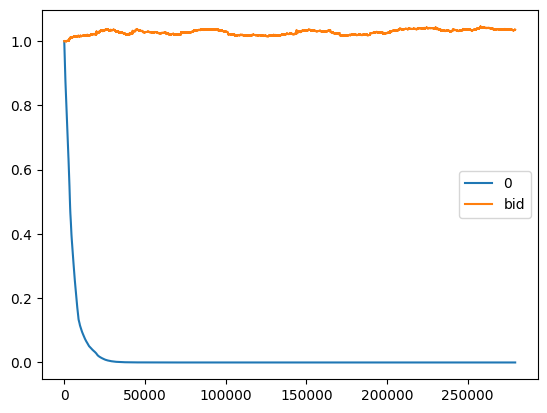

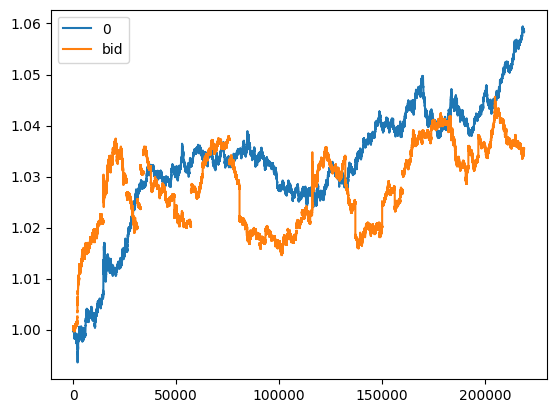

              short  neutral   long
true_short    15966     1005   8327
true_neutral  36083     2660  18567
true_long     17656     1226   8510
                 short   neutral      long
true_short    0.229051  0.205479  0.235199
true_neutral  0.517653  0.543856  0.524432
true_long     0.253296  0.250664  0.240368


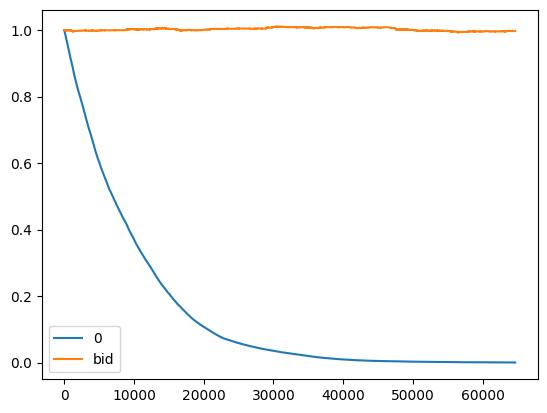

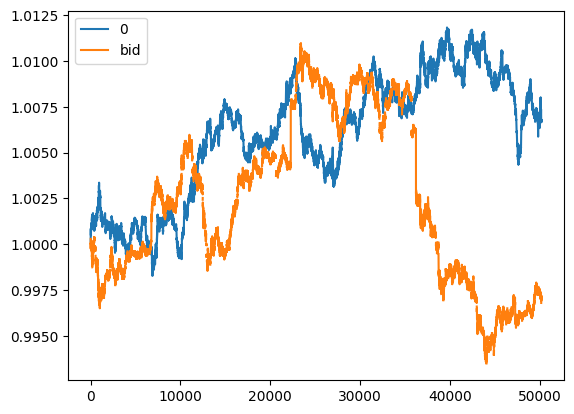

              short  neutral   long
true_short    20966     1354   9661
true_neutral  49173     3688  23354
true_long     20916     1543   9345
                 short   neutral      long
true_short    0.230256  0.205619  0.228069
true_neutral  0.540036  0.560061  0.551322
true_long     0.229707  0.234320  0.220609


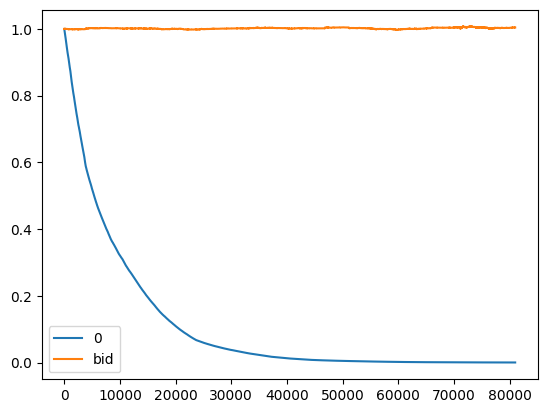

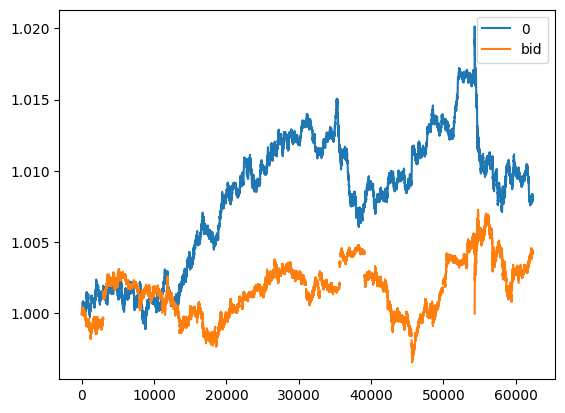


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

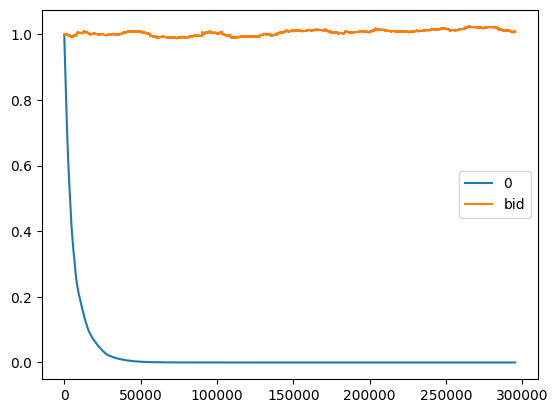

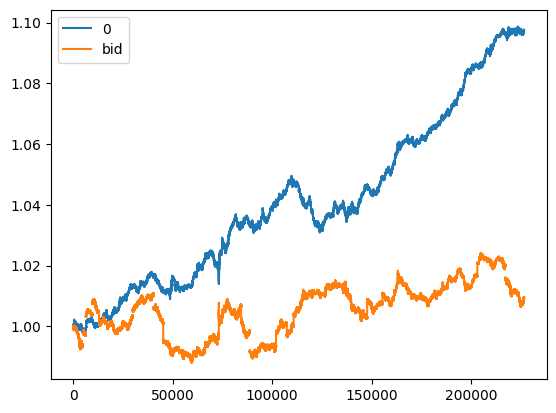

              short  neutral   long
true_short    17005     1143  13833
true_neutral  39999     2629  33587
true_long     16355     1151  14298
                 short   neutral      long
true_short    0.231805  0.232176  0.224132
true_neutral  0.545250  0.534024  0.544201
true_long     0.222945  0.233801  0.231667


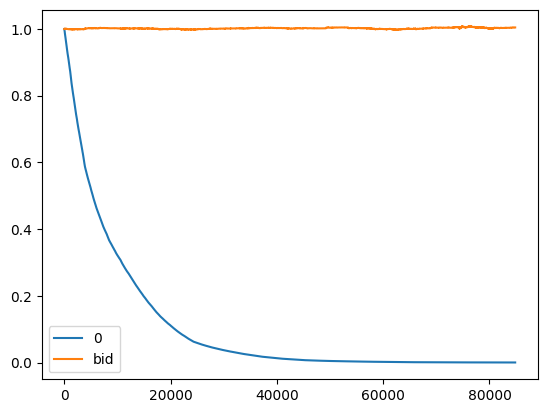

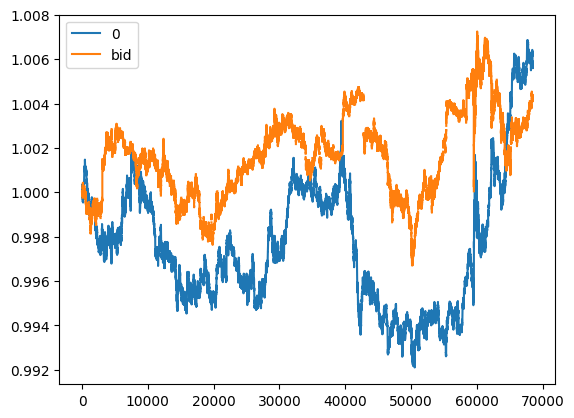

              short  neutral   long
true_short    19764      609  10415
true_neutral  46854     1299  28172
true_long     19944      593  12350
                 short   neutral      long
true_short    0.228322  0.243503  0.204468
true_neutral  0.541277  0.519392  0.553075
true_long     0.230401  0.237105  0.242456


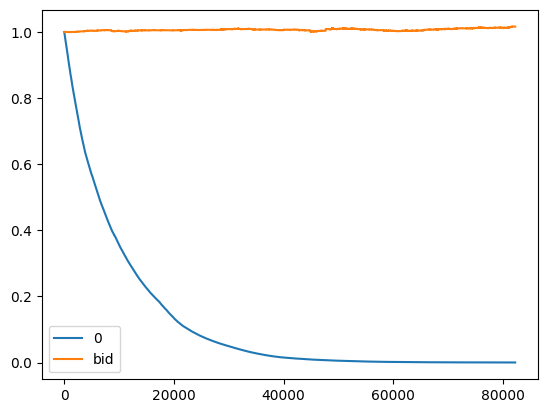

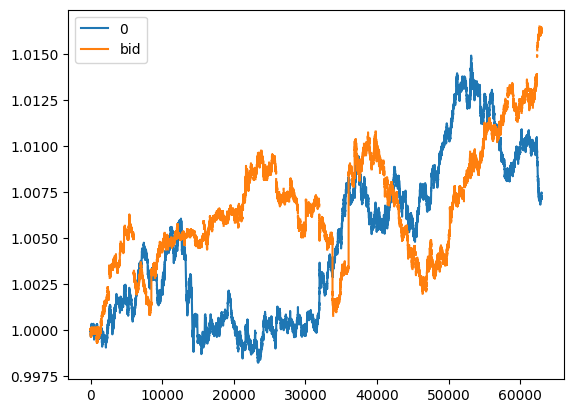


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

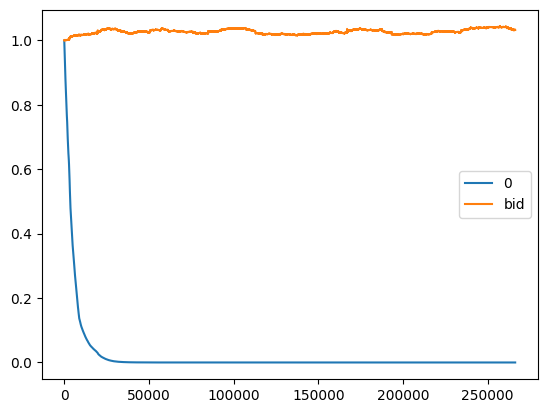

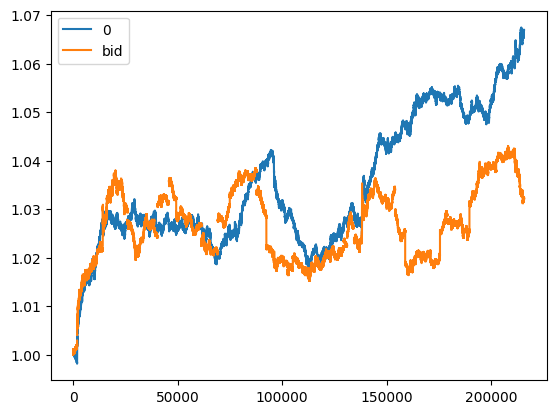

              short  neutral   long
true_short    10063     2150   8666
true_neutral  27640     5865  23856
true_long     10988     1981   8791
                 short   neutral      long
true_short    0.206671  0.215086  0.209764
true_neutral  0.567661  0.586735  0.577445
true_long     0.225668  0.198179  0.212790


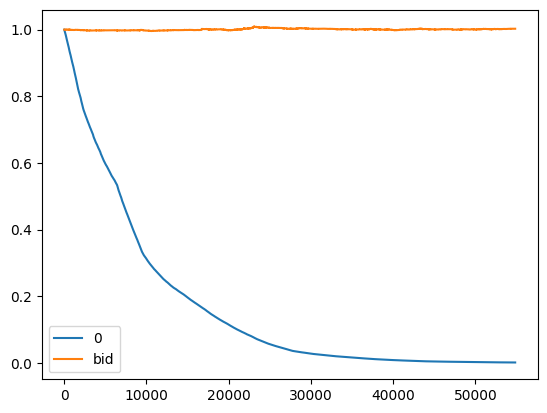

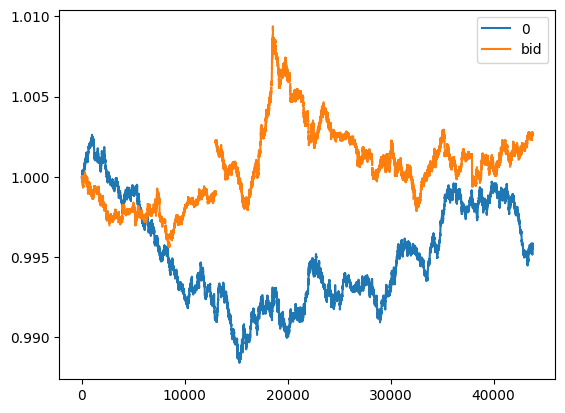

              short  neutral   long
true_short    12574     2521  10280
true_neutral  27178     5904  24093
true_long     12562     2901  11987
                 short   neutral      long
true_short    0.240356  0.222585  0.221743
true_neutral  0.519517  0.521278  0.519694
true_long     0.240127  0.256136  0.258563


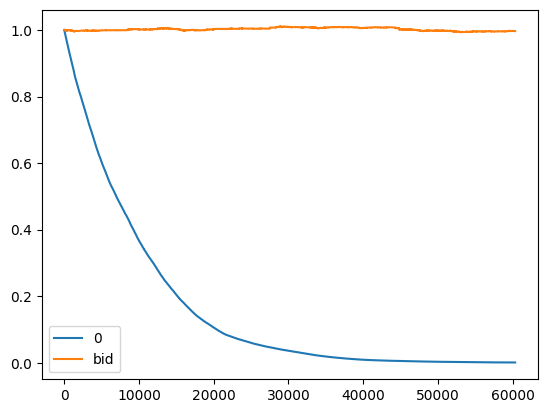

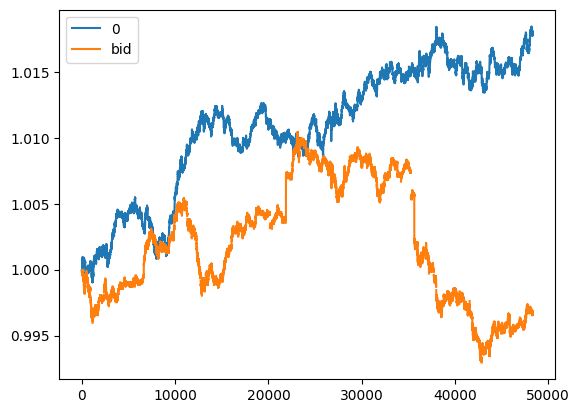


...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00380_00002.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv to /content/drive/MyDrive/github_repo/deep-lob/output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00372_00000.csv

...Will overwrite existing file: 2_min_tp4_sl2_regularized_normalization_multi_step_slice_squeeze_lob/loss_00370_00001.csv
copy output/callback_logs/2_min_tp4_sl2_regularized_normalization_multi_step_sli

In [ ]:
continue_loop = 1
end_loop = 9999
digit = 5

for run_count, hp in enumerate(hp_list[continue_loop:]):
    np.random.seed(hp.seed)
    run_count += continue_loop
    if run_count >= end_loop:
        break
    print(f'{run_count=}')
    print(hp)
    counter = get_count(base_output_folder)
    count_str = f'{counter:05}'
    print(f"{count_str=}")

    with open(fr"{base_output_folder}/run_summary/{run_prefix}/hp_{count_str}.json", 'w+') as f:
        json.dump(asdict(hp), f)

    if hp.trim == 'both':
        hp.trim = (hp.lookback, hp.lookback)

    chunk_list_gen = get_chunk_list_gen(hp.training_week+2, skip_to=pd.Timestamp(hp.skip_to), end=pd.Timestamp(hp.end), label_path=hp.label_path)

    conf_list = []

    original_count_str = count_str

    for i, rolling_chunk in enumerate(chunk_list_gen):
        count_str = f"{original_count_str}_{i:05}"

        train_chunk = concat_chunk(*rolling_chunk[:hp.training_week])
        validation_chunk = rolling_chunk[-2]
        wf_chunk = rolling_chunk[-1]

        if wf_chunk.lob.shape[0] == 0:
            break

        # train_chunk = sub_slice_chunk(train_chunk, 4)
        # validation_chunk = sub_slice_chunk(validation_chunk, 4)
        # wf_chunk = sub_slice_chunk(wf_chunk, 4)

        morning_train_chunk, afternoon_train_chunk, night_train_chunk = split_market(train_chunk)
        morning_val_chunk, afternoon_val_chunk, night_val_chunk = split_market(validation_chunk)
        morning_wf_chunk, afternoon_wf_chunk, night_wf_chunk = split_market(wf_chunk)

        chunk_list = [morning_train_chunk, afternoon_train_chunk, night_train_chunk]
        to_add = []
        if hp.up_trend_day:
            to_add += get_up_trend(chunk_list, hp.up_trend_day)
        if hp.down_trend_day:
            to_add += get_down_trend(chunk_list, hp.down_trend_day)
        if (hp.up_trend_day or hp.up_trend_day):
            chunk_list = to_add

        chunk_list_val = [morning_val_chunk, afternoon_val_chunk, night_val_chunk]
        chunk_list_wf = [morning_wf_chunk, afternoon_wf_chunk, night_wf_chunk]

        if hp.class_weight == 'balanced':
            class_weight = np.array([0.0,0.0,0.0])
            for chunk in chunk_list:
                classed = make_class(chunk.label, hp.epsilon)
                class_weight += compute_class_weight(class_weight='balanced', classes=(-1,0,1), y=np.argmax(classed.values, axis=1) - 1)
        else:
            class_weight = np.array(hp.class_weight)

        class_w_multiplier = np.array(hp.class_w_multiplier)
        class_weight = class_weight*class_w_multiplier
        class_weight = class_weight/class_weight.sum()

        hp.class_weight = tuple(class_weight)

        # up_select = int((train_chunk.label['long_wealth'] > 1).sum() * hp.trend_proportion[2])
        # side_select = int((train_chunk.label.max(1) < 1).sum() * hp.trend_proportion[1])
        # down_select = int((train_chunk.label['short_wealth'] > 1).sum() * hp.trend_proportion[0])
        # if hp.min_proportion:
        #     equal = min(s for s in [up_select, side_select, down_select] if s > 0)
        #     up_select = side_select = down_select = equal

        scaler = fit_to_chunk_list(chunk_list, hp.features, StandardScaler())

        sequence_list = get_sequence_list(chunk_list, hp.features, scaler, epsilon=hp.epsilon,
                                        lookback=hp.lookback, shuffle=hp.shuffle, batch_size=hp.batch_size,
                                        lookback_step=hp.lookback_step)

        # selected = trend_index(down_select, side_select, up_select, train_chunk,
        #                        random_neutral=hp.randomize_neutral,
        #                        random_short=hp.randomize_short,
        #                        random_long=hp.randomize_long)

        # sequence_list = [stride_data.SubSequence(sq, selected) for sq in sequence_list]

        in_sample_list = get_sequence_list(chunk_list, hp.features, scaler, shuffle=False,
                                        epsilon=hp.epsilon, lookback=hp.lookback, batch_size=10000,
                                        lookback_step=hp.lookback_step)

        # in_sample_list = [stride_data.SubSequence(sq, up_trend, add_last_batch=True) for sq in in_sample_list]

        validation_list = get_sequence_list(chunk_list_val, hp.features, scaler, shuffle=False,
                                            epsilon=hp.epsilon, lookback=hp.lookback, batch_size=10000,
                                            lookback_step=hp.lookback_step)

        wf_list = get_sequence_list(chunk_list_wf, hp.features, scaler, shuffle=False,
                                            epsilon=hp.epsilon, lookback=hp.lookback, batch_size=10000,
                                            lookback_step=hp.lookback_step)

        # up_select = int((validation_chunk.label['long_wealth'] > 1).sum() * hp.trend_proportion[2])
        # side_select = int((validation_chunk.label.max(1) < 1).sum() * hp.trend_proportion[1])
        # down_select = int((validation_chunk.label['short_wealth'] > 1).sum() * hp.trend_proportion[0])
        # if hp.min_proportion:
        #     equal = min(s for s in [up_select, side_select, down_select] if s > 0)
        #     up_select = side_select = down_select = equal

        # up_trend = trend_index(down_select, side_select, up_select, validation_chunk,
        #                        random_neutral=hp.randomize_neutral,
        #                        random_short=hp.randomize_short,
        #                        random_long=hp.randomize_long)

        # sub_validation_list = [stride_data.SubSequence(sq, up_trend, add_last_batch=True) for sq in validation_list]
        # # break
        sequence = stride_data.CombinedSequence(*sequence_list, shuffle=hp.shuffle, seed=hp.seed)
        in_sample = stride_data.CombinedSequence(*in_sample_list, shuffle=False)
        validation = stride_data.CombinedSequence(*validation_list, shuffle=False)
        # sub_validation = stride_data.CombinedSequence(*sub_validation_list, shuffle=False)

        tf.keras.utils.set_random_seed(hp.seed)
        model, callback_list = setup_model(hp, fr'output/callback_logs/{run_prefix}/loss_{count_str}.csv')
        model.build(input_shape=(None, hp.lookback, len(hp.features)))

        with open(fr"{base_output_folder}/run_summary/{run_prefix}/model_hyperparam_{count_str}.json", 'w+') as f:
            model.summary(print_fn=lambda x: model_writer(x, f))

        model.fit(x=sequence,
                use_multiprocessing=False,
                validation_data=validation,
                epochs=hp.epochs,
                verbose=1,
                callbacks=callback_list)

        plot_save_pnl2(hp, model, in_sample_list, chunk_list, count_str, prefix='in_sample', save=True)
        plot_save_pnl2(hp, model, validation_list, chunk_list_val, count_str, prefix='validation', save=True)
        plot_save_pnl2(hp, model, wf_list, chunk_list_wf, count_str, prefix=f'walk_forward', save=True)

        merge_overwrite_Tree('output/callback_logs', f"{base_output_folder}/callback_logs")
        # plot_save_pnl(sub_validation_list, [morning_val_chunk, afternoon_val_chunk, night_val_chunk], count_str, prefix='sub_validation', save=True)

In [ ]:
wf_chunk.lob.shape[0] == 0

True

In [ ]:
for run_count, hp in enumerate(hp_list[continue_loop:]):
    break
plot_save_pnl2(hp, model, in_sample_list, chunk_list, count_str, prefix='in_sample', save=True)
plot_save_pnl2(hp, model, validation_list, chunk_list_val, count_str, prefix='validation', save=True)

In [ ]:
for f in os.listdir(f"/content/output/callback_logs/{run_prefix}"):
    files.download(f"/content/output/callback_logs/{run_prefix}/{f}")

In [ ]:
plot_save_pnl(in_sample_list, chunk_list, count_str, prefix='in_sample', save=False)
plot_save_pnl(validation_list, chunk_list_val, count_str, prefix='validation', save=False)

In [ ]:
sequence[0][0].shape

In [ ]:
model.summary()

In [ ]:
hp.class_w_multiplier = (0.5,1,0.5)

In [ ]:
class_weight = np.array([0.0,0.0,0.0])
for chunk in chunk_list:
    classed = make_class(chunk.label, hp.epsilon)
    class_weight += compute_class_weight(class_weight='balanced', classes=(-1,0,1), y=np.argmax(classed.values, axis=1) - 1)

init_class_weight_sum = class_weight.sum()

class_w_multiplier = np.array(hp.class_w_multiplier)/sum(hp.class_w_multiplier)
class_weight = class_weight*class_w_multiplier
class_weight = class_weight*init_class_weight_sum/class_weight.sum()

class_weight

In [ ]:
sq_list = validation_list



In [ ]:


tbt = TimeSeriesBT(bid_ask_df, pred_series.shift(1))
pnl = tbt.backtest(4, 2, pd.Timedelta(2, 'm'), use_mid=True)

In [ ]:
pnl.index = pnl.index.astype(str)
pnl.plot()

In [ ]:
pred_series.sort_index().shift(1).loc['2023-01-30 09:06:04.000':]

In [ ]:
buy_sell = pred_series.shift(1).diff().fillna(0)
base_exposure = pred_series.shift(1)[buy_sell != 0]
base_exposure

In [ ]:
bid_ask_series[buy_sell.reindex(bid_ask_series.index).fillna(0) != 0]

In [ ]:
time_series =
datetime.time(21,5,00)

In [ ]:
bought = bid_ask_series[buy]
sold = bid_ask_series[sell]
wealth_change_bought = (-bought['ask'] - 10/1000)
wealth_change_sold = (sold['bid'] - 10/1000)


In [ ]:
cash = pd.concat([wealth_change_sold, wealth_change_bought]).sort_index().cumsum()
pnl = cash.reindex(asset.index).ffill() + asset
# pnl.index = pnl.index.astype(str)
pnl.plot()
(bid_ask_series['bid'] - 400).plot()

In [ ]:
signal = huh.argmax(1) - 1
signal

In [ ]:
validation[2][1].mean(0)

In [ ]:
up_select = int((train_chunk.label['long_wealth'] > 1).sum() / 2)
side_select = int((train_chunk.label.max(1) < 1).sum() / 2)
down_select = int((train_chunk.label['short_wealth'] > 1).sum() / 2)
equal = min(up_select, side_select, down_select)

In [ ]:
scaler = fit_to_chunk_list([morning_train_chunk, afternoon_train_chunk, night_train_chunk], hp.features, StandardScaler())

sequence_list = get_sequence_list([morning_train_chunk, afternoon_train_chunk, night_train_chunk], hp.features, scaler, epsilon=1.000,
                   lookback=hp.lookback, shuffle=False, batch_size=hp.batch_size)

up_trend = trend_index(equal,equal,equal, train_chunk, random_neutral=True)

sequence_list = [stride_data.SubSequence(sq, up_trend) for sq in sequence_list]

In [ ]:
in_sample_list = get_sequence_list([morning_train_chunk, afternoon_train_chunk, night_train_chunk], hp.features, scaler,
                                    epsilon=1.000, lookback=hp.lookback, batch_size=9999999)
# in_sample_list = [stride_data.SubSequence(sq, up_trend, add_last_batch=True) for sq in in_sample_list]

# val_up = (validation_chunk.label['long_wealth'] > 1).sum()

# up_trend_val = trend_index(0,val_up,val_up, validation_chunk)

validation_list = get_sequence_list([morning_val_chunk, afternoon_val_chunk, night_val_chunk], hp.features, scaler,
                                     epsilon=1.000, lookback=hp.lookback, batch_size=9999999)
# validation_list = [stride_data.SubSequence(sq, up_trend_val, add_last_batch=True) for sq in validation_list]


In [ ]:
sequence = stride_data.CombinedSequence(*sequence_list, shuffle=hp.shuffle, seed=hp.seed)
in_sample = stride_data.CombinedSequence(*in_sample_list, shuffle=False)
validation = stride_data.CombinedSequence(*validation_list, shuffle=False)

In [ ]:
in_sample_list[0][0][1].mean(0)

In [ ]:
plot_save_pnl(in_sample_list, [morning_train_chunk, afternoon_train_chunk, night_train_chunk], '0', prefix='in_sample', save=False)
plot_save_pnl(validation_list, [morning_val_chunk, afternoon_val_chunk, night_val_chunk], '0', prefix='validation', save=False)
# plot_save_pnl(valida, uptrend_chunk_list, count_str, prefix='train')

In [ ]:
# sq = sequence_list[0]
# selected_idx = trend_index(0,100000,100000, train_chunk)

# class SubSequence(Sequence):
#     def __init__(self, sd: stride_data.StrideData, selected_idx):
#         self.batch_size = sd.batch_size
#         self.sd = sd

#         self.key_dict = {}
#         query_dict = {}
#         batch_count = 0
#         sequence_count = 0

#         for i in range(len(sd)):
#             target_idx = sd.get_target_indices(i)
#             selected_bool = pd.Index(target_idx).isin(selected_idx)
#             batch_count += selected_bool.sum()

#             if batch_count < self.batch_size:
#                 query_dict[i] = np.argwhere(selected_bool)[:,0]

#             else:
#                 batch_count -= self.batch_size
#                 query_arr = np.argwhere(selected_bool)[:,0]
#                 cut = query_arr.shape[0] - batch_count

#                 query_dict[i] = query_arr[:cut]
#                 self.key_dict[sequence_count] = query_dict

#                 query_dict = {}
#                 query_dict[i] = query_arr[cut:]
#                 sequence_count += 1

#     def get_query_dict(self, input_idx):
#         if input_idx < 0:
#             input_idx = len(self.key_dict) - input_idx
#         return self.key_dict[input_idx]

#     def __len__(self):
#         len(self.key_dict)

#     def __getitem__(self, input_idx):
#         query_dict = self.get_query_dict(input_idx)
#         X_list = []
#         y_list = []
#         for k, query in query_dict.items():
#             print(query)
#             X, y = self.sd[k]
#             X_list.append(X[query])
#             y_list.append(y[query])
#             print(y[query].mean(0))
#         return np.vstack(X_list), np.vstack(y_list)

#     def on_epoch_end(self):
#         self.sd.on_epoch_end()

#     def get_target_indices(self, input_idx):
#         query_dict = self.get_query_dict(input_idx)
#         indices_list = []
#         for k, query in query_dict.items():
#             idx = pd.Index(self.sd.get_target_indices(k))[query]
#             indices_list.append(idx.values)

#         return np.hstack(indices_list)

# uptrend_sq = SubSequence(sq, selected_idx)

In [ ]:
y = uptrend_sq[8][1]

In [ ]:
uptrend_sq.sd[0]

In [ ]:

plot_save_pnl(wf_sequence_list, uptrend_chunk_list_wf, count_str, prefix='validation_early')
plot_save_pnl(big_batch_sequence_list, uptrend_chunk_list, count_str, prefix='train_early')


In [ ]:
output_list = []
for sq in big_batch_sequence_list:
    for X, y in sq:
        output = model.predict(X, verbose=1)
        confusion += get_confusion(y, output)
        output_list.append(output)
print(confusion)
print(confusion/confusion.sum(0))
plot_pnl(output_list, big_batch_sequence_list, uptrend_chunk_list)

In [ ]:
stop

In [ ]:
chunk_list_gen = get_chunk_list_gen(hp.training_week+1, skip_to=hp.skip_to, end=hp.end)

conf_list = []

for i, chunk_list in enumerate(chunk_list_gen):

    train_chunk = concat_chunk(*chunk_list[:hp.training_week])
    walk_forward_chunk = chunk_list[-1]

    morning_train_chunk, afternoon_train_chunk, night_train_chunk = split_market(train_chunk)
    morning_wf_chunk, afternoon_wf_chunk, night_wf_chunk = split_market(walk_forward_chunk)

    print(make_class(night_train_chunk.label, 1.0000).mean())

    X_list = []
    y_list = []

    epsilon=1.0000

    for i, chunk in enumerate([morning_train_chunk, afternoon_train_chunk, night_train_chunk]):
        X = chunk.lob.loc[:, hp.features]
        y = make_class(chunk.label, epsilon)
        X = X.reindex(y.index)
        y = y.reindex(X.index)
        X_list.append(X)
        y_list.append(y)

    scaler = StandardScaler()
    scaler.fit(pd.concat(X_list))

    sp_generator_list = []

    for i, chunk in enumerate([morning_train_chunk, afternoon_train_chunk, night_train_chunk]):

        X = chunk.lob.loc[:, hp.features]
        X = pd.DataFrame(scaler.transform(X), index=X.index, columns=X.columns)
        y = make_class(chunk.label, epsilon)
        X = X.reindex(y.index)
        y = y.reindex(X.index)
        #transform y here

        sp_generator : List[stride_data.SequencePair] = stride_data.create_train_val_sequence_cv(
            X, y, cv=hp.cv, lookback=hp.lookback,
            batch_size=hp.batch_size, batch_no=hp.batch_no[i],
            shuffle=hp.shuffle, trim=hp.trim, replace=hp.replace)

        sp_generator_list.append(sp_generator)

    wf_sequence_list = []

    for i, chunk in enumerate([morning_wf_chunk, afternoon_wf_chunk, night_wf_chunk]):

        X = chunk.lob.loc[:, hp.features]
        X = pd.DataFrame(scaler.transform(X), index=X.index, columns=X.columns)
        y = make_class(chunk.label, epsilon)
        X = X.reindex(y.index)
        y = y.reindex(X.index)
        #transform y here

        wf_sequence : stride_data.StrideData = stride_data.StrideData(X, y, lookback=hp.lookback,
                                                batch_size=y.shape[0] - hp.lookback, batch_no=None,
                                                shuffle=False, replace=False)

        wf_sequence_list.append(wf_sequence)

    early_stopper = tf.keras.callbacks.EarlyStopping(
        monitor="val_loss",
        min_delta=0,
        patience=50,
        verbose=1,
        mode="auto",
        baseline=None,
        restore_best_weights=False,
    )

    # for cv_count in range(hp.cv): #just have train-validation
    sp_list = [next(sp_gen) for sp_gen in sp_generator_list]
    sq = stride_data.CombinedSequence(*[sp.train_sequence for sp in sp_list], shuffle=hp.shuffle, seed=hp.seed, replace=hp.replace)
    test_tuple = np.vstack([sp.test_tuple[0] for sp in sp_list]), np.vstack([sp.test_tuple[1] for sp in sp_list])

    csv_logger = CSVLogger(fr'{base_output_folder}\callback_logs\{run_prefix}\_temp\{run_prefix}.csv')
    lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=hp.init_learning_rate,
        decay_steps=hp.decay_steps,
        decay_rate=hp.lr_decay)
    try:
        opt = opt_dict[hp.opt](learning_rate=lr_schedule)
    except Exception:
        print(f"{hp.opt} does not work with scheduler")
        opt = opt_dict[hp.opt](learning_rate=hp.init_learning_rate)

    # model = tf.keras.Sequential()
    # for l, p in schematic_dict[hp.schematic]:
    #     model.add(l(**p))

    # model.add(layers.Dense(3, activation='softmax')) # add output node

    model_maker = model_maker_dict[hp.schematic]

    model = model_maker(hp.lookback, len(hp.features), hp.lob_unit, hp.inception_unit, hp.lstm_unit)

    model.compile(loss=loss_dict[hp.loss], optimizer=opt, metrics=[], weighted_metrics=[])
    # with tf.device('/cpu:0'):
    model.fit(x=sq,
            use_multiprocessing=False,
            validation_data=test_tuple,
            epochs=hp.epochs,
            verbose=1,
            callbacks=[csv_logger, early_stopper])

    confusion = pd.DataFrame(0,
                            index=['true_short', 'true_neutral', 'true_long'],
                            columns=['short', 'neutral', 'long'])
    for wf in wf_sequence_list:
        output = model.predict(wf[0][0])
        confusion += get_confusion(wf[0][1], output)
    conf_list.append(confusion)

In [ ]:
print(conf_list)

In [ ]:
wf_sequence_list[0].get_target_indices(0)

In [ ]:
confusion = pd.DataFrame(0,
                        index=['true_short', 'true_neutral', 'true_long'],
                        columns=['short', 'neutral', 'long'])
for wf in wf_sequence_list:
    output = model.predict(wf[0][0])
    confusion += get_confusion(wf[0][1], output)

print(confusion)
print(confusion/confusion.sum())